#### EXAFS Data reduction for transmission XAS

In [1]:
# step 0: imports
import sys
sys.path.insert(0, r"C:\Users\kwill\Keenan_UCB-O365\OneDrive_UCB-O365\GitHub_Repos\xraylarch") #Path to larch 
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.interpolate import interp1d
from larch.io import read_athena, read_ascii
from larch.xafs import (pre_edge, autobk, xftf, 
                        ff2chi, feffpath, feffit_transform, feffit_dataset, feffit, feffit_report, TransformGroup, path2chi)
from larch.fitting import param, guess, param_group
from larch.plot.plotly_xafsplots import (plot_mu, plot_chik, plot_chir, plot_chifit, 
                                         multi_plot, plotlabels, set_label_weight)
from larch.utils import group2dict
from pathlib import Path
from larch.wxlib import plotlabels as plab 
from scipy.signal import savgol_filter   
try:
    # Try the newer name first
    from scipy.integrate import simpson as integrate_method
except ImportError:
    try:
        # Try the older name
        from scipy.integrate import simps as integrate_method
    except ImportError:
        # Fall back to trapz which is always available
        from scipy.integrate import trapz as integrate_method
        print("Note: Using trapz for integration instead of simpson/simps")      
import matplotlib.cm as cm  
from larch import Group                                
import os 

Loading project: S10_0p1_PbBr2_MAF_calibrated_merged
Loading project: S11_0p1_PBBR2_MAAc_calibrated_PbL3
Loading project: S14_0p3_PbBr2_MAAC_calibrated_PbL3
Loading project: S15_0p3_PbBr2_MAP_calibrated_PbL3
Loading project: S17_0p5_PbBr2_MAAc_calibrated_PbL3
Loading project: S18_0p5_PbBr2_MAP_calibrated_PbL3
Loading project: S1_0P1_PbI2_MAF_PbEdge
Loading project: S4_0p3_PbI2_MAF_calibrated
Loading project: S6_PbI2_0p3_MAP_calibrated

Project: S10_0p1_PbBr2_MAF_calibrated_merged
Available groups: ['S10_0p1_PbBr2_MAF_pos24_merge_8_PbEdge']
S10_0p1_PbBr2_MAF_pos24_merge_8_PbEdge: e0 = 13029.3272478407, edge_step = 0.8747199293236151

Project: S11_0p1_PBBR2_MAAc_calibrated_PbL3
Available groups: ['S11_0p1_PbBr2_MAAc_pos24_merge_9_clean_PbL3']
S11_0p1_PbBr2_MAAc_pos24_merge_9_clean_PbL3: e0 = 13037.3272478407, edge_step = 0.1882930160341698

Project: S14_0p3_PbBr2_MAAC_calibrated_PbL3
Available groups: ['S14_0p3_PbBr2_MAAc_pos24_merge_9_clean_PbL3']
S14_0p3_PbBr2_MAAc_pos24_merge_9_clean_

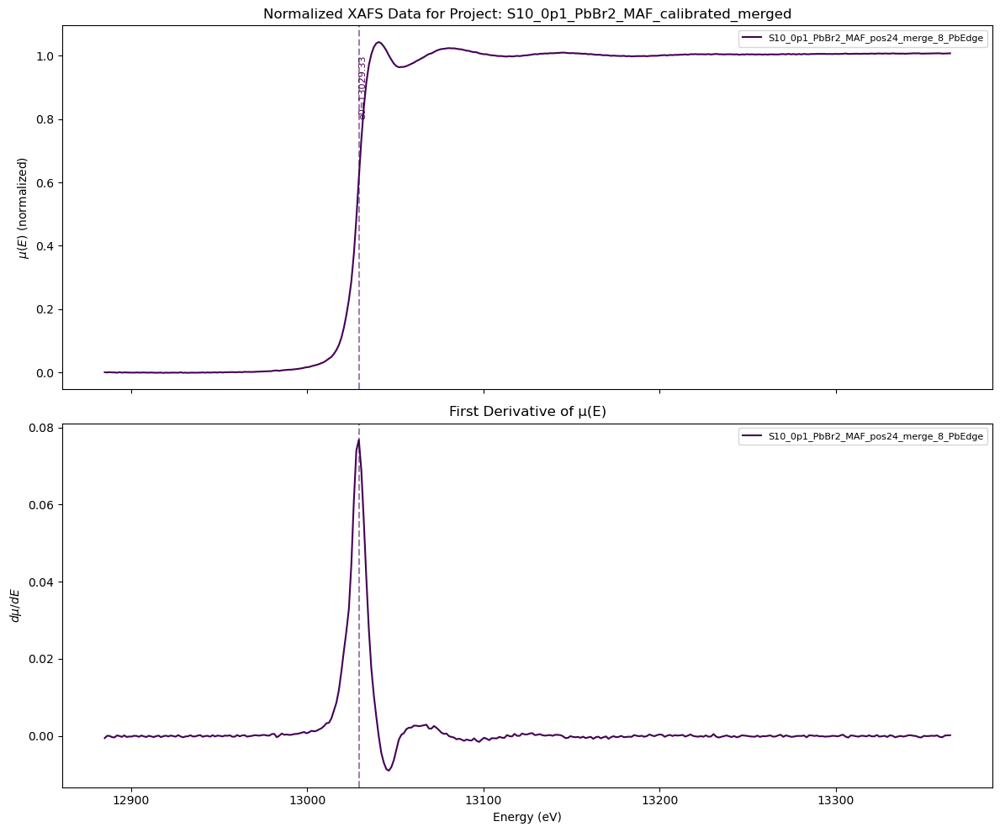

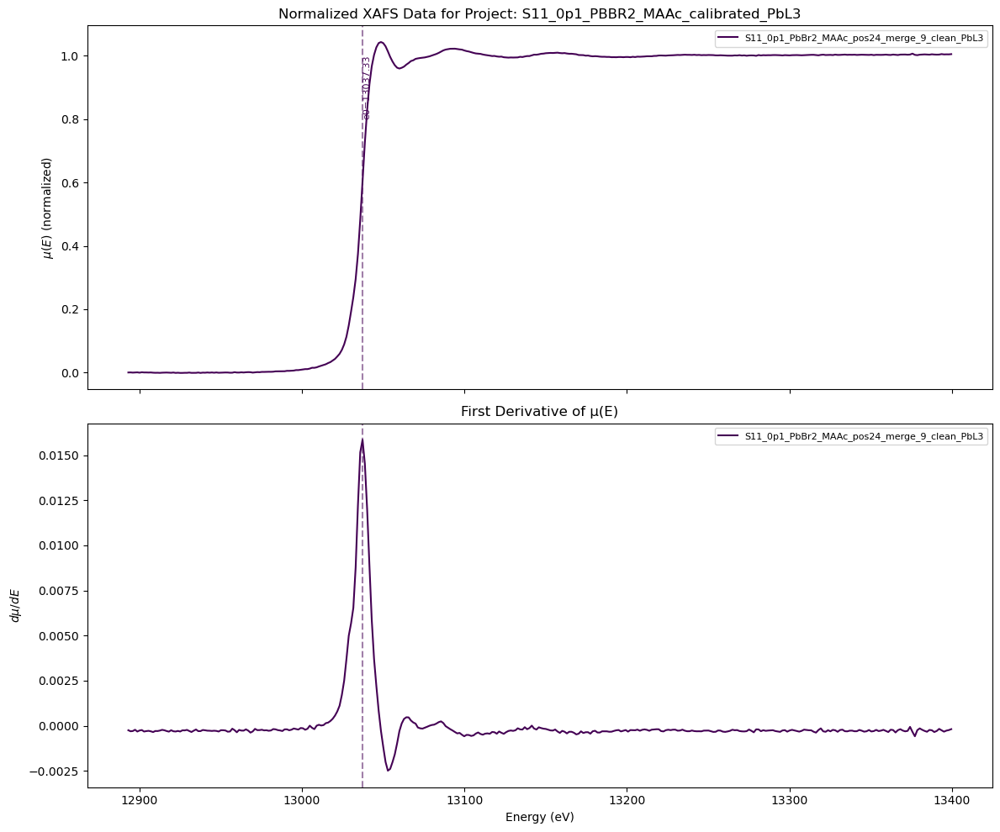

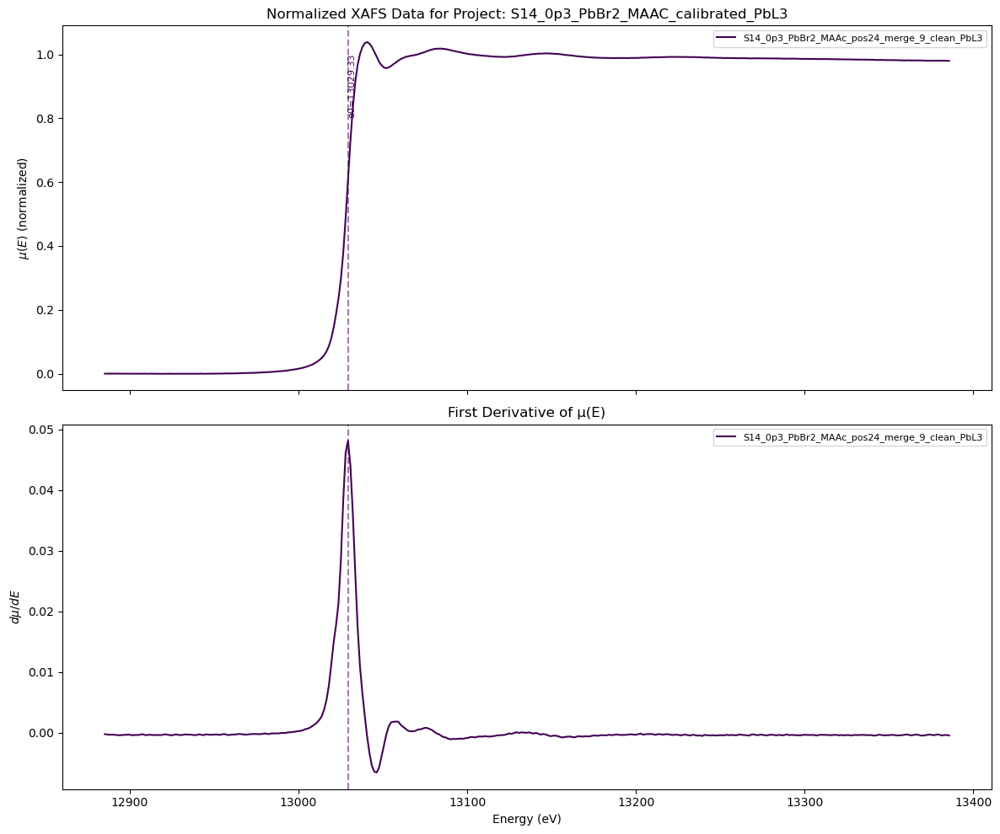

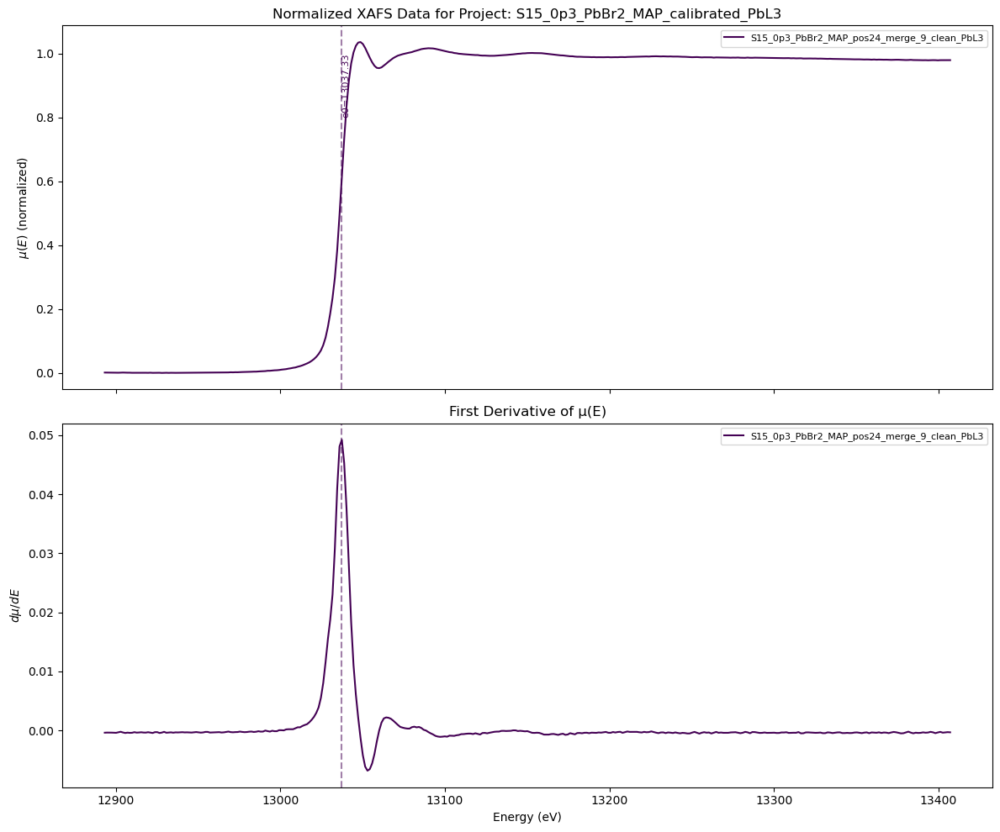

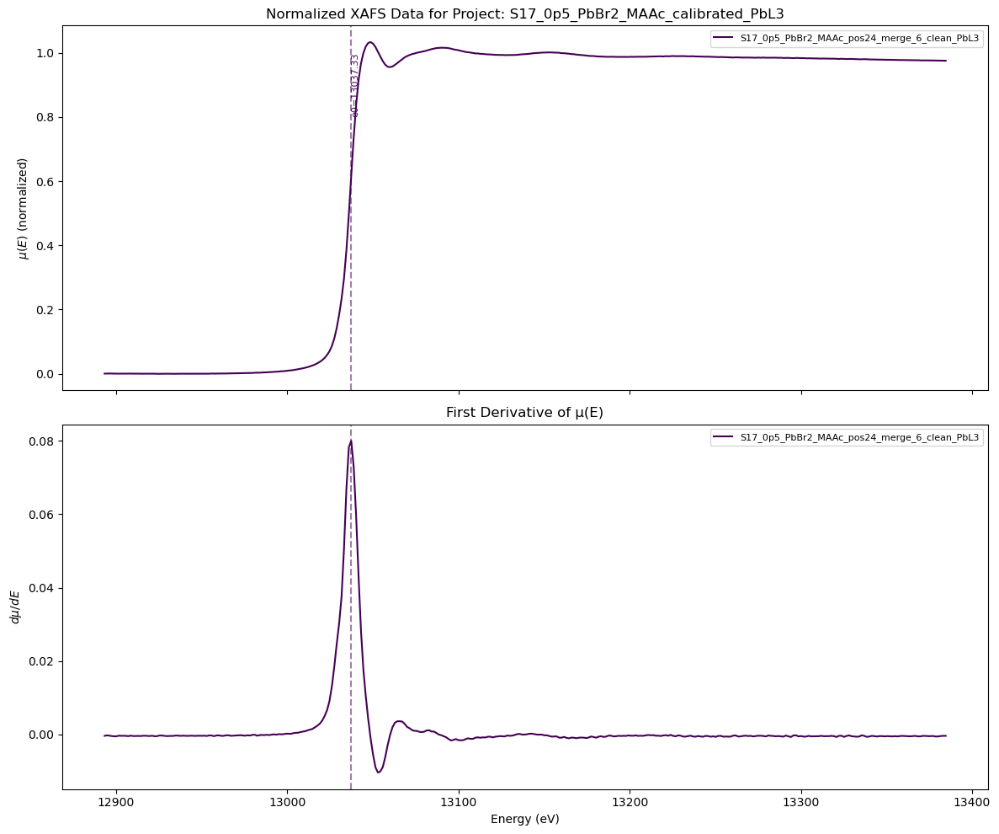

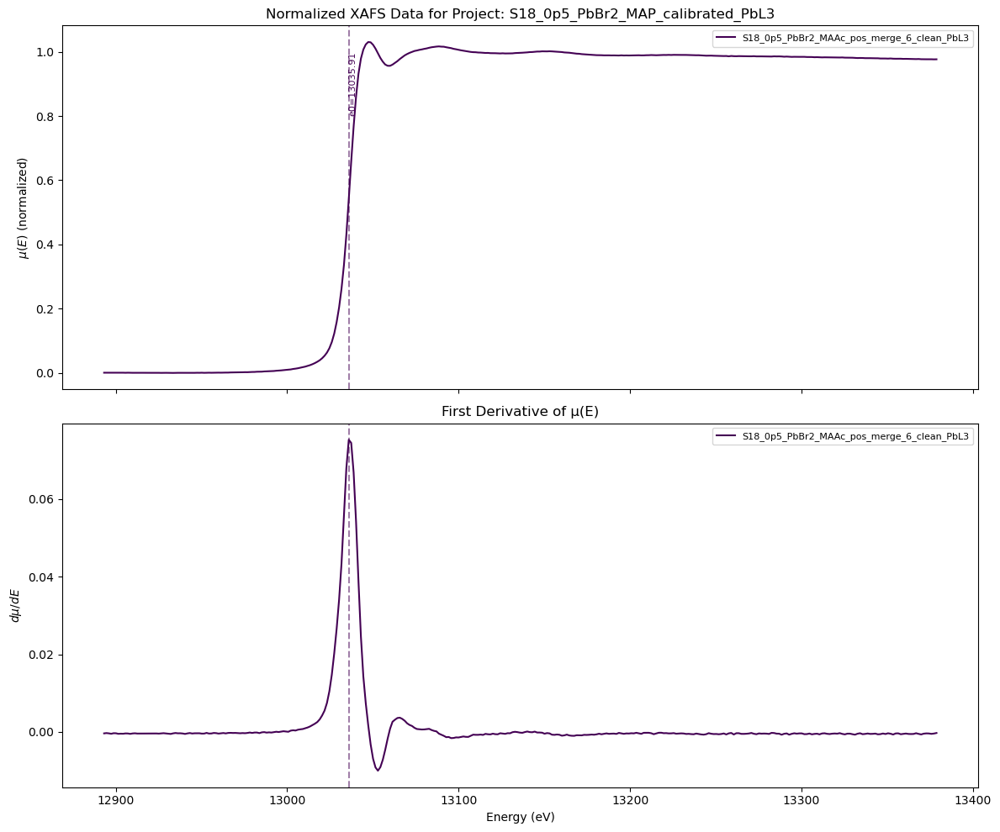

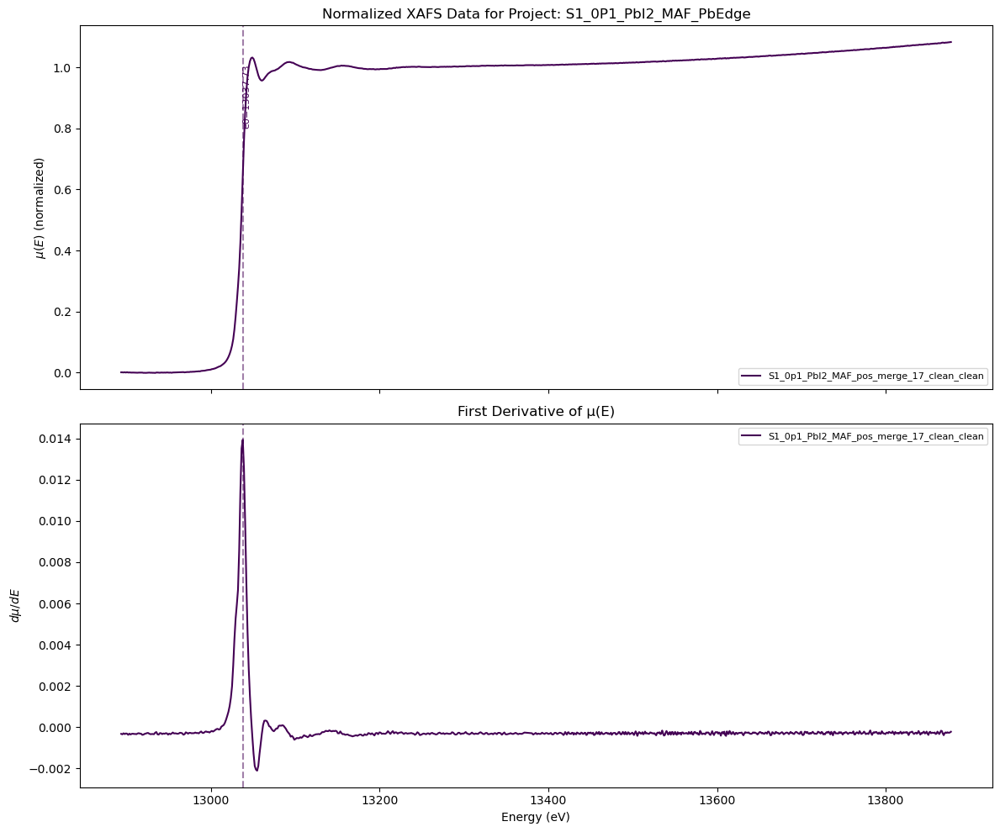

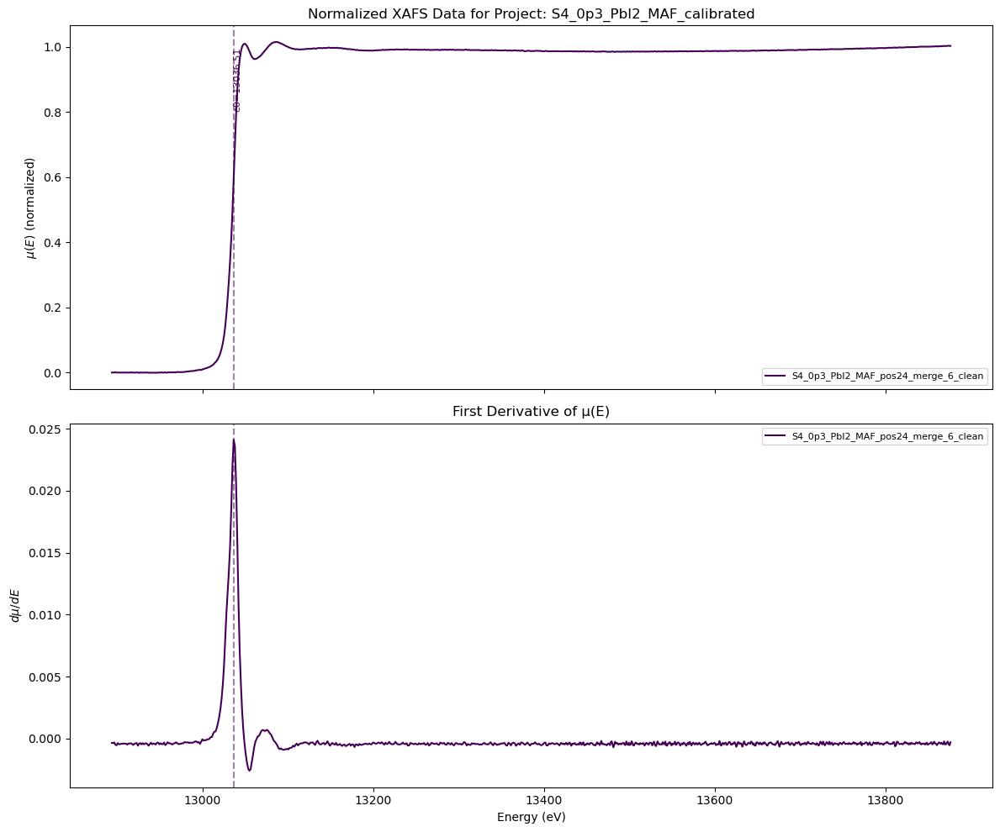

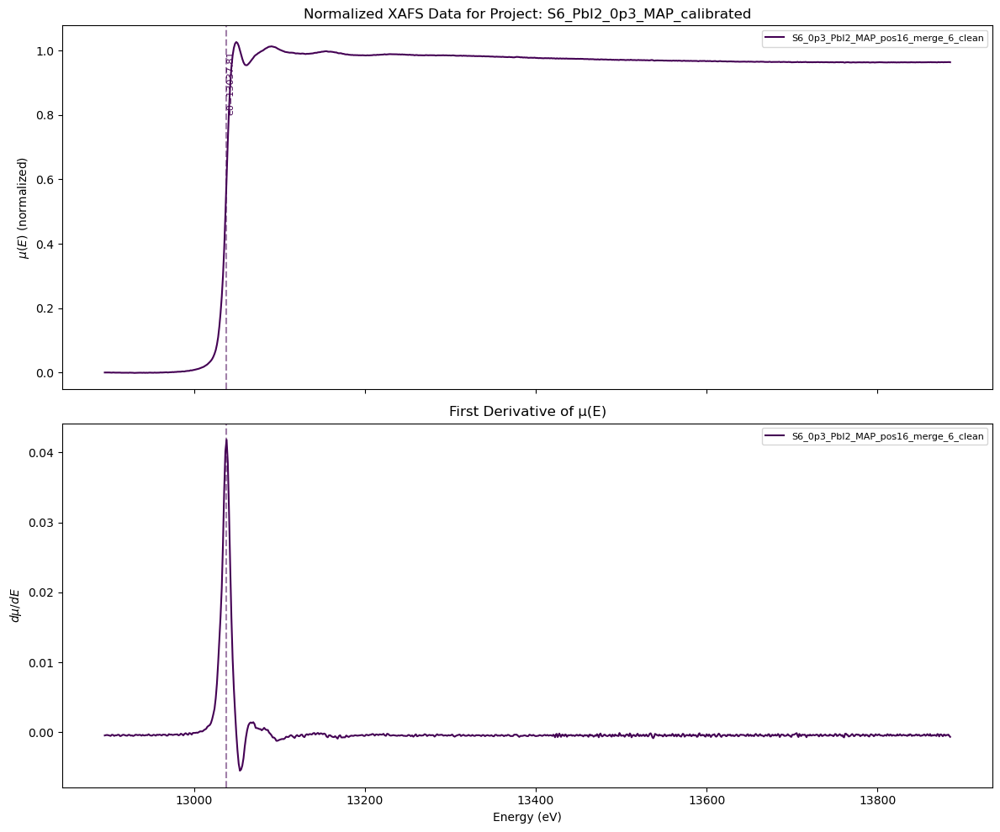

In [2]:
def batch_process_athena_projects(projects_path):
    """
    Batch process all Athena projects in the specified path without e0 alignment.
    
    Parameters:
    -----------
    projects_path : str or Path
        Path to a directory containing Athena project files (.prj)
    
    This function:
    - Loads all Athena project files from the specified path
    - Applies pre-edge subtraction on each group in each project
    - Plots normalized absorption curves and derivatives for each project
    - Returns the loaded projects for further analysis
    
    Returns:
    --------
    dict
        Dictionary of loaded projects that can be used for further analysis
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.cm as cm
    from pathlib import Path
    from larch.io import read_athena
    from larch.xafs import pre_edge
    import os

    # Load all Athena projects from the specified path
    projects = {}
    projects_path = Path(projects_path)
    project_files = list(projects_path.glob("*.prj"))
    
    if not project_files:
        print(f"No Athena project files found in {projects_path}")
        return None
    
    for prj_file in project_files:
        proj_name = prj_file.stem
        print(f"Loading project: {proj_name}")
        try:
            project = read_athena(str(prj_file))
            projects[proj_name] = project
        except Exception as e:
            print(f"Error loading {prj_file.name}: {e}")
    
    if not projects:
        print("No valid projects were loaded.")
        return None
    
    # Process every group - apply pre_edge but don't align
    for proj_name, project in projects.items():
        print(f"\nProject: {proj_name}")
        print("Available groups:", list(project.groups.keys()))
        
        # Process each group with pre-edge
        for name, group in project.groups.items():
            pre_edge(group)
            print(f"{name}: e0 = {group.e0}, edge_step = {group.edge_step}")
    
    # Plot project-by-project without alignment
    for proj_name, project in projects.items():
        energy_min_list = [group.energy.min() for group in project.groups.values() if hasattr(group, 'energy')]
        energy_max_list = [group.energy.max() for group in project.groups.values() if hasattr(group, 'energy')]
        global_energy_min = min(energy_min_list) if energy_min_list else None
        global_energy_max = max(energy_max_list) if energy_max_list else None

        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

        # Generate color map for groups
        num_groups = len(project.groups)
        cmap = cm.viridis
        colors = [cmap(i/num_groups) for i in range(num_groups)]
        
        for i, (name, group) in enumerate(project.groups.items()):
            if hasattr(group, 'energy') and hasattr(group, 'mu') and hasattr(group, 'norm'):
                color = colors[i]
                
                # Plot the normalized absorption curve 
                ax1.plot(group.energy, group.norm, label=f"{name}", color=color)
                if hasattr(group, 'e0'):
                    ax1.axvline(x=group.e0, color=color, linestyle='--', alpha=0.5)
                    ax1.text(group.e0, 0.8, f"e0={group.e0:.2f}", 
                            rotation=90, va='bottom', fontsize=8, color=color)

                # Compute and plot the first derivative
                dmu = np.gradient(group.mu, group.energy)
                ax2.plot(group.energy, dmu, label=f"{name}", color=color)
                if hasattr(group, 'e0'):
                    ax2.axvline(x=group.e0, color=color, linestyle='--', alpha=0.5)
            else:
                print(f"Missing data for {name}")
        
        ax1.set_ylabel(r'$\mu(E)$ (normalized)')
        ax1.set_title(f"Normalized XAFS Data for Project: {proj_name}")
        ax1.legend(loc='best', fontsize=8)
        ax2.set_xlabel('Energy (eV)')
        ax2.set_ylabel(r'$d\mu/dE$')
        ax2.set_title("First Derivative of μ(E)")
        ax2.legend(loc='best', fontsize=8)
        
        # Use the global range if available, otherwise matplotlib auto-scales
        if global_energy_min is not None and global_energy_max is not None:
            # Add a small buffer to avoid cutting off plot lines
            buffer = (global_energy_max - global_energy_min) * 0.05
            ax1.set_xlim(global_energy_min - buffer, global_energy_max + buffer)
        
        plt.tight_layout()
        plt.show()
        
    return projects  # Return the loaded projects in case you want to use them later

# Example usage
athena_projects_path = r"C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\AsminData\Athenprjcalibrated_L3\Athenprjcalibrated_L3\Pb_edge"
projects = batch_process_athena_projects(athena_projects_path)

# Later, access specific projects if needed
if projects:
    project_name = list(projects.keys())[0]  # Get first project name
    project = projects[project_name]
    # Do further analysis with the project...


Processing Project: S10_0p1_PbBr2_MAF_calibrated_merged
  Note: Using 'norm' attribute for S10_0p1_PbBr2_MAF_pos24_merge_8_PbEdge as 'norm_corrected' is not available
  Group S10_0p1_PbBr2_MAF_pos24_merge_8_PbEdge: Optimal rbkg = 1.34


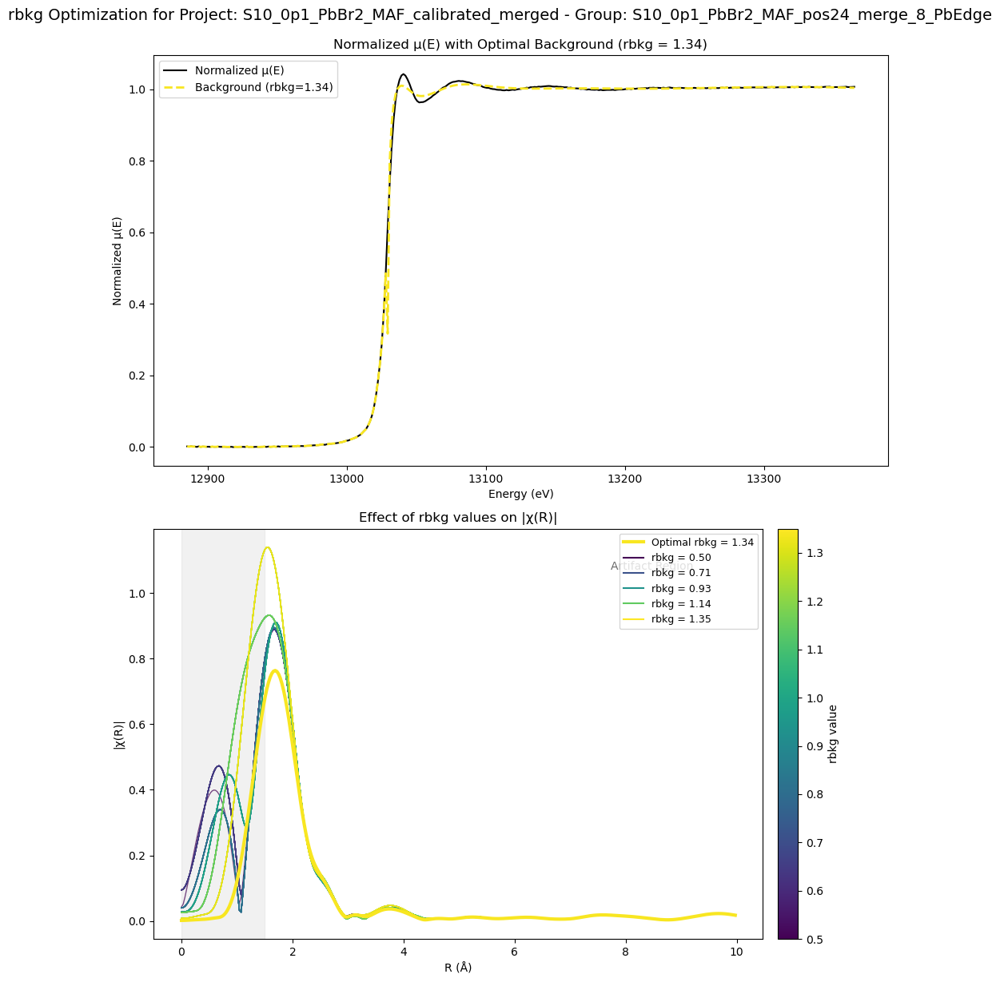


Processing Project: S11_0p1_PBBR2_MAAc_calibrated_PbL3
  Note: Using 'norm' attribute for S11_0p1_PbBr2_MAAc_pos24_merge_9_clean_PbL3 as 'norm_corrected' is not available
  Group S11_0p1_PbBr2_MAAc_pos24_merge_9_clean_PbL3: Optimal rbkg = 1.29


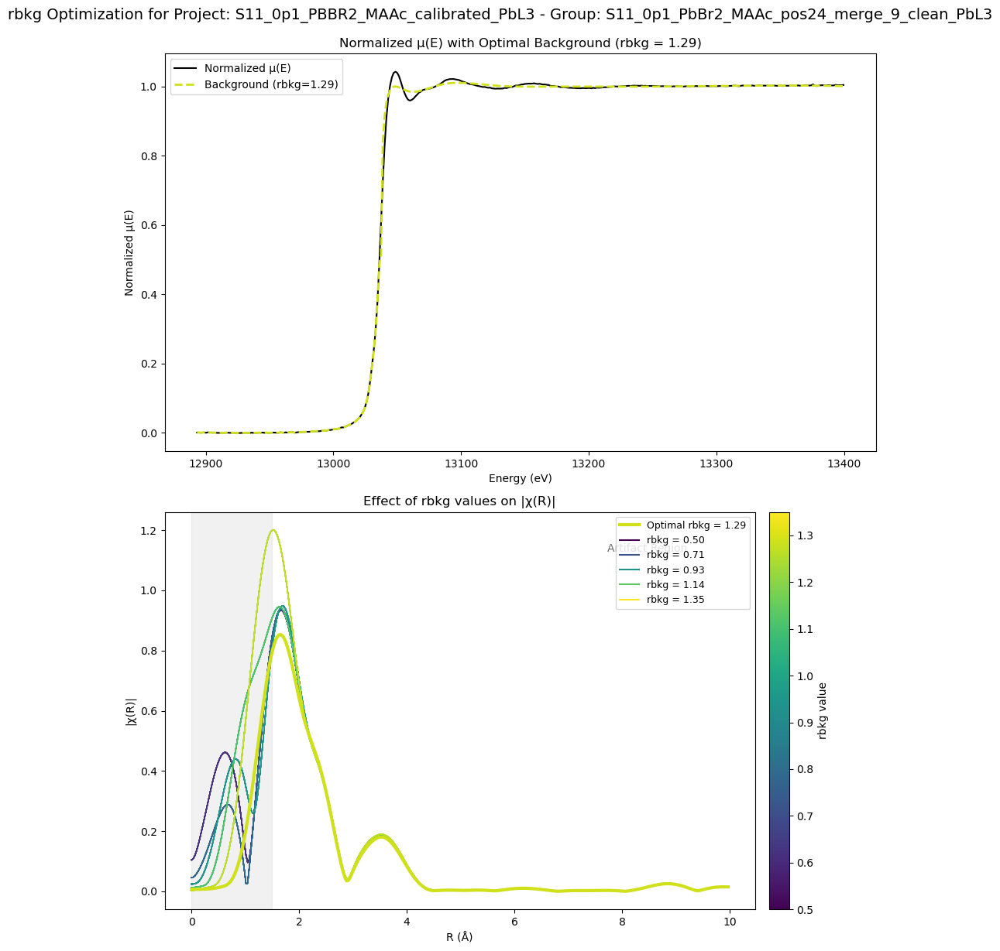


Processing Project: S14_0p3_PbBr2_MAAC_calibrated_PbL3
  Note: Using 'norm' attribute for S14_0p3_PbBr2_MAAc_pos24_merge_9_clean_PbL3 as 'norm_corrected' is not available
  Group S14_0p3_PbBr2_MAAc_pos24_merge_9_clean_PbL3: Optimal rbkg = 1.31


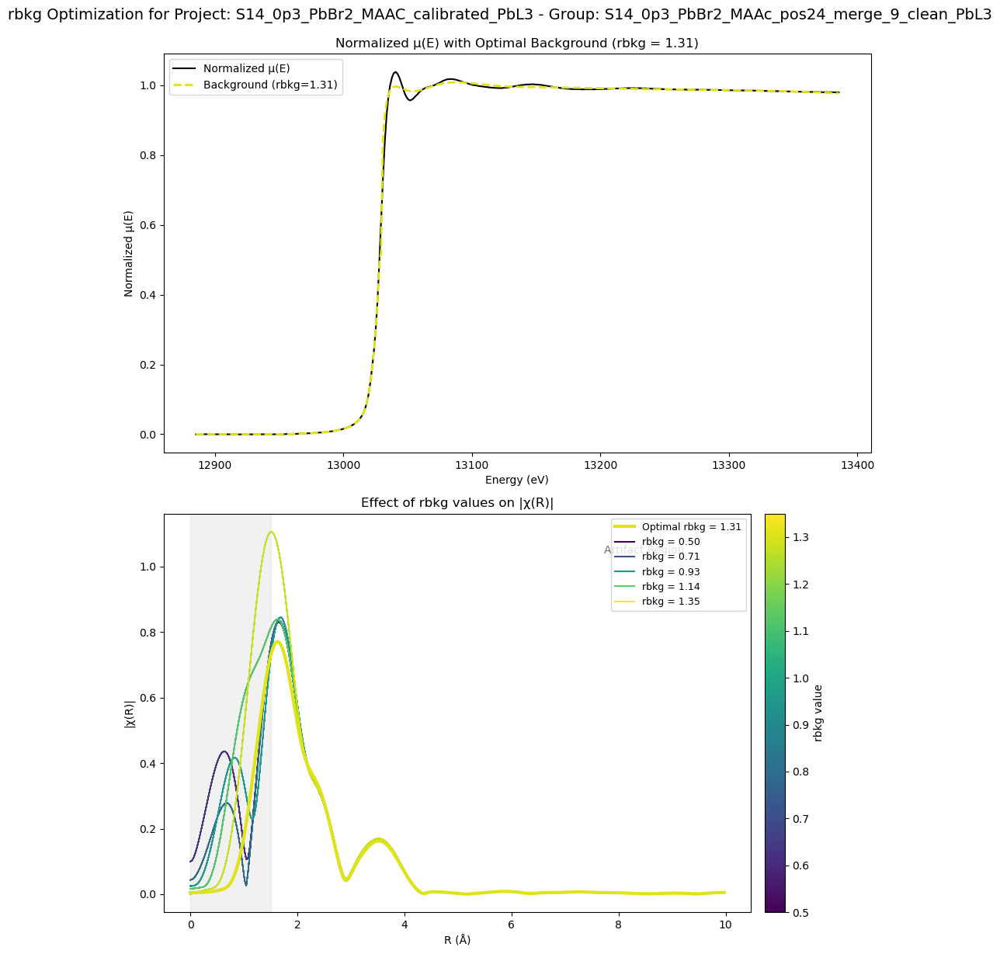


Processing Project: S15_0p3_PbBr2_MAP_calibrated_PbL3
  Note: Using 'norm' attribute for S15_0p3_PbBr2_MAP_pos24_merge_9_clean_PbL3 as 'norm_corrected' is not available
  Group S15_0p3_PbBr2_MAP_pos24_merge_9_clean_PbL3: Optimal rbkg = 1.28


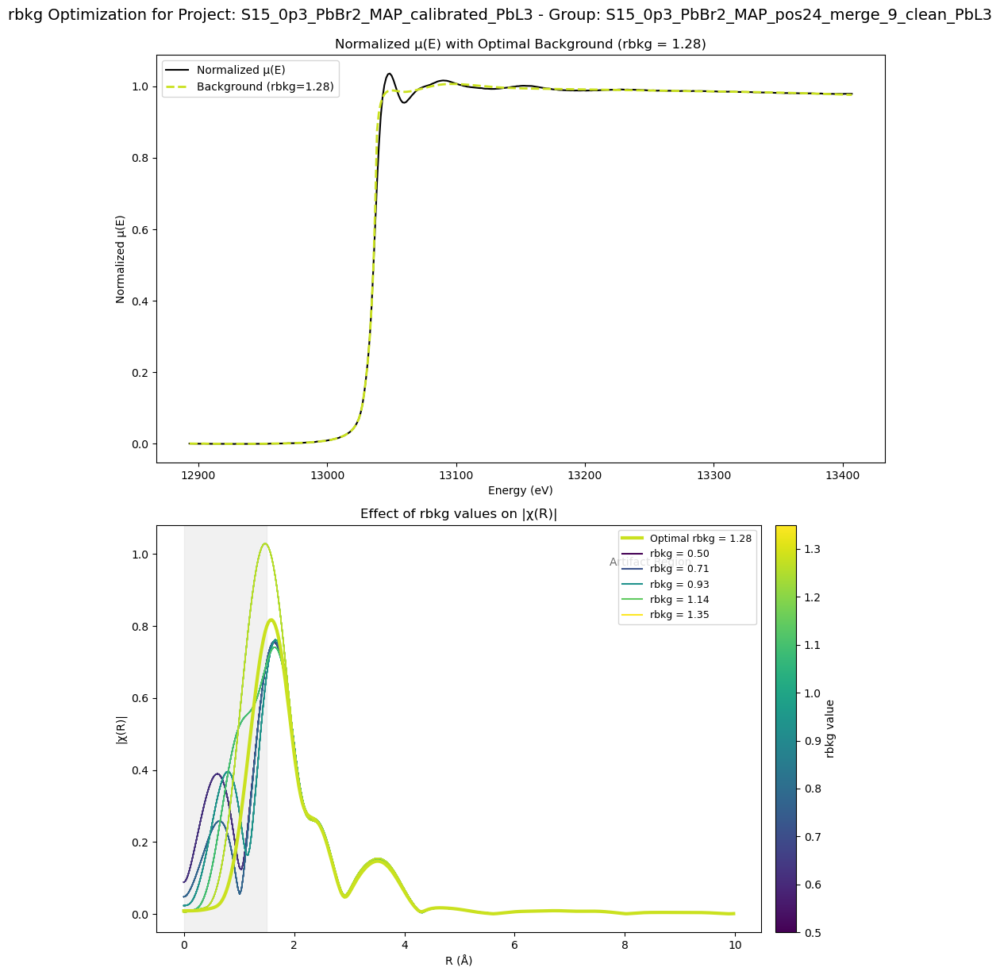


Processing Project: S17_0p5_PbBr2_MAAc_calibrated_PbL3
  Note: Using 'norm' attribute for S17_0p5_PbBr2_MAAc_pos24_merge_6_clean_PbL3 as 'norm_corrected' is not available
  Group S17_0p5_PbBr2_MAAc_pos24_merge_6_clean_PbL3: Optimal rbkg = 1.32


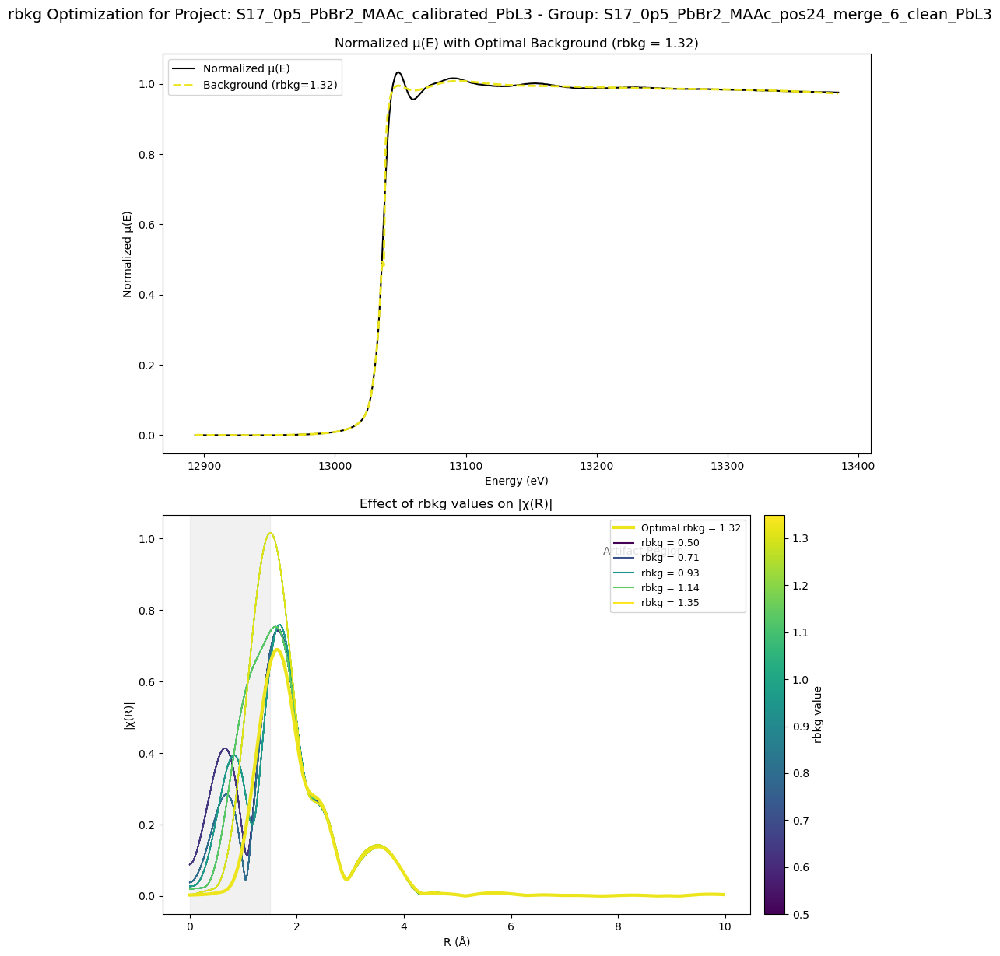


Processing Project: S18_0p5_PbBr2_MAP_calibrated_PbL3
  Note: Using 'norm' attribute for S18_0p5_PbBr2_MAAc_pos_merge_6_clean_PbL3 as 'norm_corrected' is not available
  Group S18_0p5_PbBr2_MAAc_pos_merge_6_clean_PbL3: Optimal rbkg = 1.33


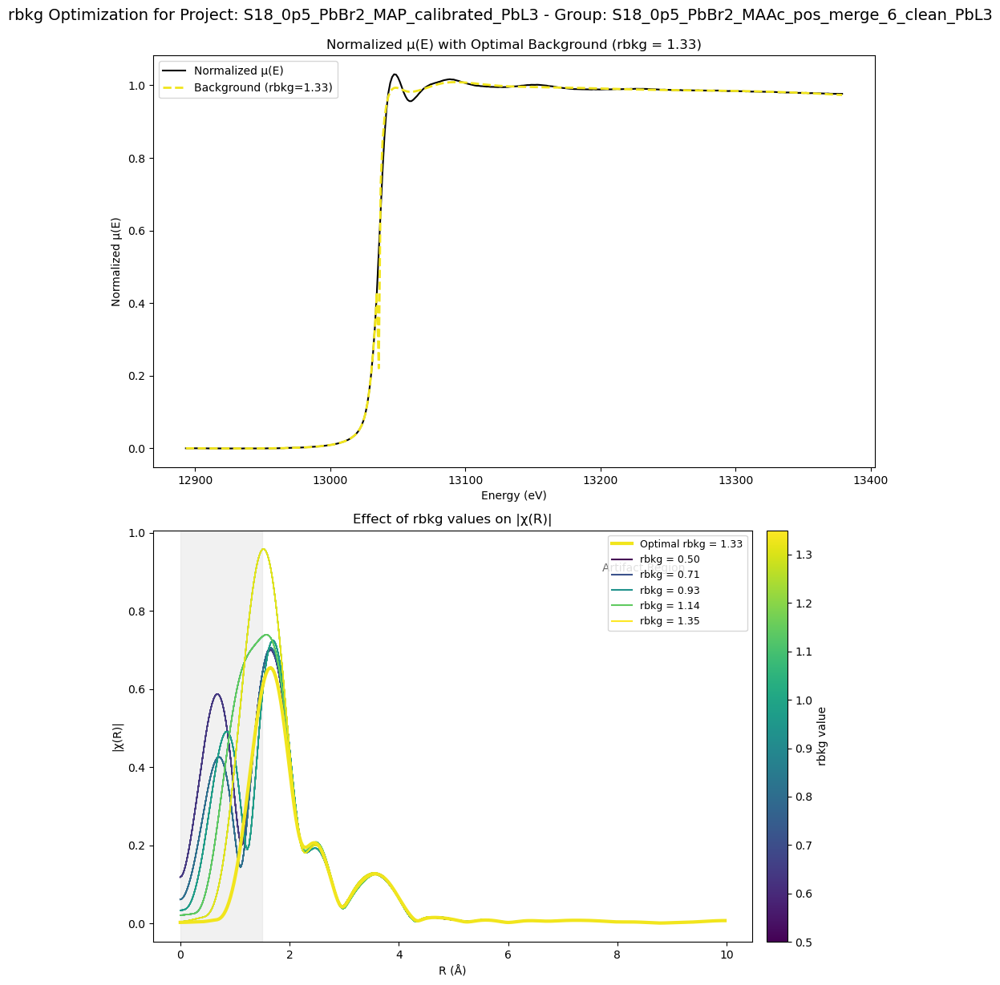


Processing Project: S1_0P1_PbI2_MAF_PbEdge
  Note: Using 'norm' attribute for S1_0p1_PbI2_MAF_pos_merge_17_clean_clean as 'norm_corrected' is not available
  Group S1_0p1_PbI2_MAF_pos_merge_17_clean_clean: Optimal rbkg = 1.27


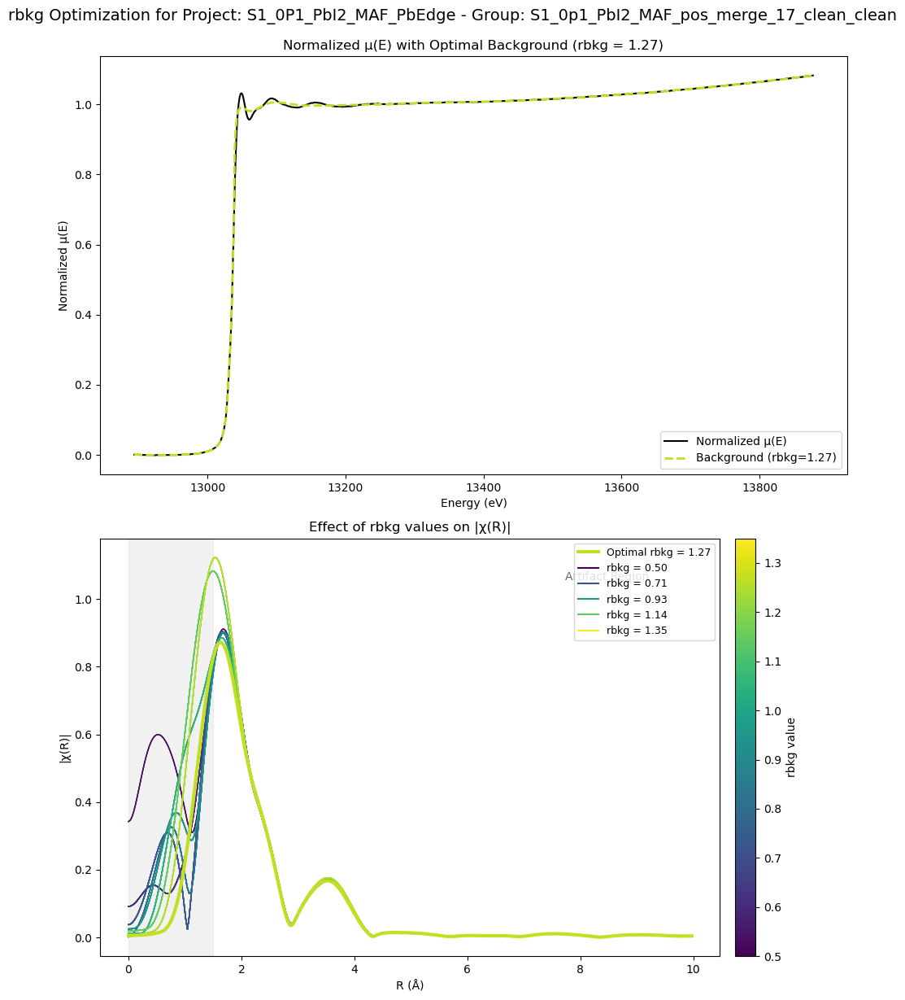


Processing Project: S4_0p3_PbI2_MAF_calibrated
  Note: Using 'norm' attribute for S4_0p3_PbI2_MAF_pos24_merge_6_clean as 'norm_corrected' is not available
  Group S4_0p3_PbI2_MAF_pos24_merge_6_clean: Optimal rbkg = 1.27


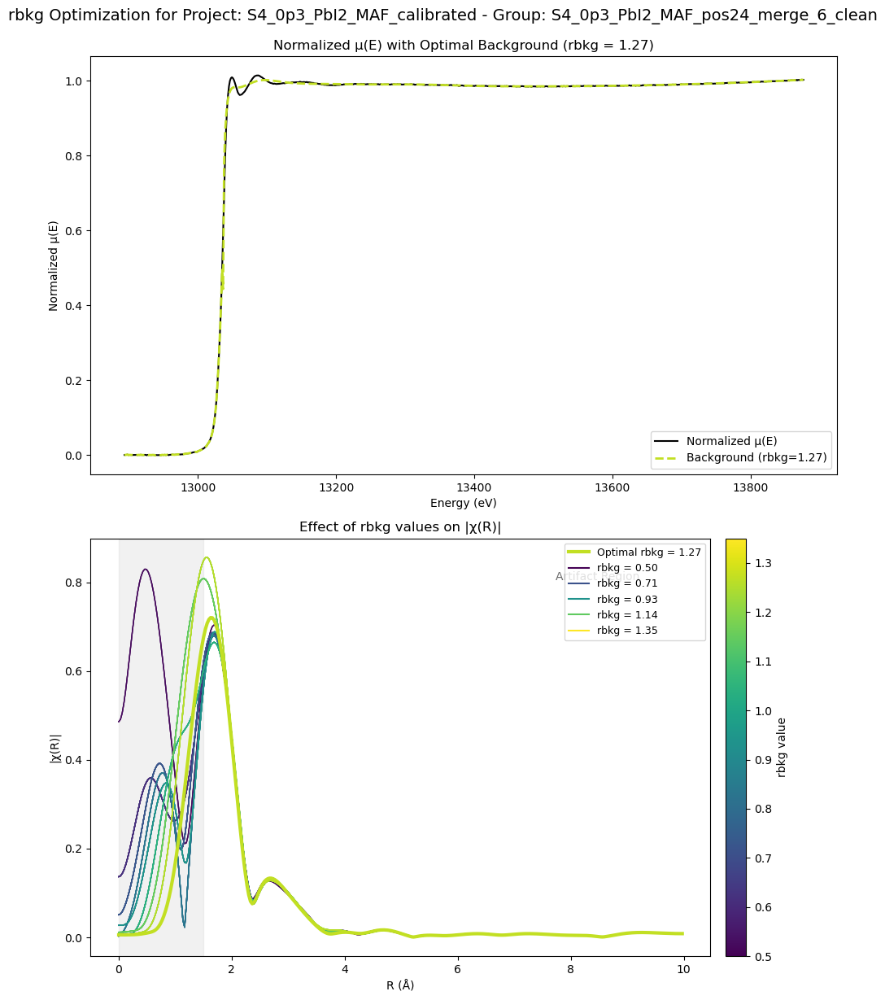


Processing Project: S6_PbI2_0p3_MAP_calibrated
  Note: Using 'norm' attribute for S6_0p3_PbI2_MAP_pos16_merge_6_clean as 'norm_corrected' is not available
  Group S6_0p3_PbI2_MAP_pos16_merge_6_clean: Optimal rbkg = 1.26


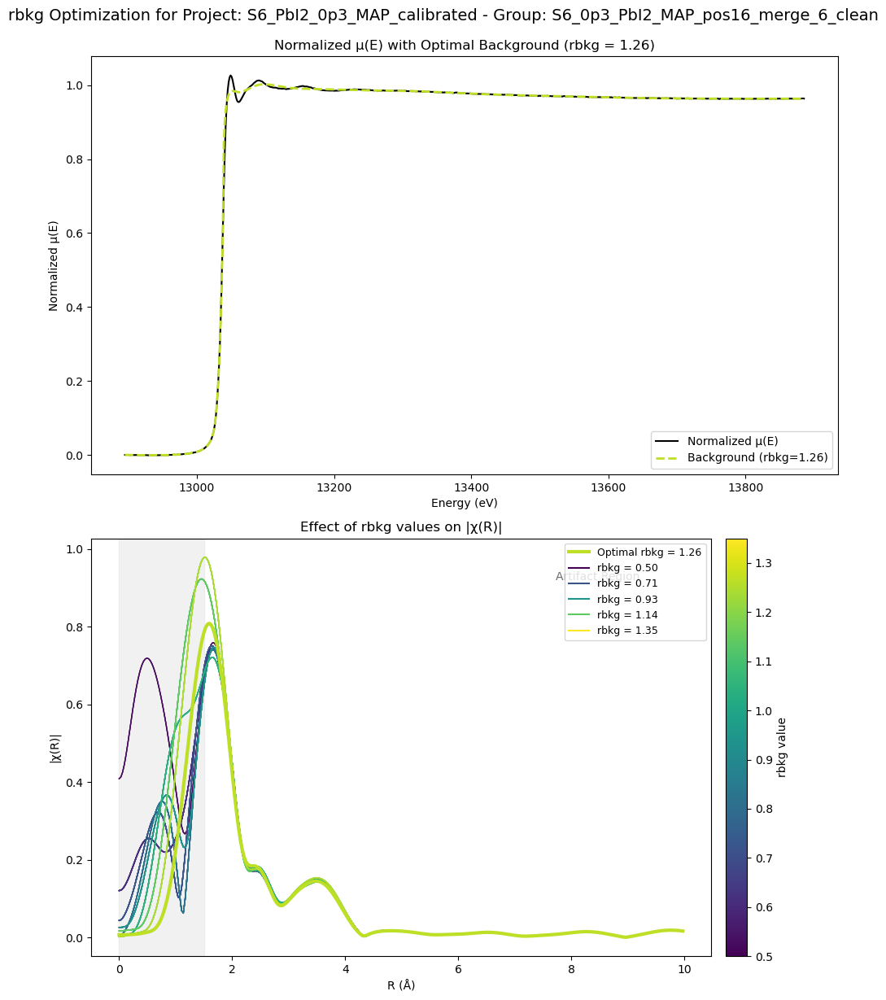


Project: S10_0p1_PbBr2_MAF_calibrated_merged
  S10_0p1_PbBr2_MAF_pos24_merge_8_PbEdge: optimal rbkg = 1.34

Project: S11_0p1_PBBR2_MAAc_calibrated_PbL3
  S11_0p1_PbBr2_MAAc_pos24_merge_9_clean_PbL3: optimal rbkg = 1.29

Project: S14_0p3_PbBr2_MAAC_calibrated_PbL3
  S14_0p3_PbBr2_MAAc_pos24_merge_9_clean_PbL3: optimal rbkg = 1.31

Project: S15_0p3_PbBr2_MAP_calibrated_PbL3
  S15_0p3_PbBr2_MAP_pos24_merge_9_clean_PbL3: optimal rbkg = 1.28

Project: S17_0p5_PbBr2_MAAc_calibrated_PbL3
  S17_0p5_PbBr2_MAAc_pos24_merge_6_clean_PbL3: optimal rbkg = 1.32

Project: S18_0p5_PbBr2_MAP_calibrated_PbL3
  S18_0p5_PbBr2_MAAc_pos_merge_6_clean_PbL3: optimal rbkg = 1.33

Project: S1_0P1_PbI2_MAF_PbEdge
  S1_0p1_PbI2_MAF_pos_merge_17_clean_clean: optimal rbkg = 1.27

Project: S4_0p3_PbI2_MAF_calibrated
  S4_0p3_PbI2_MAF_pos24_merge_6_clean: optimal rbkg = 1.27

Project: S6_PbI2_0p3_MAP_calibrated
  S6_0p3_PbI2_MAP_pos16_merge_6_clean: optimal rbkg = 1.26


In [3]:
def background_optimizer(projects):
    """
    Perform batch background subtraction and rbkg optimization on projects.
    
    Parameters:
    -----------
    projects : dict
        Dictionary of projects loaded from batch_process_athena_projects()
    
    This function:
    - Loops through all groups in all provided projects
    - Tests a range of rbkg values for each group
    - Computes a smoothness metric based on low-R artifacts
    - Selects the optimal rbkg value that minimizes artifacts
    - Applies the optimal background subtraction to each group
    - Creates diagnostic plots for visualization
    - Stores the optimal rbkg value as an attribute on each group
    
    Returns:
    --------
    dict
        The modified projects dictionary with optimal rbkg values applied
    """
    import matplotlib.cm as cm
    import numpy as np
    import matplotlib.pyplot as plt
    from larch.xafs import autobk, xftf

    if not projects:
        print("No projects provided for background optimization")
        return None
        
    for proj_name, project in projects.items():
        print(f"\nProcessing Project: {proj_name}")
        for group_name, group in project.groups.items():
            # First check if we have the required attributes
            if hasattr(group, 'energy') and hasattr(group, 'mu'):
                # Check for norm_corrected, fallback to norm if needed
                if not hasattr(group, 'norm_corrected'):
                    if hasattr(group, 'norm'):
                        print(f"  Note: Using 'norm' attribute for {group_name} as 'norm_corrected' is not available")
                        group.norm_corrected = group.norm
                    else:
                        print(f"  Skipping group {group_name}: Missing normalization data")
                        continue
                
                # Set up optimization parameters
                rbkg_values = np.linspace(0.5, 1.35, 100)
                rbkg_results = []
                fig, axs = plt.subplots(2, 1, figsize=(10, 12))
                cmap = cm.viridis
                norm_c = plt.Normalize(rbkg_values.min(), rbkg_values.max())

                # Test different rbkg values
                for rbkg in rbkg_values:
                    color = cmap(norm_c(rbkg))
                    # Create a temporary copy to avoid modifying the original group
                    temp_group = type(group)()
                    for attr in ['energy', 'mu', 'norm_corrected', 'e0', 'edge_step']:
                        if hasattr(group, attr):
                            setattr(temp_group, attr, getattr(group, attr))
                    temp_group.norm = temp_group.norm_corrected
                    autobk(temp_group, rbkg=rbkg, kweight=1)
                    xftf(temp_group, kmin=2, kmax=6, dk=4, kwindow='hanning', kweight=3)
                    
                    if hasattr(temp_group, 'chir_mag') and hasattr(temp_group, 'r'):
                        r_mask = (temp_group.r > 0) & (temp_group.r < 1.0)
                        if np.any(r_mask):
                            low_r_intensity = integrate_method(temp_group.chir_mag[r_mask], 
                                                               temp_group.r[r_mask])
                            rbkg_results.append((rbkg, low_r_intensity, temp_group))
                            axs[1].plot(temp_group.r, temp_group.chir_mag, color=color,
                                        alpha=0.7, linewidth=1)
                
                # Process results if we have any
                if rbkg_results:
                    rbkg_results.sort(key=lambda x: x[1])
                    best_rbkg, best_metric, best_temp = rbkg_results[0]
                    best_color = cmap(norm_c(best_rbkg))
                    print(f"  Group {group_name}: Optimal rbkg = {best_rbkg:.2f}")

                    # Create a background copy of the group
                    bkg_group = type(group)()
                    for attr in ['energy', 'mu', 'norm_corrected', 'e0', 'edge_step']:
                        if hasattr(group, attr):
                            setattr(bkg_group, attr, getattr(group, attr))
                    bkg_group.norm = bkg_group.norm_corrected
                    autobk(bkg_group, rbkg=best_rbkg, kweight=2)

                    # Apply optimal background to original group
                    group.norm = group.norm_corrected
                    autobk(group, rbkg=best_rbkg, kweight=3)
                    xftf(group, kmin=2, kmax=6, dk=4, kwindow='hanning', kweight=3)
                    
                    # Store the optimal value for future reference
                    group.optimal_rbkg = best_rbkg
                    
                    # Calculate pre-edge contribution for plotting
                    pre_edge_mu = group.mu - group.norm_corrected * group.edge_step

                    # Plot optimized results
                    axs[0].plot(group.energy, group.norm_corrected, label='Normalized μ(E)', 
                                color='black')
                    if hasattr(bkg_group, 'bkg') and (len(bkg_group.bkg) == len(bkg_group.energy)):
                        bkg_norm = (bkg_group.bkg - pre_edge_mu) / group.edge_step
                        if len(bkg_norm) == len(group.energy):
                            axs[0].plot(group.energy, bkg_norm, 
                                        label=f'Background (rbkg={best_rbkg:.2f})', 
                                        linestyle='--', color=best_color, linewidth=2)
                        else:
                            print("  Warning: Shape mismatch between energy and background. Skipping background plot.")
                    else:
                        print("  Warning: Could not generate background curve for plot.")
                    
                    axs[0].set_xlabel('Energy (eV)')
                    axs[0].set_ylabel('Normalized μ(E)')
                    axs[0].set_title(f"Normalized μ(E) with Optimal Background (rbkg = {best_rbkg:.2f})")
                    axs[0].legend()

                    axs[1].plot(best_temp.r, best_temp.chir_mag, 
                                label=f'Optimal rbkg = {best_rbkg:.2f}', color=best_color,
                                linewidth=3, zorder=10)
                    
                    # Add a few representative rbkg values to the legend
                    legend_rbkg_values = [rbkg_values[0],
                                          rbkg_values[len(rbkg_values)//4],
                                          rbkg_values[len(rbkg_values)//2],
                                          rbkg_values[3*len(rbkg_values)//4],
                                          rbkg_values[-1]]
                    for rbkg in legend_rbkg_values:
                        if rbkg != best_rbkg:
                            color = cmap(norm_c(rbkg))
                            axs[1].plot([], [], label=f'rbkg = {rbkg:.2f}', color=color, linewidth=1.5)
                    
                    axs[1].set_xlabel('R (Å)')
                    axs[1].set_ylabel('|χ(R)|')
                    axs[1].set_title("Effect of rbkg values on |χ(R)|")
                    axs[1].axvspan(0, 1.5, color='lightgray', alpha=0.3)
                    axs[1].text(0.75, 0.9, "Artifact Region", color='dimgray',
                                transform=axs[1].transAxes, fontsize=10)
                    
                    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm_c)
                    sm.set_array([])
                    cbar = fig.colorbar(sm, ax=axs[1], orientation='vertical', pad=0.02)
                    cbar.set_label('rbkg value')
                    
                    axs[1].legend(loc='upper right', fontsize=9)
                    
                    plt.tight_layout()
                    plt.suptitle(f"rbkg Optimization for Project: {proj_name} - Group: {group_name}", 
                                 fontsize=14, y=1.02)
                    plt.show()
                else:
                    print(f"  Couldn't optimize rbkg for {group_name}: No valid results")
            else:
                missing = [attr for attr in ['energy', 'mu'] if not hasattr(group, attr)]
                print(f"  Skipping group {group_name}: Missing required attributes: {', '.join(missing)}")
                
    return projects  # Return the modified projects


# Use the optimized background removal on the loaded projects
projects = background_optimizer(projects)

# Check the results
if projects:
    for proj_name, project in projects.items():
        print(f"\nProject: {proj_name}")
        for group_name, group in project.groups.items():
            if hasattr(group, 'optimal_rbkg'):
                print(f"  {group_name}: optimal rbkg = {group.optimal_rbkg:.2f}")


Processing Project: S10_0p1_PbBr2_MAF_calibrated_merged


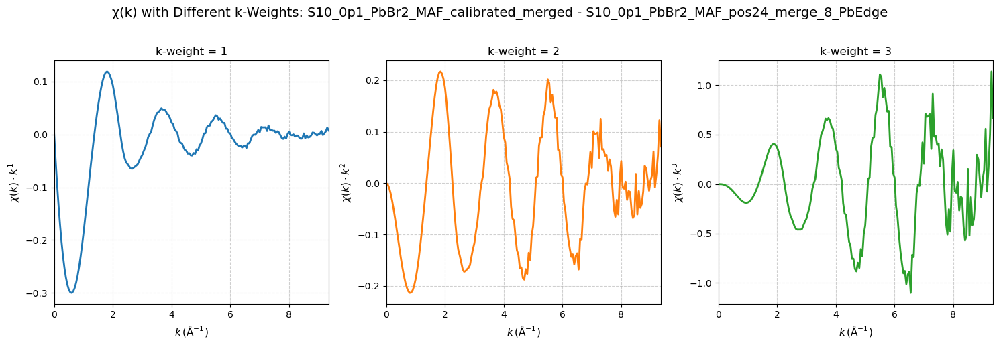


Processing Project: S11_0p1_PBBR2_MAAc_calibrated_PbL3


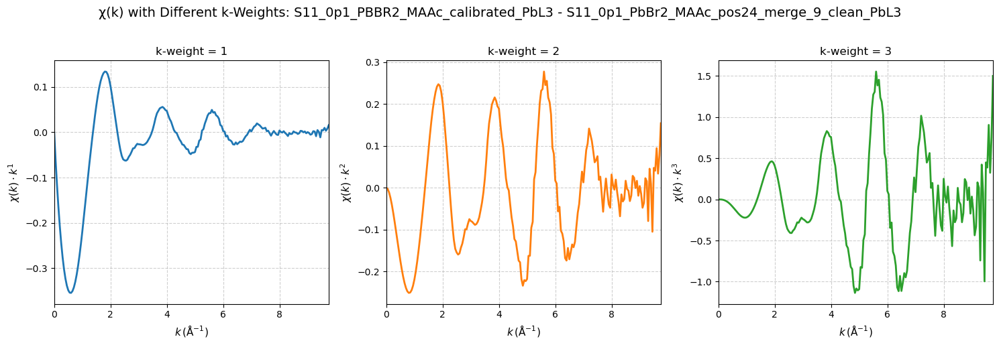


Processing Project: S14_0p3_PbBr2_MAAC_calibrated_PbL3


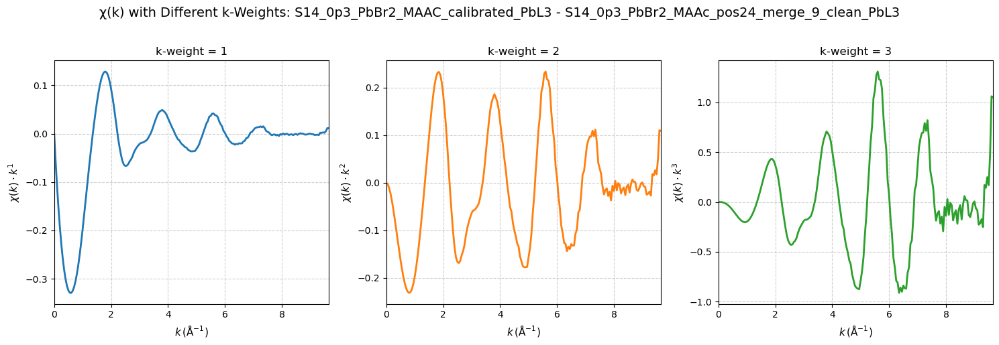


Processing Project: S15_0p3_PbBr2_MAP_calibrated_PbL3


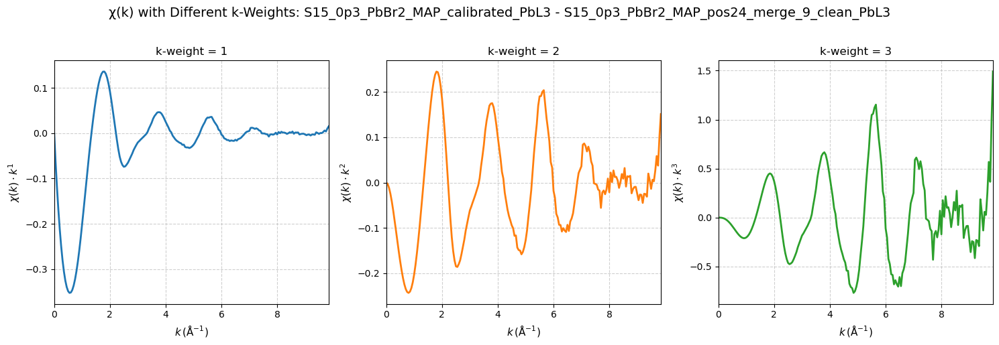


Processing Project: S17_0p5_PbBr2_MAAc_calibrated_PbL3


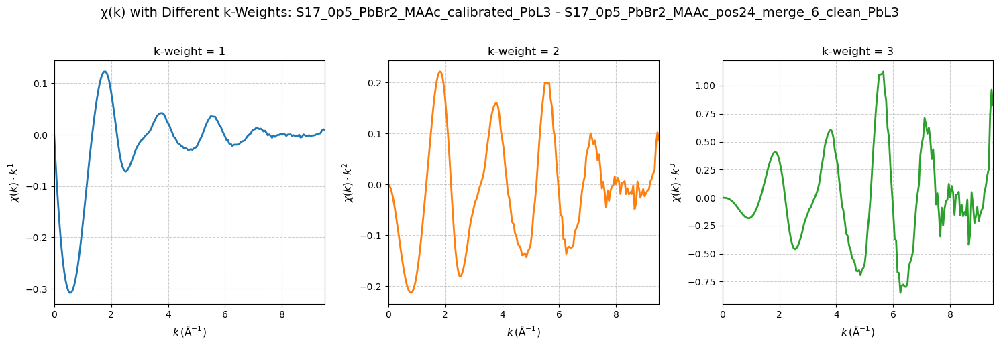


Processing Project: S18_0p5_PbBr2_MAP_calibrated_PbL3


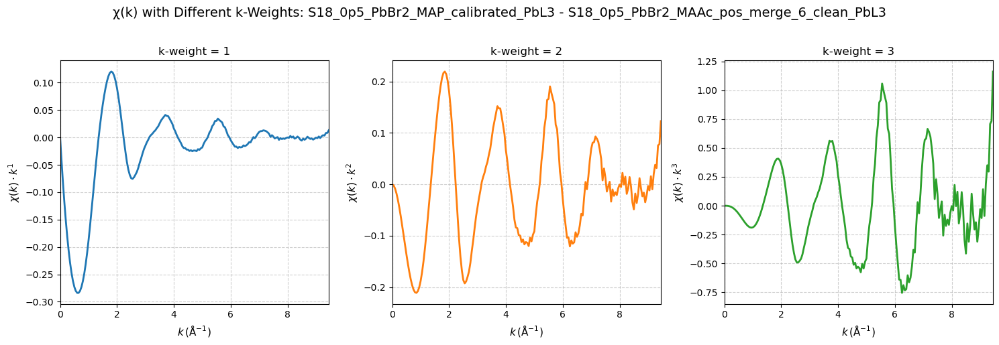


Processing Project: S1_0P1_PbI2_MAF_PbEdge


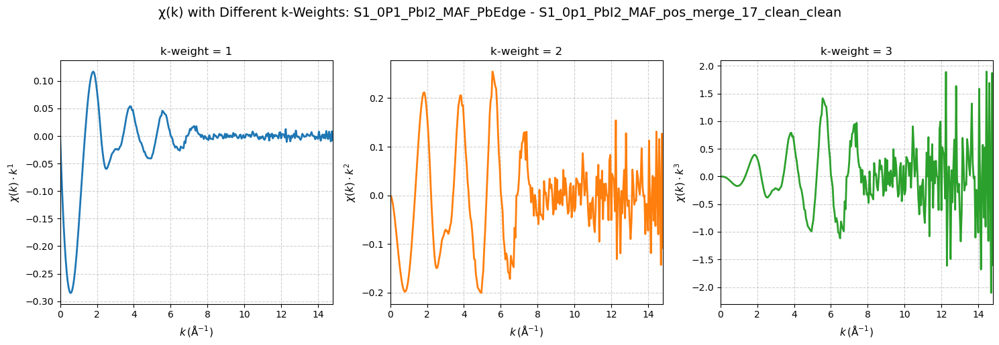


Processing Project: S4_0p3_PbI2_MAF_calibrated


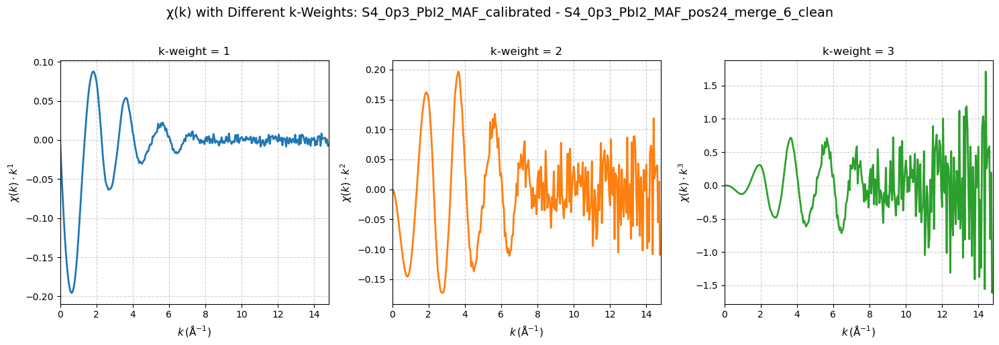


Processing Project: S6_PbI2_0p3_MAP_calibrated


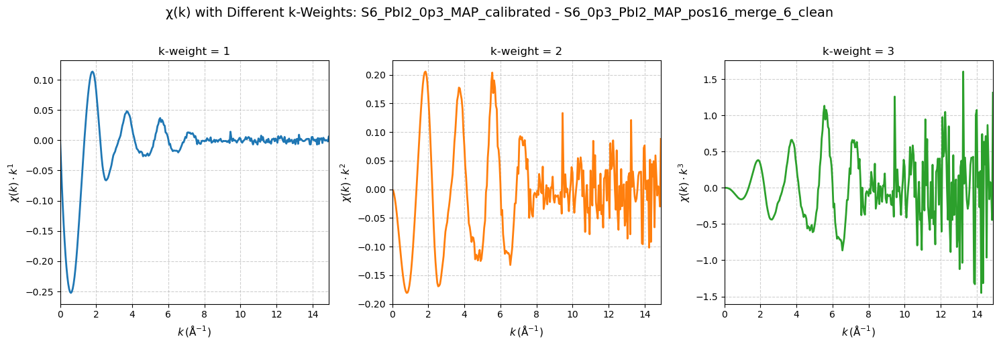


Processing chi(k) smoothing and tapering for Project: S10_0p1_PbBr2_MAF_calibrated_merged
Found 1 groups with chi(k) data
  Processing group: S10_0p1_PbBr2_MAF_pos24_merge_8_PbEdge


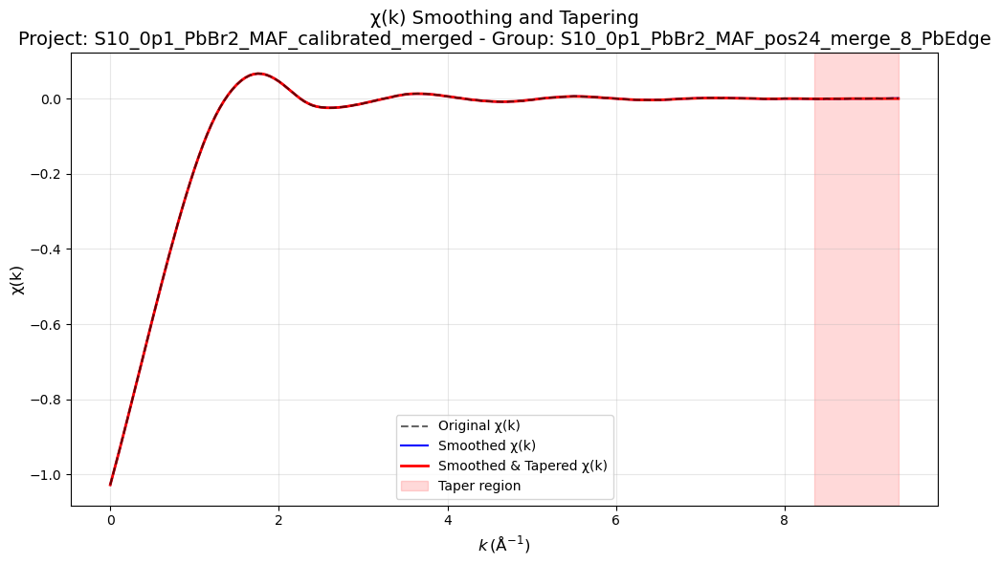

    Max change from smoothing: 0.001283
    Max change from tapering: 0.001042

Processing chi(k) smoothing and tapering for Project: S11_0p1_PBBR2_MAAc_calibrated_PbL3
Found 1 groups with chi(k) data
  Processing group: S11_0p1_PbBr2_MAAc_pos24_merge_9_clean_PbL3


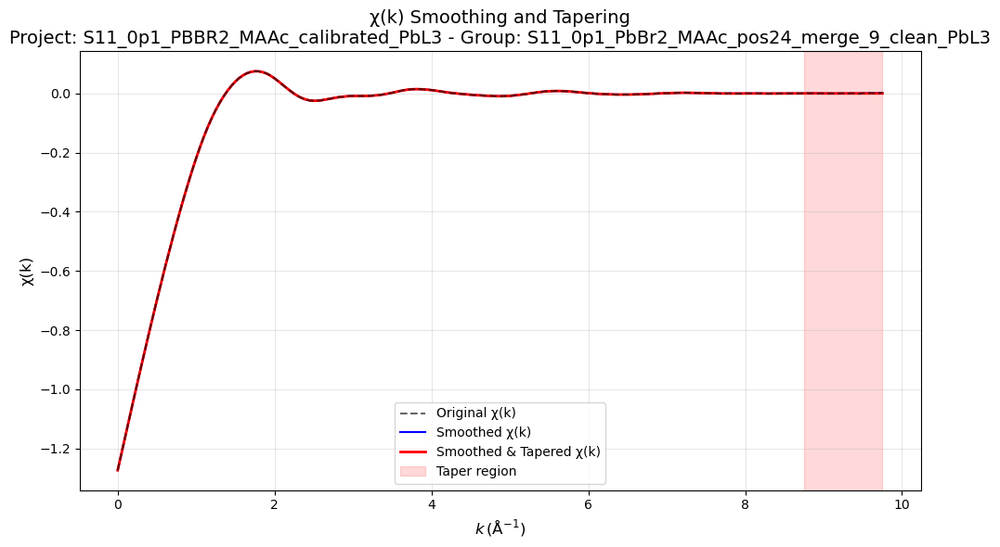

    Max change from smoothing: 0.001141
    Max change from tapering: 0.001395

Processing chi(k) smoothing and tapering for Project: S14_0p3_PbBr2_MAAC_calibrated_PbL3
Found 1 groups with chi(k) data
  Processing group: S14_0p3_PbBr2_MAAc_pos24_merge_9_clean_PbL3


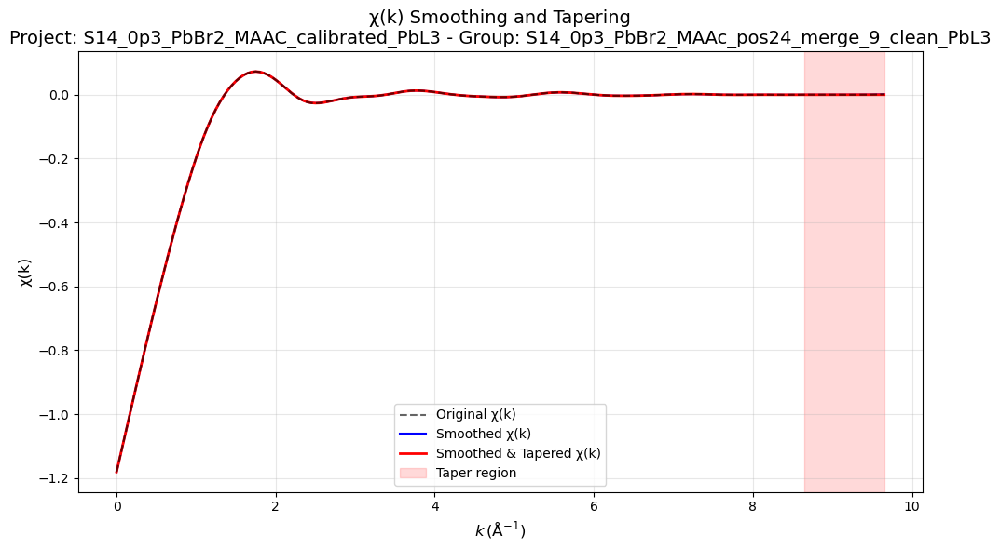

    Max change from smoothing: 0.000666
    Max change from tapering: 0.001262

Processing chi(k) smoothing and tapering for Project: S15_0p3_PbBr2_MAP_calibrated_PbL3
Found 1 groups with chi(k) data
  Processing group: S15_0p3_PbBr2_MAP_pos24_merge_9_clean_PbL3


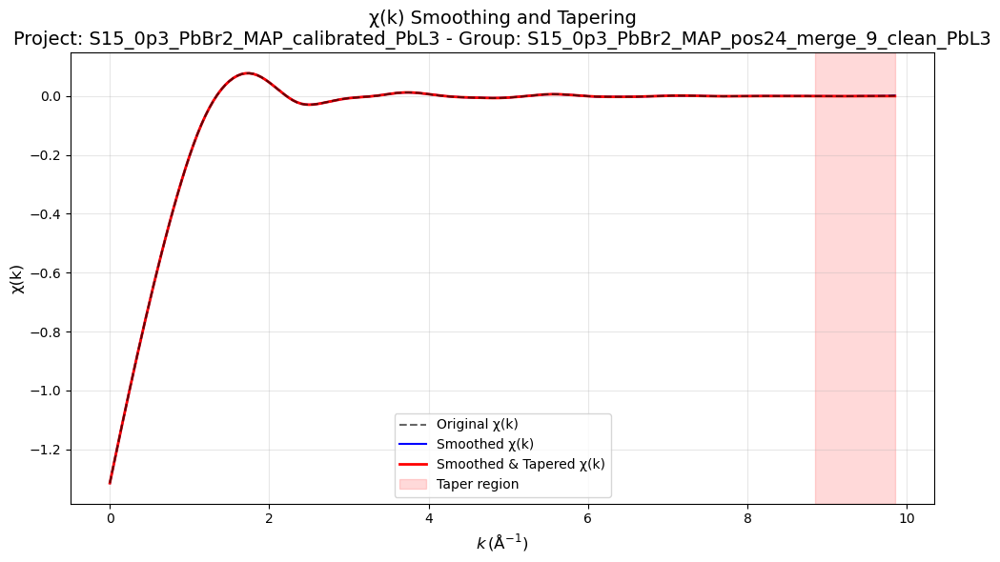

    Max change from smoothing: 0.000698
    Max change from tapering: 0.001559

Processing chi(k) smoothing and tapering for Project: S17_0p5_PbBr2_MAAc_calibrated_PbL3
Found 1 groups with chi(k) data
  Processing group: S17_0p5_PbBr2_MAAc_pos24_merge_6_clean_PbL3


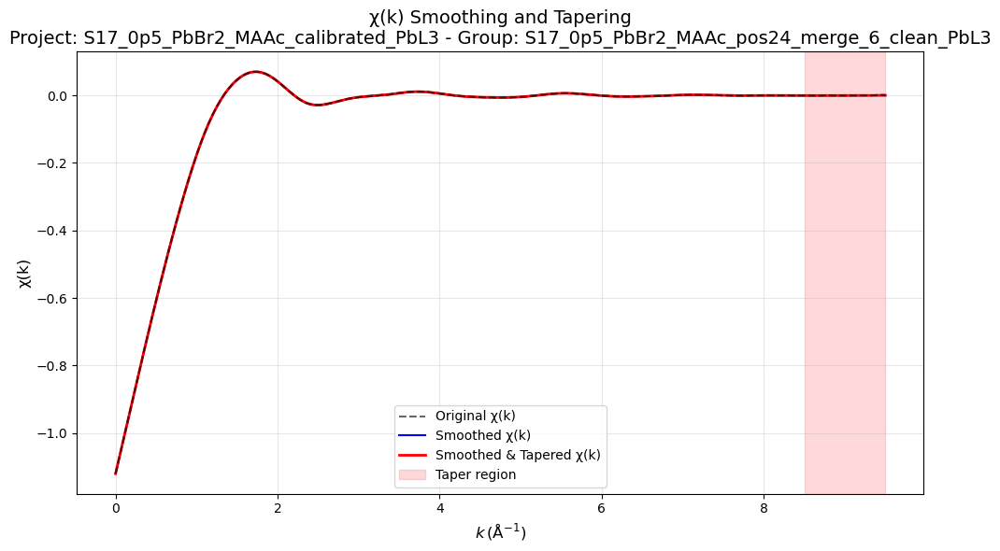

    Max change from smoothing: 0.000622
    Max change from tapering: 0.001122

Processing chi(k) smoothing and tapering for Project: S18_0p5_PbBr2_MAP_calibrated_PbL3
Found 1 groups with chi(k) data
  Processing group: S18_0p5_PbBr2_MAAc_pos_merge_6_clean_PbL3


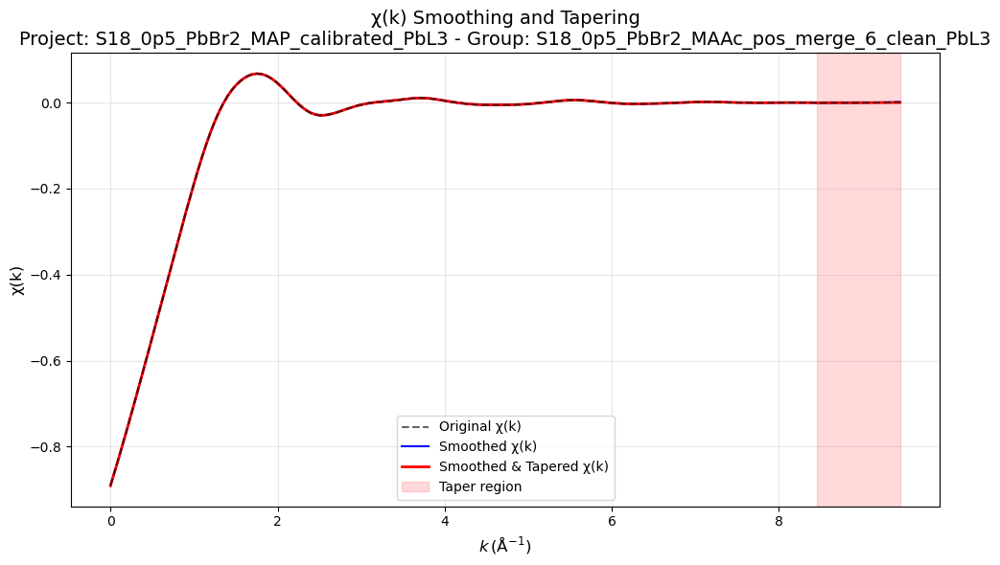

    Max change from smoothing: 0.000554
    Max change from tapering: 0.001348

Processing chi(k) smoothing and tapering for Project: S1_0P1_PbI2_MAF_PbEdge
Found 1 groups with chi(k) data
  Processing group: S1_0p1_PbI2_MAF_pos_merge_17_clean_clean


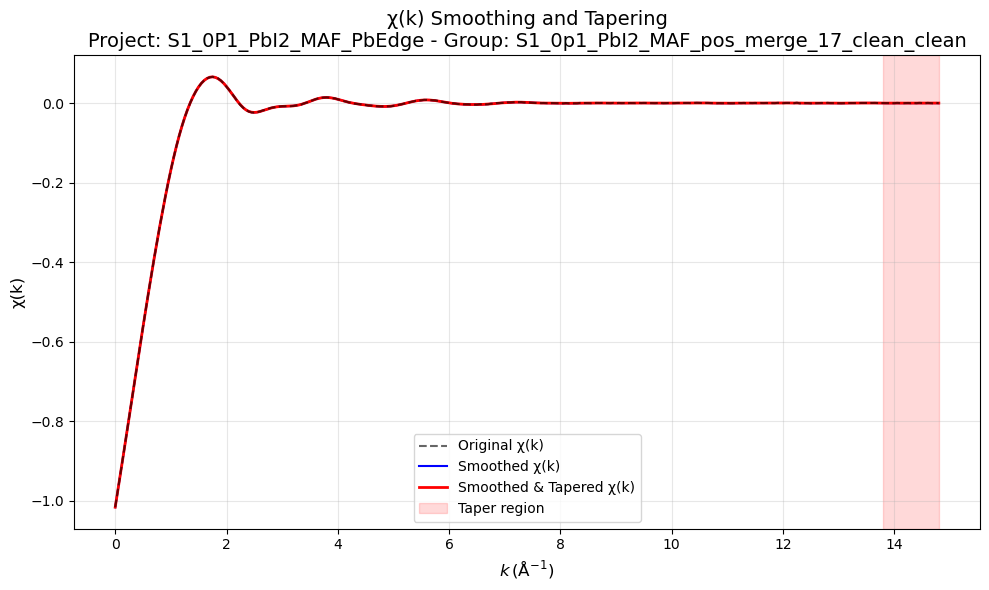

    Max change from smoothing: 0.000903
    Max change from tapering: 0.000225

Processing chi(k) smoothing and tapering for Project: S4_0p3_PbI2_MAF_calibrated
Found 1 groups with chi(k) data
  Processing group: S4_0p3_PbI2_MAF_pos24_merge_6_clean


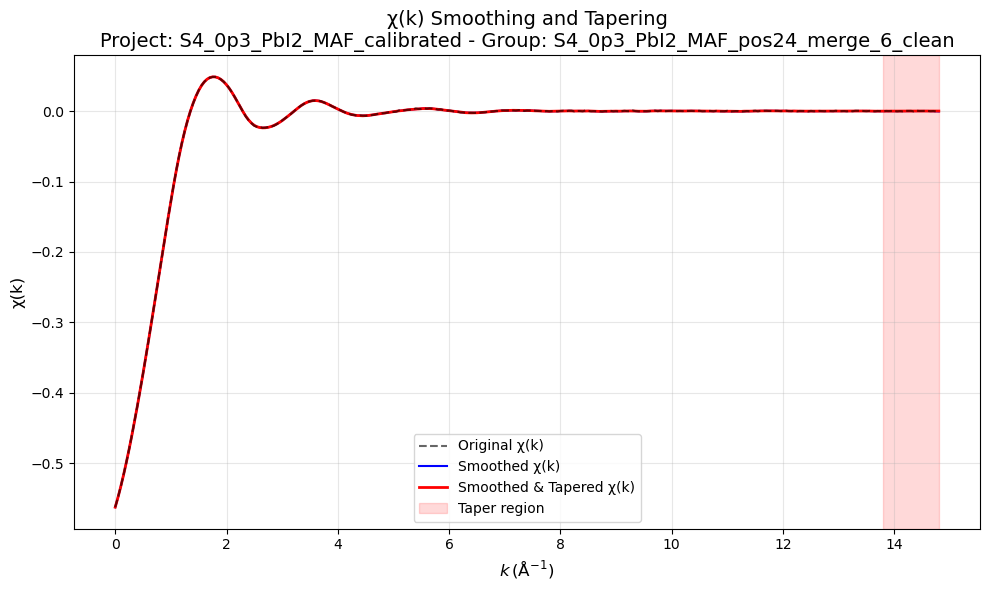

    Max change from smoothing: 0.001092
    Max change from tapering: 0.000549

Processing chi(k) smoothing and tapering for Project: S6_PbI2_0p3_MAP_calibrated
Found 1 groups with chi(k) data
  Processing group: S6_0p3_PbI2_MAP_pos16_merge_6_clean


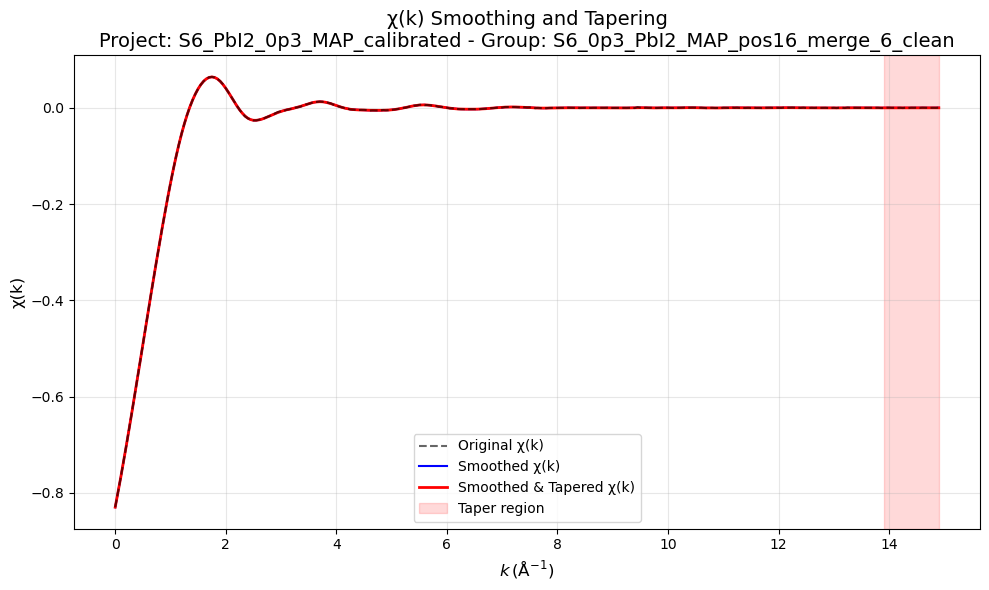

    Max change from smoothing: 0.001252
    Max change from tapering: 0.000250

Summary of processed groups:
  S10_0p1_PbBr2_MAF_calibrated_merged - S10_0p1_PbBr2_MAF_pos24_merge_8_PbEdge: Processed with smoothing and tapering
  S11_0p1_PBBR2_MAAc_calibrated_PbL3 - S11_0p1_PbBr2_MAAc_pos24_merge_9_clean_PbL3: Processed with smoothing and tapering
  S14_0p3_PbBr2_MAAC_calibrated_PbL3 - S14_0p3_PbBr2_MAAc_pos24_merge_9_clean_PbL3: Processed with smoothing and tapering
  S15_0p3_PbBr2_MAP_calibrated_PbL3 - S15_0p3_PbBr2_MAP_pos24_merge_9_clean_PbL3: Processed with smoothing and tapering
  S17_0p5_PbBr2_MAAc_calibrated_PbL3 - S17_0p5_PbBr2_MAAc_pos24_merge_6_clean_PbL3: Processed with smoothing and tapering
  S18_0p5_PbBr2_MAP_calibrated_PbL3 - S18_0p5_PbBr2_MAAc_pos_merge_6_clean_PbL3: Processed with smoothing and tapering
  S1_0P1_PbI2_MAF_PbEdge - S1_0p1_PbI2_MAF_pos_merge_17_clean_clean: Processed with smoothing and tapering
  S4_0p3_PbI2_MAF_calibrated - S4_0p3_PbI2_MAF_pos24_merge_6_

In [4]:
def visualize_kw(projects):
    """
    Visualize χ(k) for different k-weight values (1, 2, and 3) for each group.
    
    Parameters:
    -----------
    projects : dict
        Dictionary of projects loaded from batch_process_athena_projects()
    
    This function creates a figure with three side-by-side subplots for each spectrum,
    showing the k-weighted EXAFS data with k-weights of 1, 2, and 3 for comparison.
    """
    try:
        k_label = plab.k
    except NameError:
        k_label = "k"
    
    if not projects:
        print("No projects provided for k-weight visualization")
        return
        
    for proj_name, project in projects.items():
        print(f"\nProcessing Project: {proj_name}")
        for group_name, group in project.groups.items():
            if hasattr(group, 'k') and hasattr(group, 'chi'):
                fig, axs = plt.subplots(1, 3, figsize=(15, 5), sharey=False, sharex=True)
                for i, kweight in enumerate([1, 2, 3]):
                    axs[i].plot(group.k, group.chi * group.k**kweight, 
                                color=f'C{i}', linewidth=2)
                    axs[i].set_xlabel(k_label, fontsize=11)
                    axs[i].set_ylabel(f"$χ(k) \\cdot k^{kweight}$", fontsize=11)
                    axs[i].set_title(f"k-weight = {kweight}", fontsize=12)
                    axs[i].grid(True, linestyle='--', alpha=0.6)
                    if hasattr(group, 'k') and len(group.k) > 0:
                        axs[i].set_xlim(min(group.k), max(group.k))
                plt.suptitle(f"χ(k) with Different k-Weights: {proj_name} - {group_name}", 
                             fontsize=14, y=1.02)
                plt.tight_layout()
                plt.show()
            else:
                print(f"Skipping group {group_name} in {proj_name}: Missing 'k' or 'chi' attribute")
    
    return projects  # Return the projects for chaining


def smooth_and_taper_chi(projects, window_length=11, polyorder=3, taper_delta=1.0):
    """
    Apply smoothing and tapering to chi(k) data for all groups in all projects.
    
    Parameters:
    -----------
    projects : dict
        Dictionary of projects loaded from batch_process_athena_projects()
    window_length : int
        Window length for the Savitzky–Golay filter (must be odd)
    polyorder : int
        Polynomial order for the Savitzky–Golay filter
    taper_delta : float
        Width (in k units) of the taper region at the high-k end
    
    For each group having attributes 'k' and 'chi', this function:
    - Smooths chi(k) using a Savitzky–Golay filter (if data length permits)
    - Creates and applies a taper at the high-k end
    - Saves processed arrays (chi_smoothed and chi_tapered) to the group
    - Generates a diagnostic plot comparing original, smoothed, and tapered χ(k)
    - Reports maximum changes due to smoothing and tapering
    
    Returns:
    --------
    dict
        The modified projects dictionary with smoothed and tapered data
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.signal import savgol_filter
    
    if not projects:
        print("No projects provided for smoothing and tapering")
        return None

    # Define an inner helper function to smooth and taper a single (k, chi) array pair
    def _smooth_and_taper_single(k, chi, window_length, polyorder, taper_delta):
        # Check if data length is sufficient for smoothing
        if len(chi) < window_length:
            print(f"Warning: Data length ({len(chi)}) is shorter than window length ({window_length}). Using original data.")
            chi_smoothed = chi.copy()
        else:
            chi_smoothed = savgol_filter(chi, window_length, polyorder)
        
        # Create a taper array that forces the signal to go to zero at the high-k edge
        kmax = np.max(k)
        taper = np.ones_like(k)
        mask = k >= (kmax - taper_delta)
        if np.any(mask):
            taper[mask] = 0.5 * (1 + np.cos(np.pi * (k[mask] - (kmax - taper_delta)) / taper_delta))
        
        chi_tapered = chi_smoothed * taper
        return chi_smoothed, chi_tapered

    # Process each project and group
    for proj_name, project in projects.items():
        print(f"\nProcessing chi(k) smoothing and tapering for Project: {proj_name}")
        
        # Find groups that have the required chi(k) data
        valid_groups = [name for name, grp in project.groups.items() 
                        if hasattr(grp, 'k') and hasattr(grp, 'chi')]
        print(f"Found {len(valid_groups)} groups with chi(k) data")
        
        for group_name, group in project.groups.items():
            if hasattr(group, 'k') and hasattr(group, 'chi'):
                print(f"  Processing group: {group_name}")
                k = group.k
                chi = group.chi
                
                try:
                    chi_smoothed, chi_tapered = _smooth_and_taper_single(
                        k, chi, window_length, polyorder, taper_delta)
                    
                    # Store the processed data and parameters in the group
                    group.chi_smoothed = chi_smoothed
                    group.chi_tapered = chi_tapered
                    group.taper_parameters = {
                        'window_length': window_length,
                        'polyorder': polyorder,
                        'taper_delta': taper_delta
                    }
                    
                    # Plot the original, smoothed, and tapered chi(k)
                    fig, ax = plt.subplots(figsize=(10, 6))
                    ax.plot(k, chi, label="Original χ(k)", alpha=0.6, color='black', linestyle='--', zorder=3)
                    ax.plot(k, chi_smoothed, label="Smoothed χ(k)", color='blue', linestyle='-', linewidth=1.5)
                    ax.plot(k, chi_tapered, label="Smoothed & Tapered χ(k)", color='red', linestyle='-', linewidth=2)
                    
                    # Highlight the taper region
                    kmax = np.max(k)
                    taper_start = kmax - taper_delta
                    ax.axvspan(taper_start, kmax, alpha=0.15, color='red', label="Taper region")
                    
                    # Use plab.k for a nice label if available; otherwise, default to "k"
                    try:
                        k_label = plab.k
                    except NameError:
                        k_label = "k"
                    
                    ax.set_xlabel(k_label, fontsize=12)
                    ax.set_ylabel("χ(k)", fontsize=12)
                    ax.set_title(f"χ(k) Smoothing and Tapering\nProject: {proj_name} - Group: {group_name}", fontsize=14)
                    ax.grid(True, alpha=0.3)
                    ax.legend(loc='best')
                    plt.tight_layout()
                    plt.show()
                    
                    # Print out diagnostic information
                    chi_max_diff = np.max(np.abs(chi - chi_smoothed))
                    taper_effect = np.max(np.abs(chi_smoothed - chi_tapered))
                    print(f"    Max change from smoothing: {chi_max_diff:.6f}")
                    print(f"    Max change from tapering: {taper_effect:.6f}")
                except Exception as e:
                    print(f"    Error processing {group_name}: {str(e)}")
            else:
                print(f"  Skipping group {group_name}: Missing 'k' or 'chi' attribute")
                
    return projects  # Return the modified projects

# Visualize k-weighted EXAFS data
projects = visualize_kw(projects)

# Apply smoothing and tapering to the EXAFS data 
projects = smooth_and_taper_chi(projects, window_length=11, polyorder=3, taper_delta=1.0)

# Check results
if projects:
    print("\nSummary of processed groups:")
    for proj_name, project in projects.items():
        for group_name, group in project.groups.items():
            if hasattr(group, 'chi_tapered'):
                print(f"  {proj_name} - {group_name}: Processed with smoothing and tapering")


Comparing chi(k) processing for Project: S10_0p1_PbBr2_MAF_calibrated_merged
Found 1 processed groups


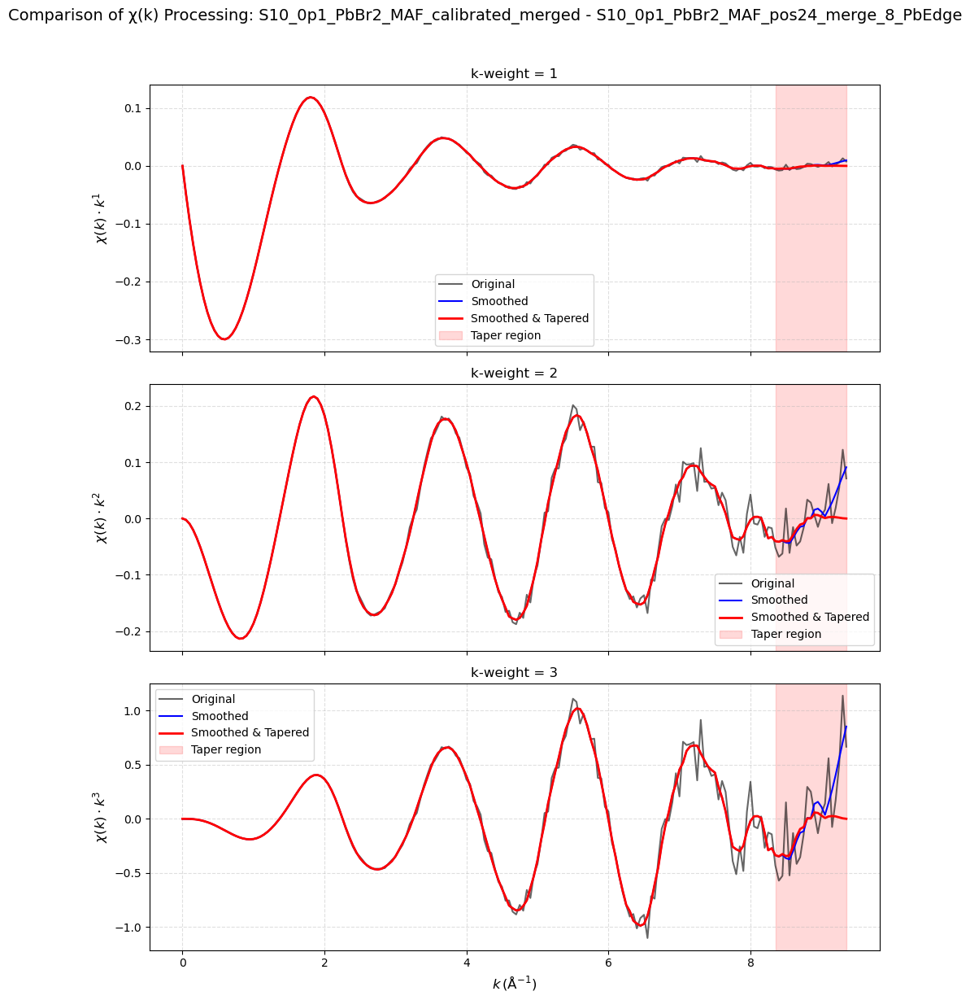


Comparing chi(k) processing for Project: S11_0p1_PBBR2_MAAc_calibrated_PbL3
Found 1 processed groups


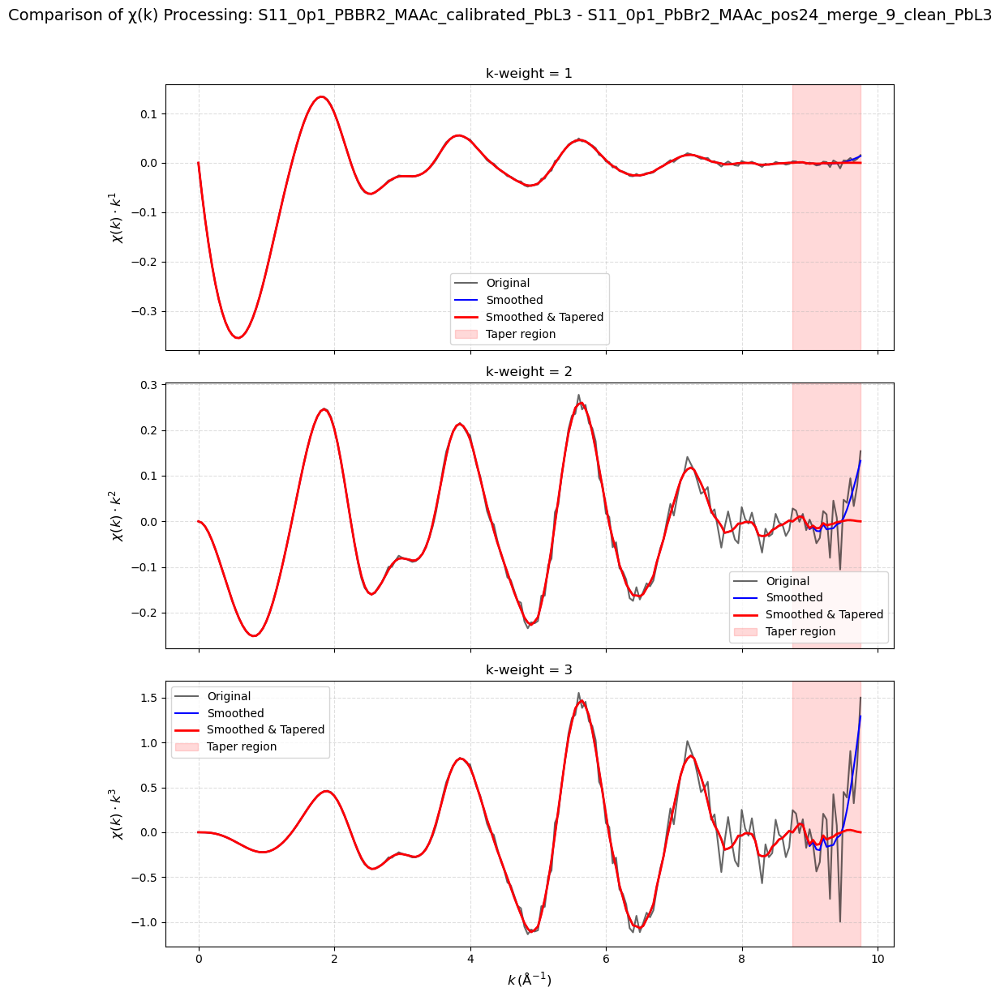


Comparing chi(k) processing for Project: S14_0p3_PbBr2_MAAC_calibrated_PbL3
Found 1 processed groups


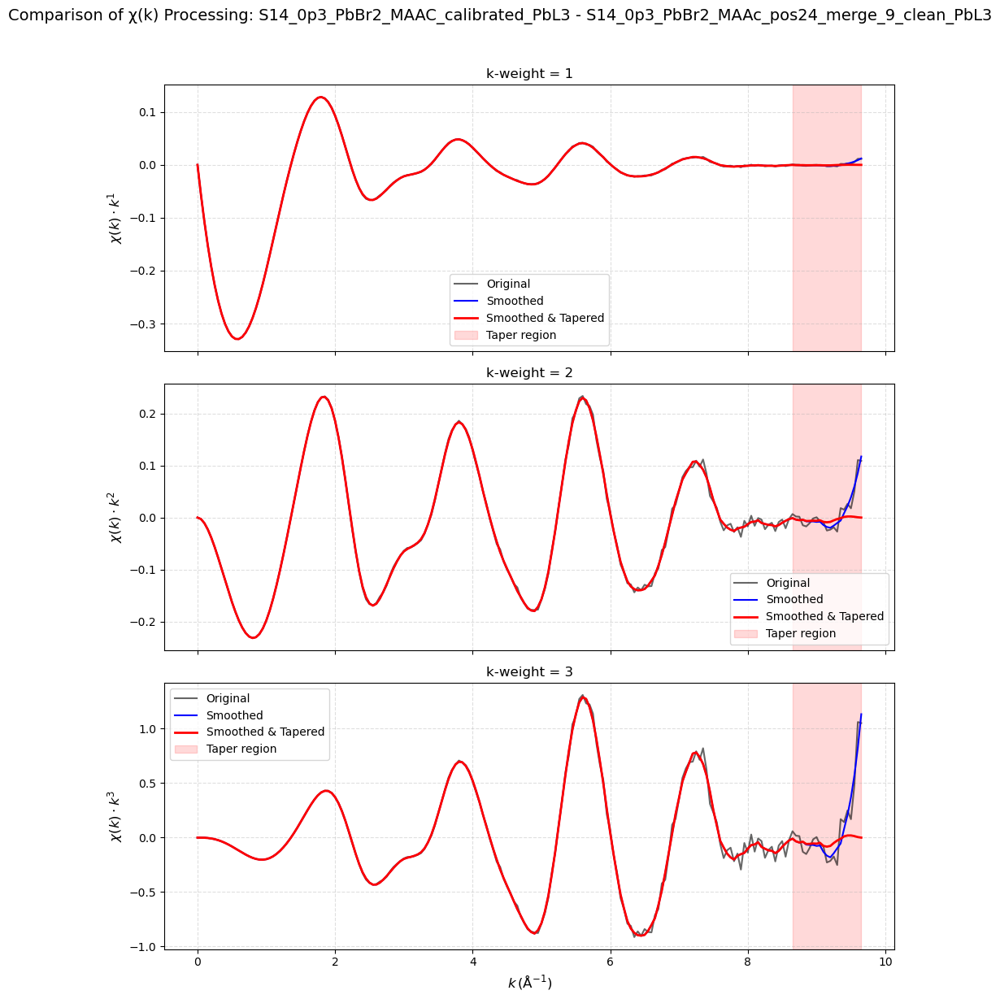


Comparing chi(k) processing for Project: S15_0p3_PbBr2_MAP_calibrated_PbL3
Found 1 processed groups


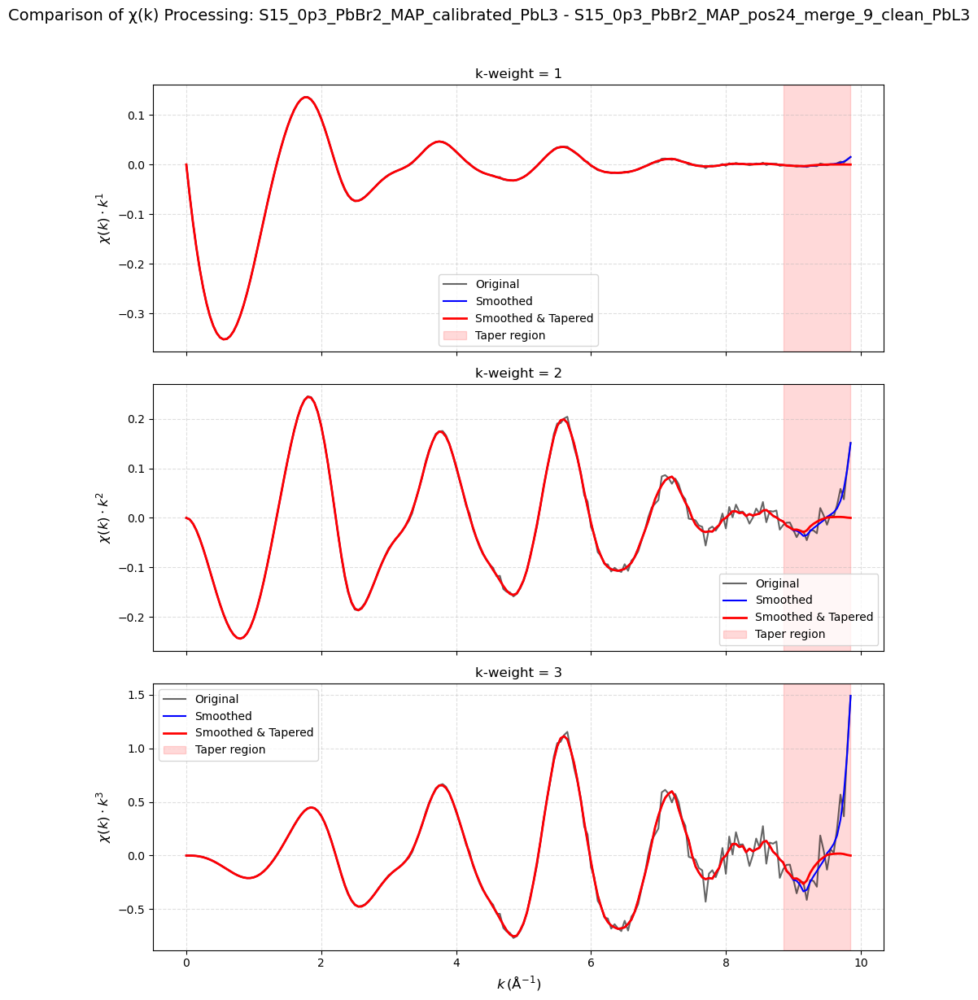


Comparing chi(k) processing for Project: S17_0p5_PbBr2_MAAc_calibrated_PbL3
Found 1 processed groups


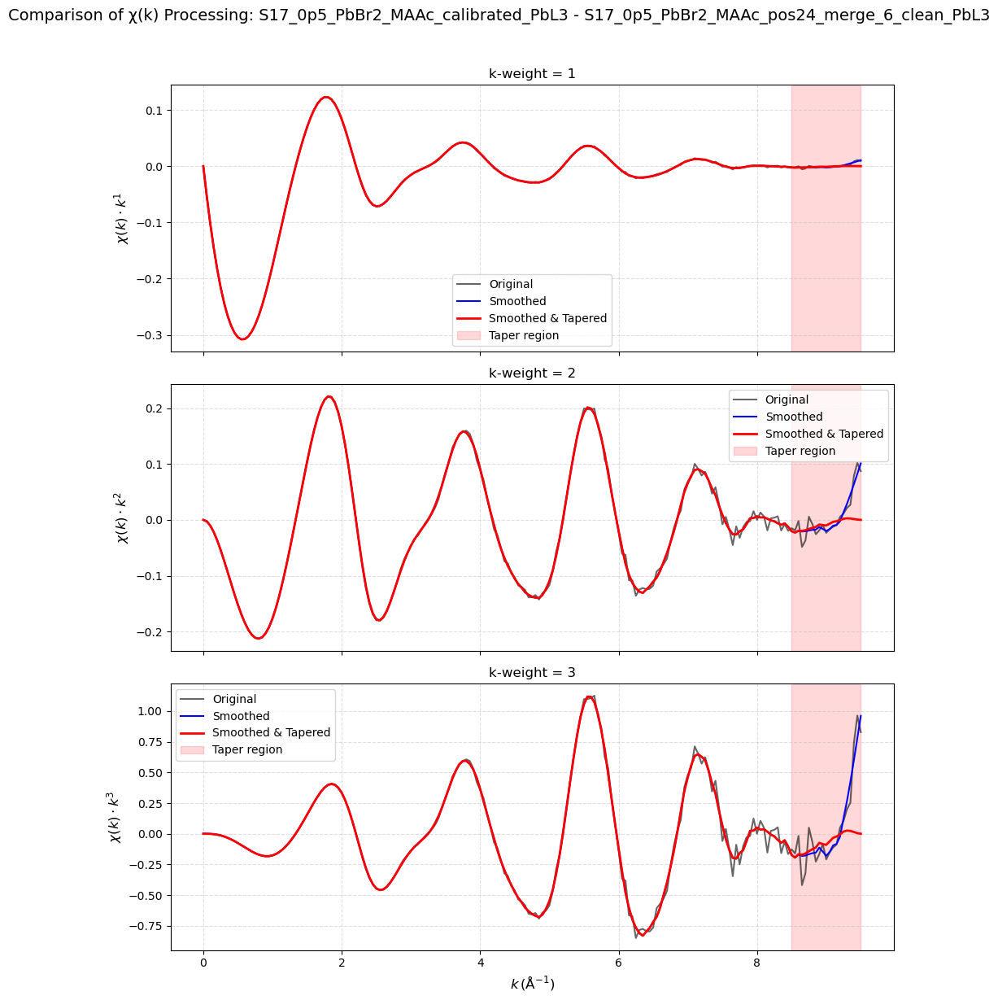


Comparing chi(k) processing for Project: S18_0p5_PbBr2_MAP_calibrated_PbL3
Found 1 processed groups


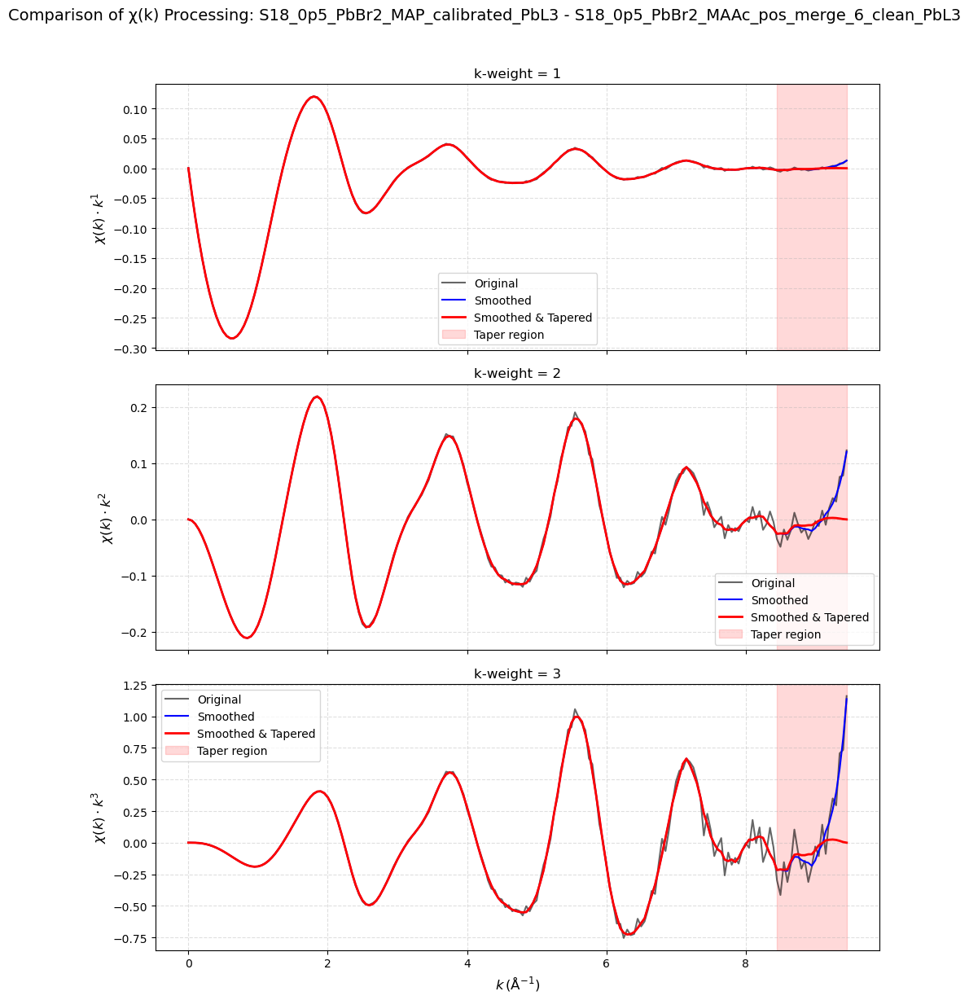


Comparing chi(k) processing for Project: S1_0P1_PbI2_MAF_PbEdge
Found 1 processed groups


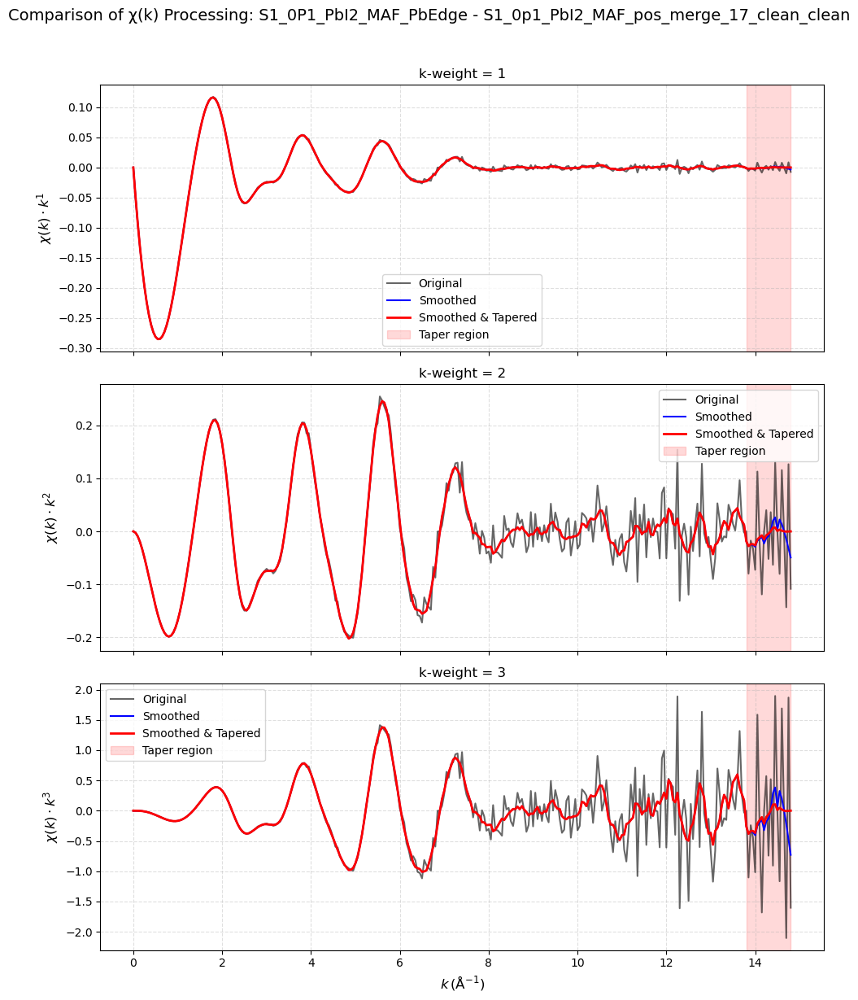


Comparing chi(k) processing for Project: S4_0p3_PbI2_MAF_calibrated
Found 1 processed groups


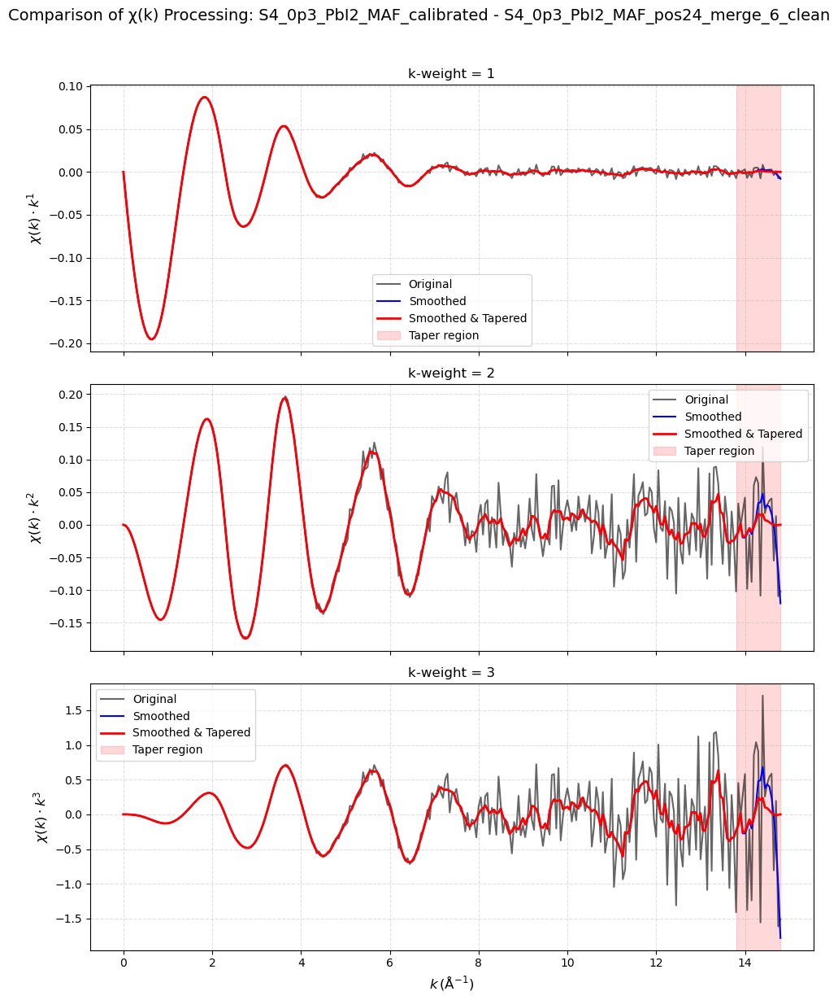


Comparing chi(k) processing for Project: S6_PbI2_0p3_MAP_calibrated
Found 1 processed groups


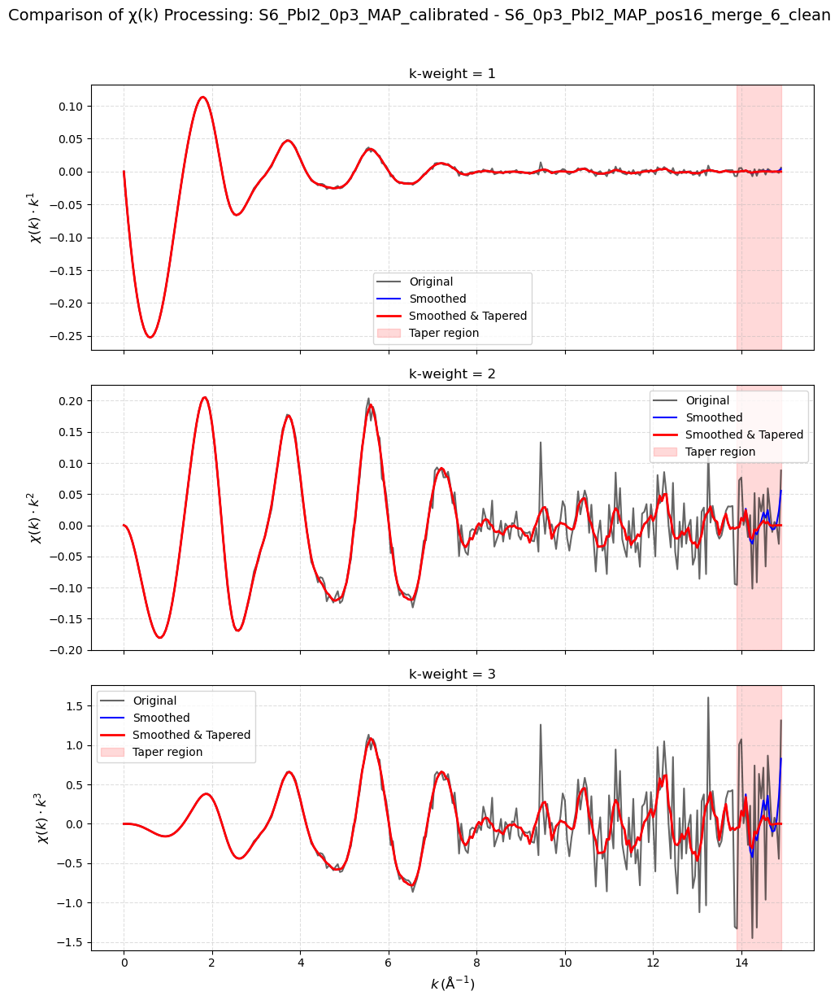

In [5]:
def compare_chi_processing(projects, k_weights=[1, 2, 3]):
    """
    Create overlay plots comparing original and processed chi(k) data for different k weightings.
    
    Parameters:
    -----------
    projects : dict
        Dictionary of projects loaded and processed with background_optimizer and smooth_and_taper_chi
    k_weights : list
        List of k-weight values to use for plotting (default: [1, 2, 3])
    
    This function creates plots that overlay:
    - Original chi(k) × k^weight
    - Smoothed chi(k) × k^weight
    - Tapered & smoothed chi(k) × k^weight
    for visual comparison of the effects of processing.
    
    Returns:
    --------
    dict
        The projects dictionary (for chaining)
    """
    try:
        k_label = plab.k
    except NameError:
        k_label = "k"
    
    if not projects:
        print("No projects provided for comparison")
        return projects
    
    # Loop through all projects and groups
    for proj_name, project in projects.items():
        print(f"\nComparing chi(k) processing for Project: {proj_name}")
        
        # Check which groups have all required data
        processed_groups = [name for name, grp in project.groups.items() 
                            if hasattr(grp, 'k') and hasattr(grp, 'chi') 
                            and hasattr(grp, 'chi_smoothed') and hasattr(grp, 'chi_tapered')]
        
        if not processed_groups:
            print(f"No processed groups found in project {proj_name}")
            continue
            
        print(f"Found {len(processed_groups)} processed groups")
        
        # For each group with processed data, create comparison plots
        for group_name, group in project.groups.items():
            if (hasattr(group, 'k') and hasattr(group, 'chi') 
                and hasattr(group, 'chi_smoothed') and hasattr(group, 'chi_tapered')):
                
                # Create a figure with subplots for each k-weight
                fig, axs = plt.subplots(len(k_weights), 1, figsize=(10, 4*len(k_weights)), sharex=True)
                if len(k_weights) == 1:
                    axs = [axs]  # Ensure axs is always a list
                
                # Plot each k-weight in its own subplot
                for i, kw in enumerate(k_weights):
                    # Get the k-weighted data
                    chi_orig_kw = group.chi * group.k**kw
                    chi_smooth_kw = group.chi_smoothed * group.k**kw
                    chi_taper_kw = group.chi_tapered * group.k**kw
                    
                    # Plot the original, smoothed, and tapered data
                    axs[i].plot(group.k, chi_orig_kw, label="Original", 
                               color='black', linestyle='-', alpha=0.6, linewidth=1.5)
                    axs[i].plot(group.k, chi_smooth_kw, label="Smoothed", 
                               color='blue', linestyle='-', linewidth=1.5)
                    axs[i].plot(group.k, chi_taper_kw, label="Smoothed & Tapered", 
                               color='red', linestyle='-', linewidth=2)
                    
                    # Add a shaded region for the taper area if taper parameters exist
                    if hasattr(group, 'taper_parameters') and 'taper_delta' in group.taper_parameters:
                        taper_delta = group.taper_parameters['taper_delta']
                        kmax = np.max(group.k)
                        taper_start = kmax - taper_delta
                        axs[i].axvspan(taper_start, kmax, alpha=0.15, color='red', label="Taper region")
                    
                    # Set labels and grid
                    axs[i].set_ylabel(f"$χ(k) \\cdot k^{kw}$", fontsize=12)
                    axs[i].set_title(f"k-weight = {kw}", fontsize=12)
                    axs[i].grid(True, linestyle='--', alpha=0.4)
                    
                    # Add legend to each subplot
                    axs[i].legend(loc='best', fontsize=10)
                
                # Set common labels
                axs[-1].set_xlabel(k_label, fontsize=12)
                
                # Set the global title
                plt.suptitle(f"Comparison of χ(k) Processing: {proj_name} - {group_name}", 
                             fontsize=14, y=1.02)
                plt.tight_layout()
                plt.show()
            else:
                # Check which data is missing
                missing = []
                for attr in ['k', 'chi', 'chi_smoothed', 'chi_tapered']:
                    if not hasattr(group, attr):
                        missing.append(attr)
                
                if missing:
                    print(f"  Skipping group {group_name}: Missing attributes: {', '.join(missing)}")
    
    return projects  # Return projects for chaining

projects = compare_chi_processing(projects)


Processing FT for Project 'S10_0p1_PbBr2_MAF_calibrated_merged', Group 'S10_0p1_PbBr2_MAF_pos24_merge_8_PbEdge'
  Using rbkg = 1.34 Å

  Analyzing with k-weight 3:
  Found 13 zero crossings
  All zero crossings: [0.   1.35 2.25 3.2  4.15 5.1  5.95 6.8  7.65 8.   8.15 8.75 9.3 ]
  Selected kmin candidates: [2.25]
  Selected kmax candidates: [6.8  7.65 8.  ]


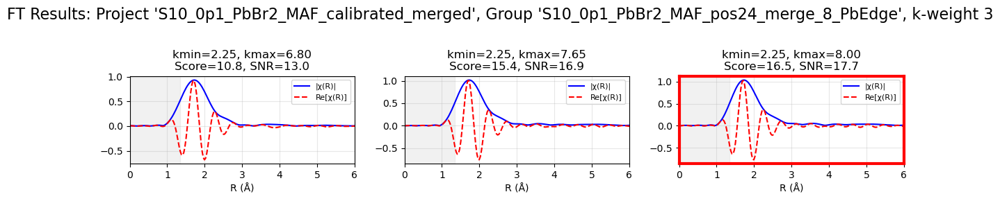

  Best parameters (k-weight 3):
    kmin = 2.250
    kmax = 8.000
    SNR = 17.7
    Quality Score = 16.45304875210067


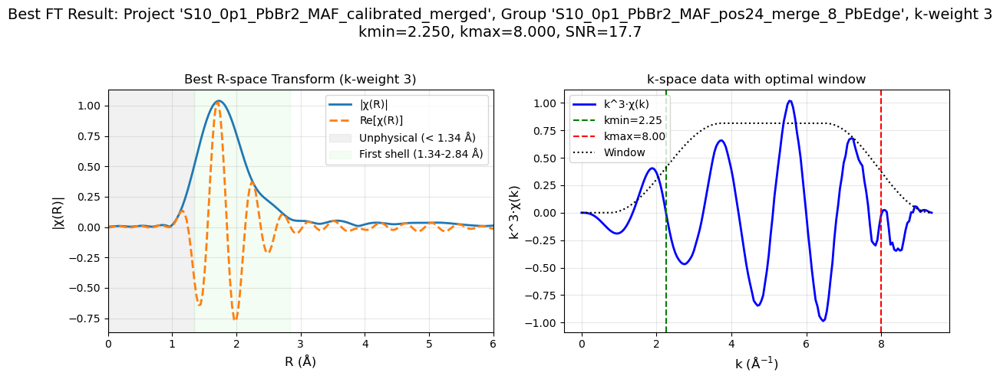


Processing FT for Project 'S11_0p1_PBBR2_MAAc_calibrated_PbL3', Group 'S11_0p1_PbBr2_MAAc_pos24_merge_9_clean_PbL3'
  Using rbkg = 1.29 Å

  Analyzing with k-weight 3:
  Found 15 zero crossings
  All zero crossings: [0.   1.35 2.2  3.45 4.3  5.25 6.   6.9  7.65 8.65 8.7  8.75 8.9  9.45
 9.7 ]
  Selected kmin candidates: [2.2]
  Selected kmax candidates: [6.9  7.65 8.65]


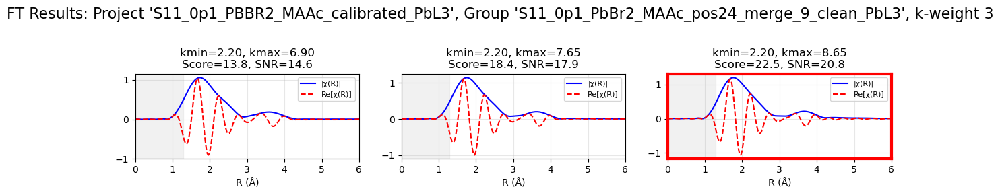

  Best parameters (k-weight 3):
    kmin = 2.200
    kmax = 8.650
    SNR = 20.8
    Quality Score = 22.469459989188103


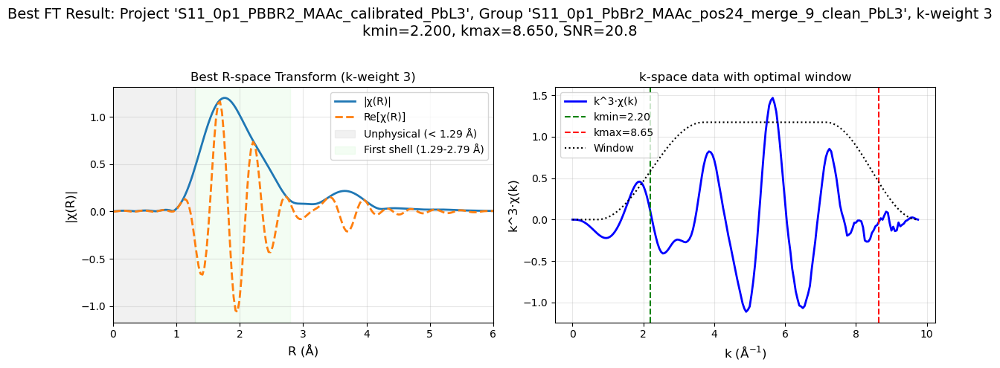


Processing FT for Project 'S14_0p3_PbBr2_MAAC_calibrated_PbL3', Group 'S14_0p3_PbBr2_MAAc_pos24_merge_9_clean_PbL3'
  Using rbkg = 1.31 Å

  Analyzing with k-weight 3:
  Found 11 zero crossings
  All zero crossings: [0.   1.35 2.2  3.35 4.2  5.2  6.   6.85 7.55 9.35 9.6 ]
  Selected kmin candidates: [2.2]
  Selected kmax candidates: [6.85 7.55 9.35]


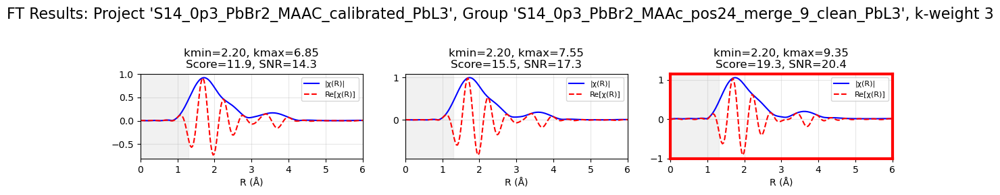

  Best parameters (k-weight 3):
    kmin = 2.200
    kmax = 9.350
    SNR = 20.4
    Quality Score = 19.338591372917012


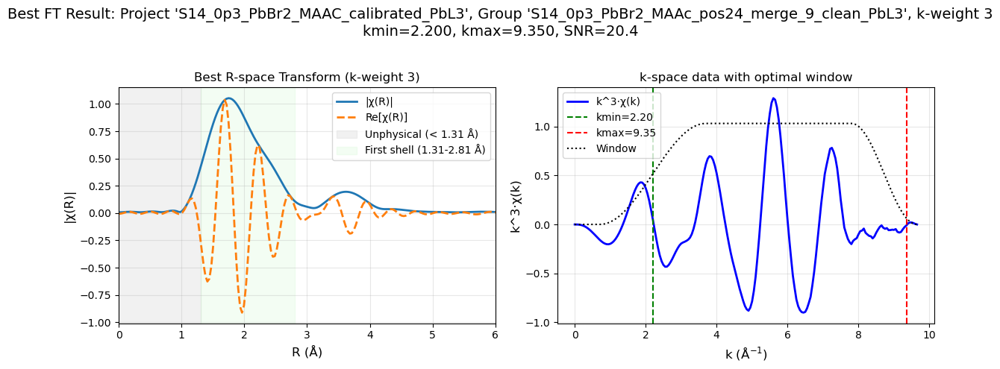


Processing FT for Project 'S15_0p3_PbBr2_MAP_calibrated_PbL3', Group 'S15_0p3_PbBr2_MAP_pos24_merge_9_clean_PbL3'
  Using rbkg = 1.28 Å

  Analyzing with k-weight 3:
  Found 13 zero crossings
  All zero crossings: [0.   1.3  2.2  3.3  4.2  5.2  5.95 6.85 7.5  8.   8.75 9.45 9.8 ]
  Selected kmin candidates: [2.2]
  Selected kmax candidates: [6.85 7.5  8.  ]


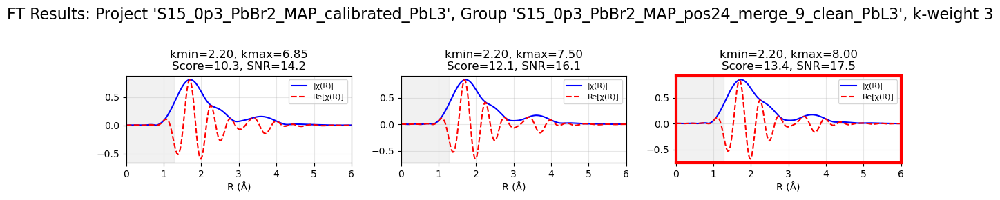

  Best parameters (k-weight 3):
    kmin = 2.200
    kmax = 8.000
    SNR = 17.5
    Quality Score = 13.363311191432224


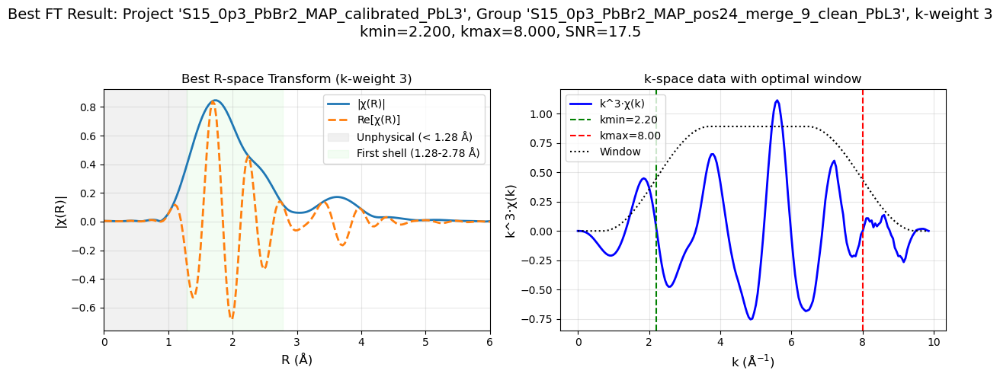


Processing FT for Project 'S17_0p5_PbBr2_MAAc_calibrated_PbL3', Group 'S17_0p5_PbBr2_MAAc_pos24_merge_6_clean_PbL3'
  Using rbkg = 1.32 Å

  Analyzing with k-weight 3:
  Found 13 zero crossings
  All zero crossings: [0.   1.3  2.2  3.2  4.15 5.15 5.95 6.8  7.5  7.85 8.15 9.2  9.45]
  Selected kmin candidates: [2.2]
  Selected kmax candidates: [6.8  7.5  7.85]


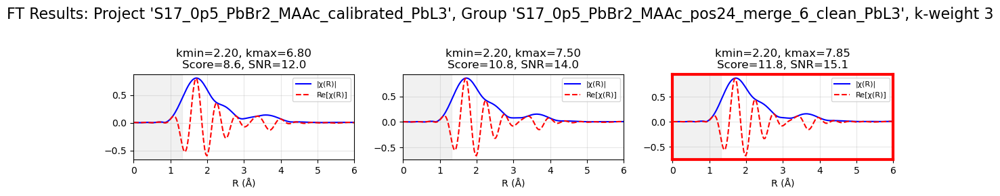

  Best parameters (k-weight 3):
    kmin = 2.200
    kmax = 7.850
    SNR = 15.1
    Quality Score = 11.825611605388634


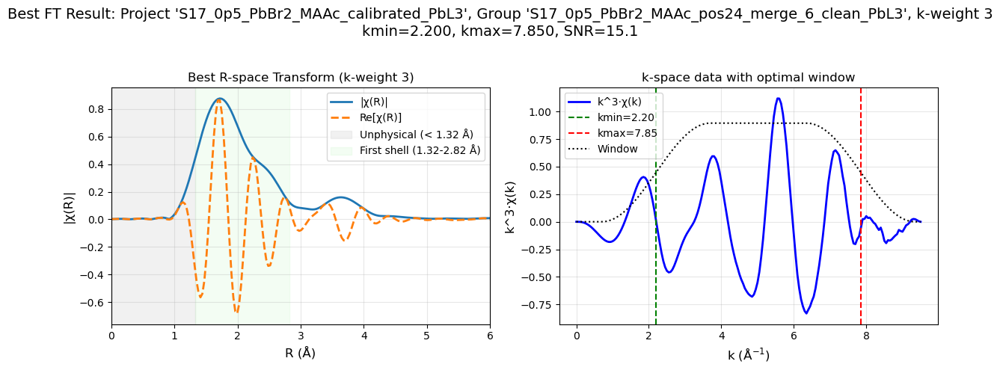


Processing FT for Project 'S18_0p5_PbBr2_MAP_calibrated_PbL3', Group 'S18_0p5_PbBr2_MAAc_pos_merge_6_clean_PbL3'
  Using rbkg = 1.33 Å

  Analyzing with k-weight 3:
  Found 13 zero crossings
  All zero crossings: [0.   1.35 2.2  3.1  4.1  5.15 5.95 6.8  7.5  8.   8.25 9.1  9.4 ]
  Selected kmin candidates: [2.2]
  Selected kmax candidates: [6.8 7.5 8. ]


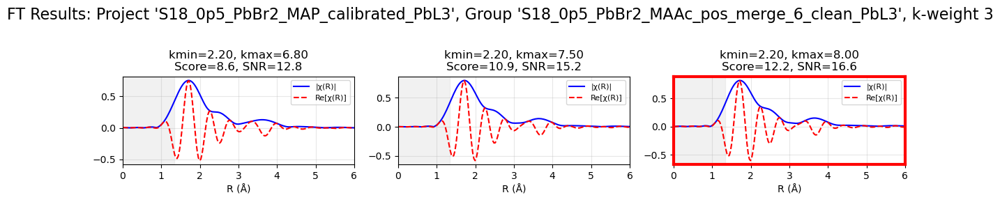

  Best parameters (k-weight 3):
    kmin = 2.200
    kmax = 8.000
    SNR = 16.6
    Quality Score = 12.188544864881267


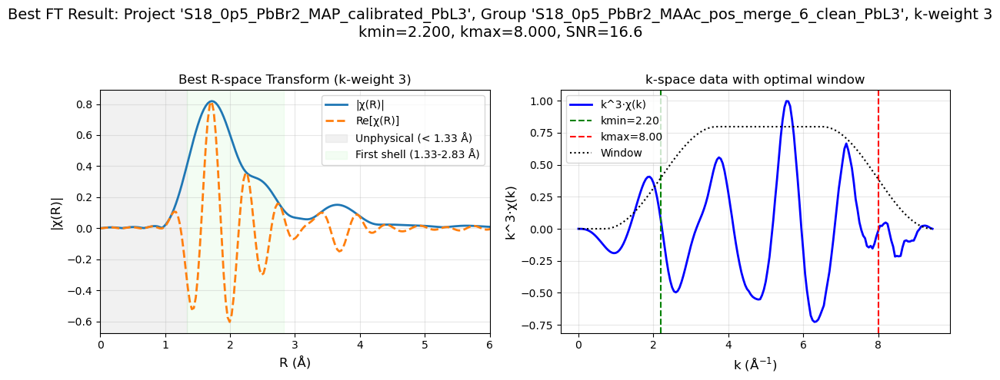


Processing FT for Project 'S1_0P1_PbI2_MAF_PbEdge', Group 'S1_0p1_PbI2_MAF_pos_merge_17_clean_clean'
  Using rbkg = 1.27 Å

  Analyzing with k-weight 3:
  Found 30 zero crossings
  All zero crossings: [ 0.    1.3   2.2   3.4   4.25  5.2   6.    6.9   7.6   8.5   8.8   9.
  9.1   9.3   9.6  10.05 10.65 11.25 11.4  11.55 11.6  11.7  12.25 12.65
 12.85 13.2  13.75 14.3  14.65 14.75]
  Selected kmin candidates: [2.2]
  Selected kmax candidates: [6.9 7.6 8.5]


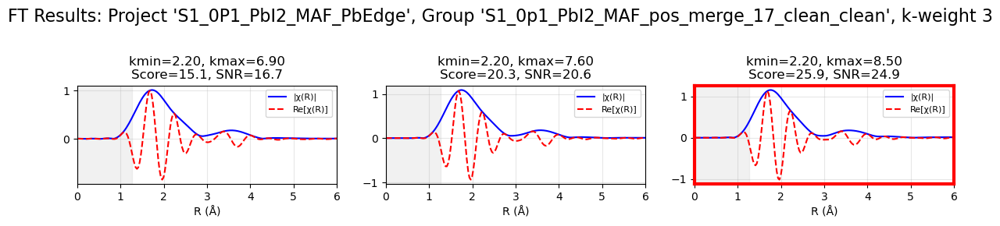

  Best parameters (k-weight 3):
    kmin = 2.200
    kmax = 8.500
    SNR = 24.9
    Quality Score = 25.907514024339108


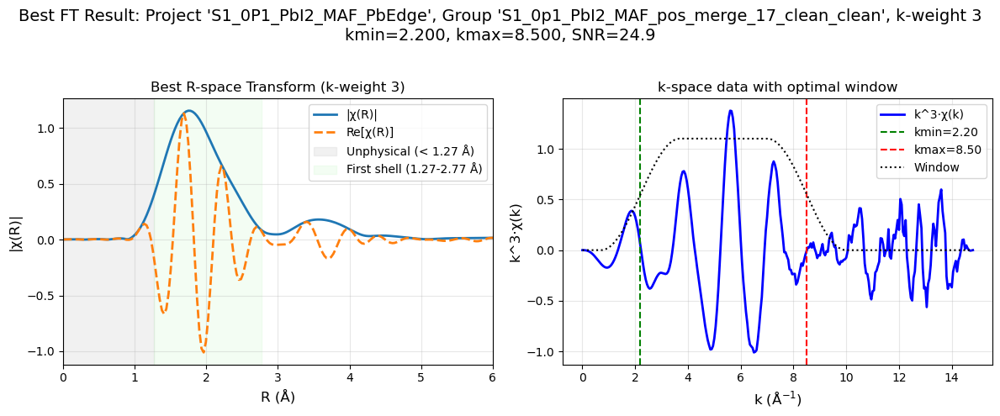


Processing FT for Project 'S4_0p3_PbI2_MAF_calibrated', Group 'S4_0p3_PbI2_MAF_pos24_merge_6_clean'
  Using rbkg = 1.27 Å

  Analyzing with k-weight 3:
  Found 28 zero crossings
  All zero crossings: [ 0.    1.35  2.25  3.2   4.05  5.05  6.05  6.85  7.65  7.95  8.5   9.15
  9.3   9.55 10.65 11.45 12.2  12.75 12.9  12.95 13.   13.15 13.5  13.85
 13.9  14.2  14.6  14.75]
  Selected kmin candidates: [2.25]
  Selected kmax candidates: [6.05 6.85 7.65]


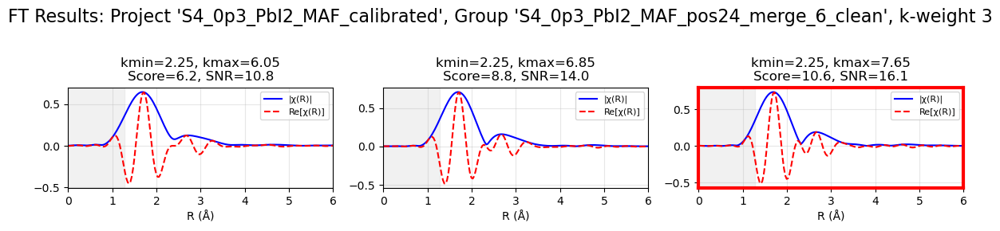

  Best parameters (k-weight 3):
    kmin = 2.250
    kmax = 7.650
    SNR = 16.1
    Quality Score = 10.581612410579137


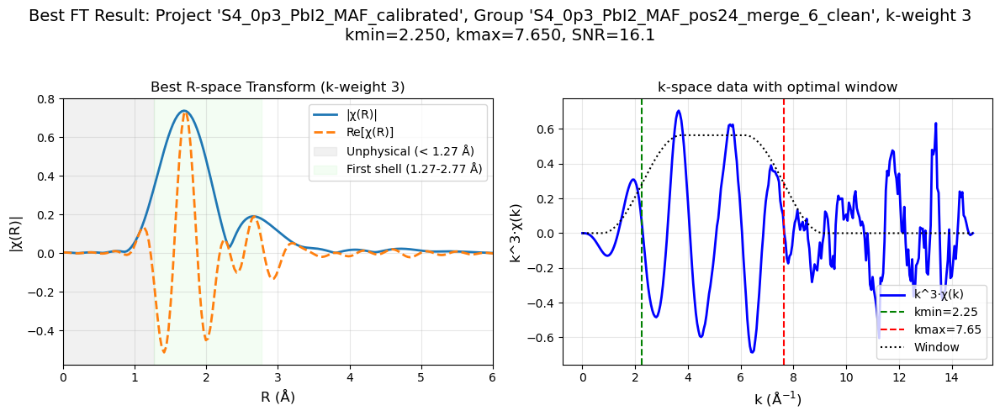


Processing FT for Project 'S6_PbI2_0p3_MAP_calibrated', Group 'S6_0p3_PbI2_MAP_pos16_merge_6_clean'
  Using rbkg = 1.26 Å

  Analyzing with k-weight 3:
  Found 33 zero crossings
  All zero crossings: [ 0.    1.3   2.2   3.25  4.1   5.2   6.    6.85  7.55  8.    8.05  8.1
  8.3   9.3   9.65  9.8  10.   10.2  10.6  11.05 11.25 11.75 12.4  13.1
 13.45 13.55 13.7  13.95 14.15 14.4  14.6  14.75 14.85]
  Selected kmin candidates: [2.2]
  Selected kmax candidates: [6.85 7.55 8.  ]


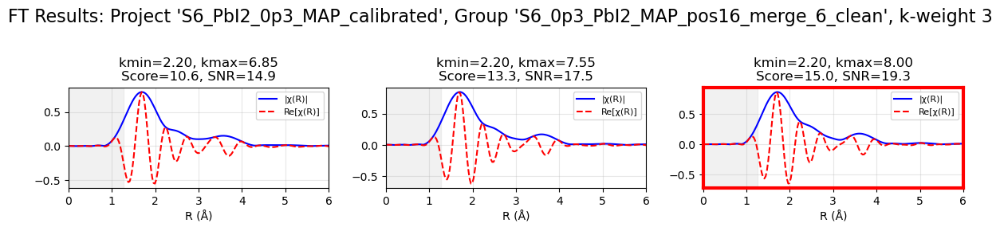

  Best parameters (k-weight 3):
    kmin = 2.200
    kmax = 8.000
    SNR = 19.3
    Quality Score = 15.032349646061446


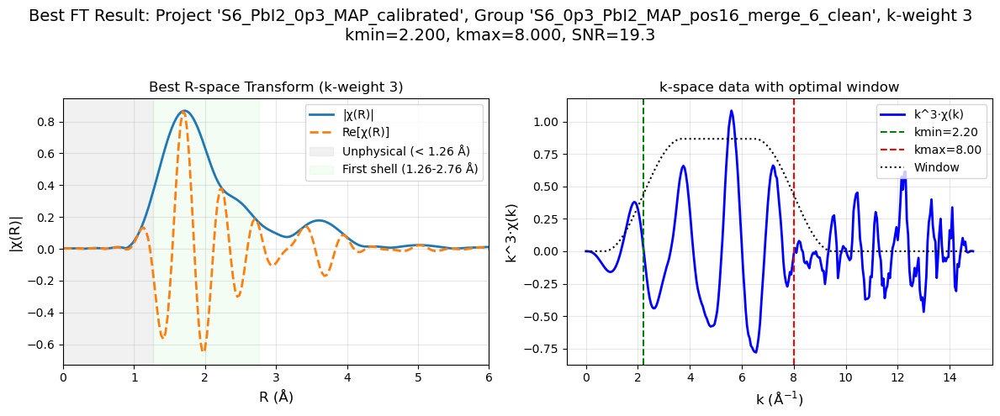


Summary of FT optimization results:
  S10_0p1_PbBr2_MAF_calibrated_merged - S10_0p1_PbBr2_MAF_pos24_merge_8_PbEdge: kmin=2.25, kmax=8.00
  S11_0p1_PBBR2_MAAc_calibrated_PbL3 - S11_0p1_PbBr2_MAAc_pos24_merge_9_clean_PbL3: kmin=2.20, kmax=8.65
  S14_0p3_PbBr2_MAAC_calibrated_PbL3 - S14_0p3_PbBr2_MAAc_pos24_merge_9_clean_PbL3: kmin=2.20, kmax=9.35
  S15_0p3_PbBr2_MAP_calibrated_PbL3 - S15_0p3_PbBr2_MAP_pos24_merge_9_clean_PbL3: kmin=2.20, kmax=8.00
  S17_0p5_PbBr2_MAAc_calibrated_PbL3 - S17_0p5_PbBr2_MAAc_pos24_merge_6_clean_PbL3: kmin=2.20, kmax=7.85
  S18_0p5_PbBr2_MAP_calibrated_PbL3 - S18_0p5_PbBr2_MAAc_pos_merge_6_clean_PbL3: kmin=2.20, kmax=8.00
  S1_0P1_PbI2_MAF_PbEdge - S1_0p1_PbI2_MAF_pos_merge_17_clean_clean: kmin=2.20, kmax=8.50
  S4_0p3_PbI2_MAF_calibrated - S4_0p3_PbI2_MAF_pos24_merge_6_clean: kmin=2.25, kmax=7.65
  S6_PbI2_0p3_MAP_calibrated - S6_0p3_PbI2_MAP_pos16_merge_6_clean: kmin=2.20, kmax=8.00


In [6]:
def ft_processing_batch(projects, k_weights=[3], dk=4, window='hanning'):
    """
    Perform batch Fourier Transform (FT) processing with automated kmin/kmax optimization.
    
    Parameters:
    -----------
    projects : dict
        Dictionary of projects loaded and processed with background_optimizer and smooth_and_taper_chi
    k_weights : list
        List of k-weights to use for FT processing (default: [3])
    dk : float
        Window sill width parameter for the FT window function
    window : str
        Window type to use ('hanning', 'kaiser', 'gaussian', etc.)
    
    For each group (with attributes 'k' and 'chi_tapered'), this function:
    - Determines candidate kmin/kmax values (using zero crossings)
    - Performs FT processing on each candidate pair
    - Evaluates quality metrics and identifies the optimal parameters
    - Generates diagnostic plots for comparison
    - Stores the optimal parameters and results in the group
    
    Returns:
    --------
    dict
        The modified projects dictionary with FT results
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from larch.xafs import xftf
    from larch import Group
    
    if not projects:
        print("No projects provided for FT processing")
        return projects
    
    for proj_name, project in projects.items():
        for group_name, group in project.groups.items():
            if hasattr(group, 'k') and hasattr(group, 'chi_tapered'):
                k = group.k
                chi_tapered = group.chi_tapered
                rbkg_value = getattr(group, 'optimal_rbkg', getattr(group, 'rbkg', 1.2))
                
                print(f"\nProcessing FT for Project '{proj_name}', Group '{group_name}'")
                print(f"  Using rbkg = {rbkg_value:.2f} Å")
                
                for kw in k_weights:
                    print(f"\n  Analyzing with k-weight {kw}:")
                    weighted_chi = chi_tapered * k**kw
                    zc_indices = np.where(np.diff(np.sign(weighted_chi)))[0]
                    if zc_indices.size > 0:
                        candidates_all = np.sort(k[zc_indices])
                        print(f"  Found {len(candidates_all)} zero crossings")
                        print(f"  All zero crossings: {np.round(candidates_all, 2)}")
                    else:
                        candidates_all = np.array([])
                        print("  No zero crossings found! Using default values.")
                    
                    # Determine kmin candidates
                    kmin_region = candidates_all[(candidates_all >= 1.5) & (candidates_all <= 3)]
                    if len(kmin_region) > 0:
                        candidate_kmin_list = kmin_region[:3]
                    elif len(candidates_all) > 0:
                        first_zc = candidates_all[0]
                        candidate_kmin_list = np.array([first_zc]) if first_zc > 1.0 else np.array([3.0])
                    else:
                        candidate_kmin_list = np.array([3.0])
                    
                    # Determine kmax candidates
                    high_k_region = candidates_all[(candidates_all > 6.0)]
                    if len(high_k_region) > 0:
                        candidate_kmax_list = np.sort(high_k_region[:3])  # selecting the first 6 candidates
                    else:
                        # If no candidates found above 11, use a reasonable default range
                        max_k = np.max(k)
                        candidate_kmax_list = np.array([max_k - 1])

                    print(f"  Selected kmin candidates: {np.round(candidate_kmin_list, 2)}")
                    print(f"  Selected kmax candidates: {np.round(candidate_kmax_list, 2)}")
                    
                    ft_results = []
                    best_score = -float('inf')
                    best_kmin = None
                    best_kmax = None
                    best_temp = None
                    
                    n_rows = len(candidate_kmin_list)
                    n_cols = len(candidate_kmax_list)
                    
                    if n_rows * n_cols > 1:
                        fig, axs = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 3 * n_rows), sharex=True)
                        # Ensure axs is 2D even if one dimension is 1
                        if n_rows == 1 and n_cols == 1:
                            axs = np.array([[axs]])
                        elif n_rows == 1:
                            axs = np.expand_dims(axs, axis=0)
                        elif n_cols == 1:
                            axs = np.expand_dims(axs, axis=1)
                        
                        for i, cand_kmin in enumerate(candidate_kmin_list):
                            for j, cand_kmax in enumerate(candidate_kmax_list):
                                ax = axs[i, j]
                                if cand_kmin < cand_kmax:
                                    temp = Group()
                                    temp.k = k.copy()
                                    temp.chi = chi_tapered.copy()
                                    xftf(temp, kweight=kw, kmin=cand_kmin, kmax=cand_kmax, 
                                         dk=dk, kwindow=window)
                                    ax.plot(temp.r, temp.chir_mag, label="|χ(R)|", color='blue')
                                    ax.plot(temp.r, temp.chir_re, label="Re[χ(R)]", 
                                            linestyle='--', color='red')
                                    
                                    first_shell_mask = (temp.r > rbkg_value) & (temp.r < rbkg_value + 1.5)
                                    if np.any(first_shell_mask):
                                        first_shell_height = np.max(temp.chir_mag[first_shell_mask])
                                        first_shell_pos = temp.r[first_shell_mask][np.argmax(temp.chir_mag[first_shell_mask])]
                                        noise_mask = (temp.r > 0) & (temp.r < rbkg_value)
                                        noise = np.mean(temp.chir_mag[noise_mask]) if np.any(noise_mask) else 0.001
                                        snr = first_shell_height / noise if noise > 0 else 0
                                        position_factor = 1.0 - 0.2 * abs(first_shell_pos - 2.5) / 1.5
                                        quality_score = snr * position_factor * first_shell_height

                                        ft_results.append({
                                            'kmin': cand_kmin,
                                            'kmax': cand_kmax,
                                            'snr': snr,
                                            'quality_score': quality_score,
                                            'temp': temp
                                        })

                                        if quality_score > best_score:
                                            best_score = quality_score
                                            best_kmin = cand_kmin
                                            best_kmax = cand_kmax
                                            best_temp = Group()
                                            best_temp.k = temp.k.copy()
                                            best_temp.chi = temp.chi.copy()
                                            best_temp.r = temp.r.copy()
                                            best_temp.chir_mag = temp.chir_mag.copy()
                                            best_temp.chir_re = temp.chir_re.copy()
                                            best_temp.chir_im = temp.chir_im.copy() if hasattr(temp, 'chir_im') else None

                                        ax.set_title(f"kmin={cand_kmin:.2f}, kmax={cand_kmax:.2f}\n"
                                                     f"Score={quality_score:.1f}, SNR={snr:.1f}")
                                    else:
                                        ax.set_title(f"kmin={cand_kmin:.2f}, kmax={cand_kmax:.2f}")
                                    
                                    ax.axvspan(0, rbkg_value, color='lightgray', alpha=0.3)
                                    ax.set_xlabel('R (Å)')
                                    ax.grid(True, alpha=0.3)
                                    ax.legend(fontsize=8)
                                    ax.set_xlim(0, 6)
                                else:
                                    ax.text(0.5, 0.5, "Invalid combination\nkmin ≥ kmax", 
                                            ha='center', va='center')
                                    ax.set_title(f"kmin={cand_kmin:.2f}, kmax={cand_kmax:.2f}")
                        
                        if best_kmin is not None and best_kmax is not None:
                            try:
                                best_i = np.where(candidate_kmin_list == best_kmin)[0][0]
                                best_j = np.where(candidate_kmax_list == best_kmax)[0][0]
                                for spine in axs[best_i, best_j].spines.values():
                                    spine.set_edgecolor('red')
                                    spine.set_linewidth(3)
                            except Exception as e:
                                print(f"  Warning: Couldn't highlight best parameter pair: {e}")
                        
                        fig.suptitle(f"FT Results: Project '{proj_name}', Group '{group_name}', k-weight {kw}", 
                                     fontsize=16)
                        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
                        plt.show()
                    
                    if ft_results:
                        ft_results.sort(key=lambda x: x.get('quality_score', x.get('snr', 0)), reverse=True)
                        best_result = ft_results[0]
                        setattr(group, f"best_kmin_kw{kw}", best_result['kmin'])
                        setattr(group, f"best_kmax_kw{kw}", best_result['kmax'])
                        if kw == 2:
                            group.best_kmin = best_result['kmin']
                            group.best_kmax = best_result['kmax']
                        
                        best_temp = best_result['temp']
                        setattr(group, f"best_r_kw{kw}", best_temp.r)
                        setattr(group, f"best_chir_mag_kw{kw}", best_temp.chir_mag)
                        setattr(group, f"best_chir_re_kw{kw}", best_temp.chir_re)
                        if hasattr(best_temp, 'chir_im'):
                            setattr(group, f"best_chir_im_kw{kw}", best_temp.chir_im)
                        
                        print(f"  Best parameters (k-weight {kw}):")
                        print(f"    kmin = {best_result['kmin']:.3f}")
                        print(f"    kmax = {best_result['kmax']:.3f}")
                        print(f"    SNR = {best_result['snr']:.1f}")
                        print(f"    Quality Score = {best_result.get('quality_score', 'N/A')}")
                        
                        plt.figure(figsize=(12, 5))
                        plt.subplot(1, 2, 1)
                        plt.plot(best_temp.r, best_temp.chir_mag, label="|χ(R)|", linewidth=2)
                        plt.plot(best_temp.r, best_temp.chir_re, label="Re[χ(R)]", linestyle='--', linewidth=2)
                        plt.axvspan(0, rbkg_value, color='lightgray', alpha=0.3, 
                                    label=f"Unphysical (< {rbkg_value:.2f} Å)")
                        plt.axvspan(rbkg_value, rbkg_value + 1.5, color='lightgreen', alpha=0.1, 
                                    label=f"First shell ({rbkg_value:.2f}-{rbkg_value+1.5:.2f} Å)")
                        plt.xlabel('R (Å)', fontsize=12)
                        plt.ylabel('|χ(R)|', fontsize=12)
                        plt.title(f"Best R-space Transform (k-weight {kw})")
                        plt.grid(True, alpha=0.3)
                        plt.legend()
                        plt.xlim(0, 6)
                        
                        plt.subplot(1, 2, 2)
                        plt.plot(k, chi_tapered * k**kw, 'b-', lw=2, label=f'k^{kw}·χ(k)')
                        plt.axvline(x=best_result['kmin'], color='g', linestyle='--', 
                                    label=f'kmin={best_result["kmin"]:.2f}')
                        plt.axvline(x=best_result['kmax'], color='r', linestyle='--', 
                                    label=f'kmax={best_result["kmax"]:.2f}')
                        
                        try:
                            from larch.xafs.xafsft import ftwindow
                            win = ftwindow(k, xmin=best_result['kmin'], xmax=best_result['kmax'], 
                                           dx=dk, window=window)
                            plt.plot(k, win * np.max(np.abs(chi_tapered * k**kw)) * 0.8, 
                                     'k:', label='Window')
                        except Exception as e:
                            print(f"  Warning: Could not generate window function: {e}")
                        
                        plt.xlabel('k (Å$^{-1}$)', fontsize=12)
                        plt.ylabel(f'k^{kw}·χ(k)', fontsize=12)
                        plt.title('k-space data with optimal window')
                        plt.legend()
                        plt.grid(True, alpha=0.3)
                        
                        plt.suptitle(
                            f"Best FT Result: Project '{proj_name}', Group '{group_name}', k-weight {kw}\n"
                            f"kmin={best_result['kmin']:.3f}, kmax={best_result['kmax']:.3f}, SNR={best_result['snr']:.1f}",
                            fontsize=14
                        )
                        plt.tight_layout(rect=[0, 0, 1, 0.95])
                        plt.show()
            else:
                print(f"Skipping group '{group_name}' in Project '{proj_name}': Missing 'k' or 'chi_tapered' attribute")
    
    return projects  # Return the modified projects for chaining

projects = ft_processing_batch(projects, k_weights=[3], dk=3, window='hanning')

# Verify results
if projects:
    print("\nSummary of FT optimization results:")
    for proj_name, project in projects.items():
        for group_name, group in project.groups.items():
            if hasattr(group, 'best_kmin_kw3'):
                print(f"  {proj_name} - {group_name}: kmin={group.best_kmin_kw3:.2f}, kmax={group.best_kmax_kw3:.2f}")

Starting enhanced_iteration1_fit with 9 projects
Searching for and analyzing Pb-O FEFF paths in C:/Users/kwill/.larch/feff/relaxed
Found 291 Pb-O FEFF paths.

Detailed information about Pb-O paths:
Index  Type   Reff     Deg    n-leg  Label
--------------------------------------------------------------------------------
     1 ss     2.417 Å      1      2  Pb-O SS: 2.417Å
     2 ss     2.431 Å      1      2  Pb-O SS: 2.431Å
     3 ss     2.434 Å      1      2  Pb-O SS: 2.434Å
     4 ss     2.468 Å      1      2  Pb-O SS: 2.468Å
     5 ss     2.488 Å      1      2  Pb-O SS: 2.488Å
     6 ss     2.565 Å      1      2  Pb-O SS: 2.565Å
     7 ss     2.613 Å      1      2  Pb-O SS: 2.613Å
     8 ss     2.633 Å      1      2  Pb-O SS: 2.633Å
     9 ss     2.675 Å      1      2  Pb-O SS: 2.675Å
    10 ss     2.770 Å      1      2  Pb-O SS: 2.770Å
    11 ss     2.788 Å      1      2  Pb-O SS: 2.788Å
    12 ss     3.188 Å      1      2  Pb-O SS: 3.188Å
    13 ms     3.709 Å      2      3  Pb-1O

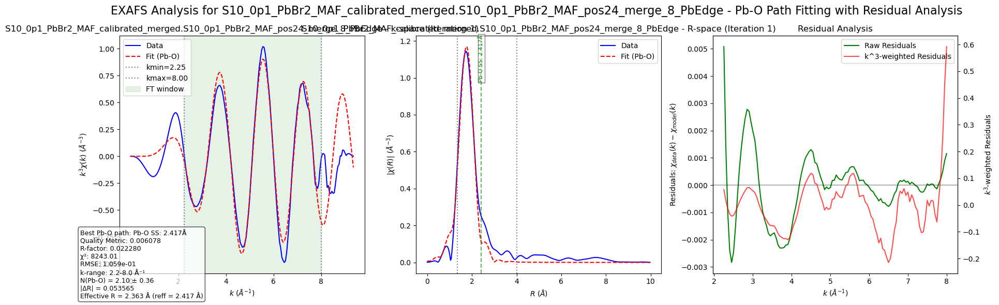


Processing Project: S11_0p1_PBBR2_MAAc_calibrated_PbL3

Processing Group: S11_0p1_PBBR2_MAAc_calibrated_PbL3.S11_0p1_PbBr2_MAAc_pos24_merge_9_clean_PbL3

Processing group: S11_0p1_PBBR2_MAAc_calibrated_PbL3.S11_0p1_PbBr2_MAAc_pos24_merge_9_clean_PbL3
  Found optimized kmin = 2.20 for kw=3
  Found optimized kmax = 8.65 for kw=3
  Created transform with k-range: 2.20 to 8.65 Å⁻¹, kw=3
Evaluating 12 Pb-O paths for S11_0p1_PBBR2_MAAc_calibrated_PbL3.S11_0p1_PbBr2_MAAc_pos24_merge_9_clean_PbL3...
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 1: Pb-O SS: 2.417Å - |ΔR|: 0.048, R-factor: 0.117058, RMSE: 2.463e-01, Quality: 0.028985
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 2: Pb-O SS: 2.431Å - |ΔR|: 0.060, R-factor: 0.113568, RMSE: 2.390e-01, Quality: 0.031904
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 3: Pb-

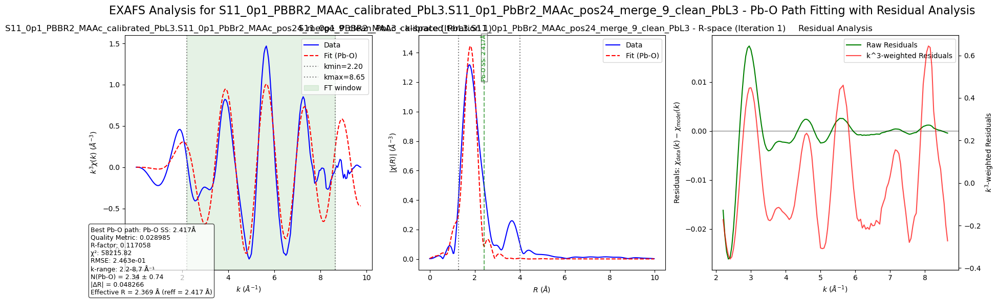


Processing Project: S14_0p3_PbBr2_MAAC_calibrated_PbL3

Processing Group: S14_0p3_PbBr2_MAAC_calibrated_PbL3.S14_0p3_PbBr2_MAAc_pos24_merge_9_clean_PbL3

Processing group: S14_0p3_PbBr2_MAAC_calibrated_PbL3.S14_0p3_PbBr2_MAAc_pos24_merge_9_clean_PbL3
  Found optimized kmin = 2.20 for kw=3
  Found optimized kmax = 9.35 for kw=3
  Created transform with k-range: 2.20 to 9.35 Å⁻¹, kw=3
Evaluating 12 Pb-O paths for S14_0p3_PbBr2_MAAC_calibrated_PbL3.S14_0p3_PbBr2_MAAc_pos24_merge_9_clean_PbL3...
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 1: Pb-O SS: 2.417Å - |ΔR|: 0.052, R-factor: 0.145856, RMSE: 2.272e-01, Quality: 0.040980
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 2: Pb-O SS: 2.431Å - |ΔR|: 0.064, R-factor: 0.140627, RMSE: 2.195e-01, Quality: 0.043731
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 3: Pb-

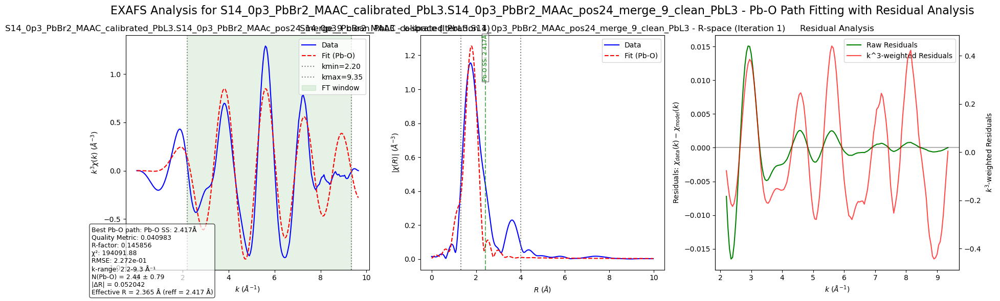


Processing Project: S15_0p3_PbBr2_MAP_calibrated_PbL3

Processing Group: S15_0p3_PbBr2_MAP_calibrated_PbL3.S15_0p3_PbBr2_MAP_pos24_merge_9_clean_PbL3

Processing group: S15_0p3_PbBr2_MAP_calibrated_PbL3.S15_0p3_PbBr2_MAP_pos24_merge_9_clean_PbL3
  Found optimized kmin = 2.20 for kw=3
  Found optimized kmax = 8.00 for kw=3
  Created transform with k-range: 2.20 to 8.00 Å⁻¹, kw=3
Evaluating 12 Pb-O paths for S15_0p3_PbBr2_MAP_calibrated_PbL3.S15_0p3_PbBr2_MAP_pos24_merge_9_clean_PbL3...
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 1: Pb-O SS: 2.417Å - |ΔR|: 0.044, R-factor: 0.102542, RMSE: 1.705e-01, Quality: 0.022374
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 2: Pb-O SS: 2.431Å - |ΔR|: 0.057, R-factor: 0.106221, RMSE: 1.722e-01, Quality: 0.027870
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 3: Pb-O SS: 2

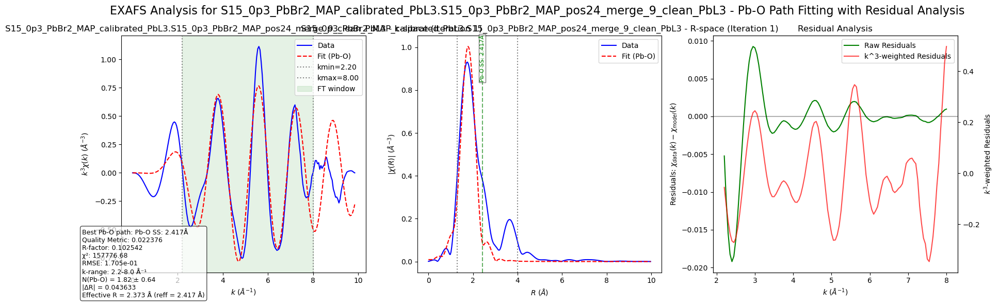


Processing Project: S17_0p5_PbBr2_MAAc_calibrated_PbL3

Processing Group: S17_0p5_PbBr2_MAAc_calibrated_PbL3.S17_0p5_PbBr2_MAAc_pos24_merge_6_clean_PbL3

Processing group: S17_0p5_PbBr2_MAAc_calibrated_PbL3.S17_0p5_PbBr2_MAAc_pos24_merge_6_clean_PbL3
  Found optimized kmin = 2.20 for kw=3
  Found optimized kmax = 7.85 for kw=3
  Created transform with k-range: 2.20 to 7.85 Å⁻¹, kw=3
Evaluating 12 Pb-O paths for S17_0p5_PbBr2_MAAc_calibrated_PbL3.S17_0p5_PbBr2_MAAc_pos24_merge_6_clean_PbL3...
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 1: Pb-O SS: 2.417Å - |ΔR|: 0.043, R-factor: 0.092303, RMSE: 1.562e-01, Quality: 0.019111
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 2: Pb-O SS: 2.431Å - |ΔR|: 0.056, R-factor: 0.095359, RMSE: 1.586e-01, Quality: 0.023881
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 3: Pb-

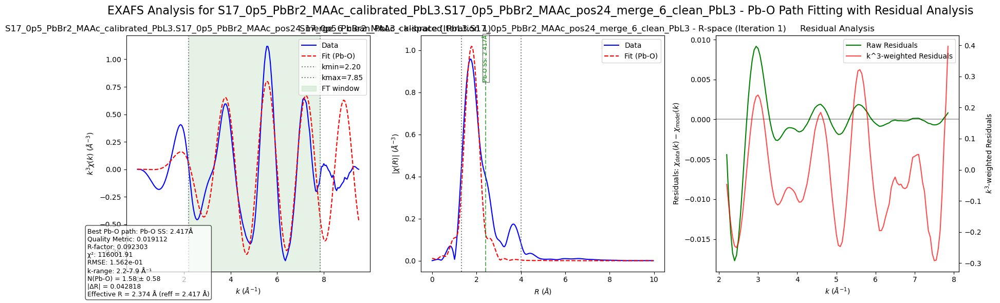


Processing Project: S18_0p5_PbBr2_MAP_calibrated_PbL3

Processing Group: S18_0p5_PbBr2_MAP_calibrated_PbL3.S18_0p5_PbBr2_MAAc_pos_merge_6_clean_PbL3

Processing group: S18_0p5_PbBr2_MAP_calibrated_PbL3.S18_0p5_PbBr2_MAAc_pos_merge_6_clean_PbL3
  Found optimized kmin = 2.20 for kw=3
  Found optimized kmax = 8.00 for kw=3
  Created transform with k-range: 2.20 to 8.00 Å⁻¹, kw=3
Evaluating 12 Pb-O paths for S18_0p5_PbBr2_MAP_calibrated_PbL3.S18_0p5_PbBr2_MAAc_pos_merge_6_clean_PbL3...
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 1: Pb-O SS: 2.417Å - |ΔR|: 0.047, R-factor: 0.089712, RMSE: 1.463e-01, Quality: 0.019565
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 2: Pb-O SS: 2.431Å - |ΔR|: 0.061, R-factor: 0.091889, RMSE: 1.444e-01, Quality: 0.024374
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 3: Pb-O SS: 2.43

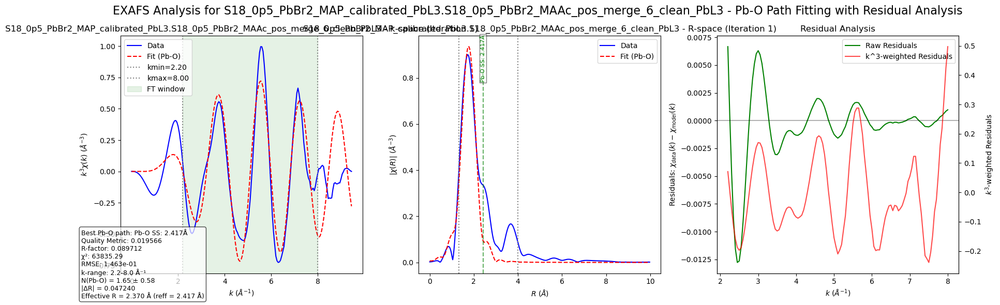


Processing Project: S1_0P1_PbI2_MAF_PbEdge

Processing Group: S1_0P1_PbI2_MAF_PbEdge.S1_0p1_PbI2_MAF_pos_merge_17_clean_clean

Processing group: S1_0P1_PbI2_MAF_PbEdge.S1_0p1_PbI2_MAF_pos_merge_17_clean_clean
  Found optimized kmin = 2.20 for kw=3
  Found optimized kmax = 8.50 for kw=3
  Created transform with k-range: 2.20 to 8.50 Å⁻¹, kw=3
Evaluating 12 Pb-O paths for S1_0P1_PbI2_MAF_PbEdge.S1_0p1_PbI2_MAF_pos_merge_17_clean_clean...
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 1: Pb-O SS: 2.417Å - |ΔR|: 0.052, R-factor: 0.086599, RMSE: 2.080e-01, Quality: 0.020419
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 2: Pb-O SS: 2.431Å - |ΔR|: 0.064, R-factor: 0.083257, RMSE: 1.985e-01, Quality: 0.023005
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 3: Pb-O SS: 2.434Å - |ΔR|: 0.069, R-factor: 0.084142, RMSE: 1.9

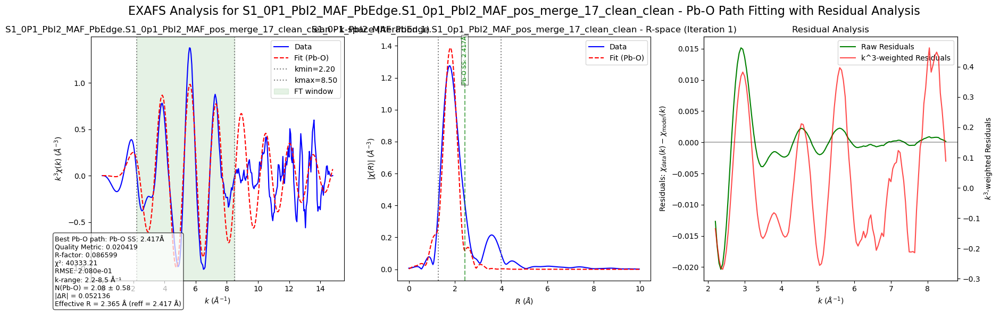


Processing Project: S4_0p3_PbI2_MAF_calibrated

Processing Group: S4_0p3_PbI2_MAF_calibrated.S4_0p3_PbI2_MAF_pos24_merge_6_clean

Processing group: S4_0p3_PbI2_MAF_calibrated.S4_0p3_PbI2_MAF_pos24_merge_6_clean
  Found optimized kmin = 2.25 for kw=3
  Found optimized kmax = 7.65 for kw=3
  Created transform with k-range: 2.25 to 7.65 Å⁻¹, kw=3
Evaluating 12 Pb-O paths for S4_0p3_PbI2_MAF_calibrated.S4_0p3_PbI2_MAF_pos24_merge_6_clean...
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 1: Pb-O SS: 2.417Å - |ΔR|: 0.072, R-factor: 0.058512, RMSE: 1.096e-01, Quality: 0.017675
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 2: Pb-O SS: 2.431Å - |ΔR|: 0.087, R-factor: 0.051414, RMSE: 9.876e-02, Quality: 0.019743
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 3: Pb-O SS: 2.434Å - |ΔR|: 0.091, R-factor: 0.050140, RMSE: 9.

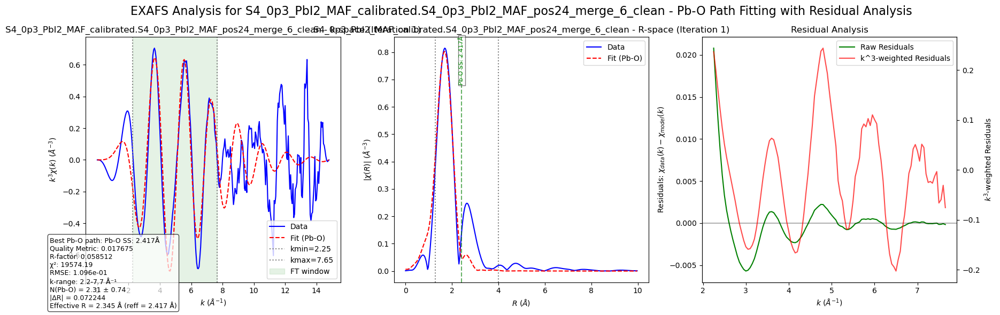


Processing Project: S6_PbI2_0p3_MAP_calibrated

Processing Group: S6_PbI2_0p3_MAP_calibrated.S6_0p3_PbI2_MAP_pos16_merge_6_clean

Processing group: S6_PbI2_0p3_MAP_calibrated.S6_0p3_PbI2_MAP_pos16_merge_6_clean
  Found optimized kmin = 2.20 for kw=3
  Found optimized kmax = 8.00 for kw=3
  Created transform with k-range: 2.20 to 8.00 Å⁻¹, kw=3
Evaluating 12 Pb-O paths for S6_PbI2_0p3_MAP_calibrated.S6_0p3_PbI2_MAP_pos16_merge_6_clean...
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 1: Pb-O SS: 2.417Å - |ΔR|: 0.065, R-factor: 0.088315, RMSE: 1.516e-01, Quality: 0.024340
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 2: Pb-O SS: 2.431Å - |ΔR|: 0.079, R-factor: 0.087947, RMSE: 1.488e-01, Quality: 0.028851
Building parameter group for iteration 1 (Pb-O evaluation)...
  Created parameters for iteration 1
  Path 3: Pb-O SS: 2.434Å - |ΔR|: 0.083, R-factor: 0.088113, RMSE: 1.

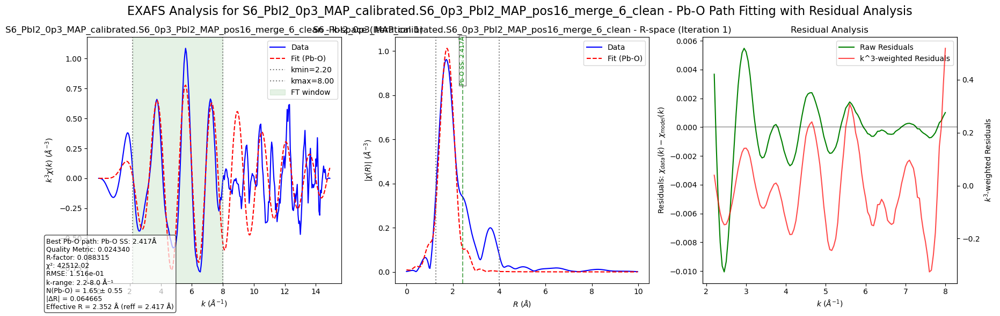


ITERATION 1 SUMMARY: BEST Pb-O PATHS FOR ALL GROUPS WITH RESIDUAL ANALYSIS
Successfully processed 9 groups
----------------------------------------------------------------------------------------------------
Group                          Path                      Reff    |ΔR|    N(Pb-O) Eff. R  R-factor   RMSE       Quality   
------------------------------------------------------------------------------------------------------------------------
S10_0p1_PbBr2_MAF_calibrated_merged.S10_0p1_PbBr2_MAF_pos24_merge_8_PbEdge Pb-O SS: 2.417Å           2.417 0.054 2.10 2.363 0.02227990 1.059e-01 0.006078
S11_0p1_PBBR2_MAAc_calibrated_PbL3.S11_0p1_PbBr2_MAAc_pos24_merge_9_clean_PbL3 Pb-O SS: 2.417Å           2.417 0.048 2.34 2.369 0.11705847 2.463e-01 0.028985
S14_0p3_PbBr2_MAAC_calibrated_PbL3.S14_0p3_PbBr2_MAAc_pos24_merge_9_clean_PbL3 Pb-O SS: 2.417Å           2.417 0.052 2.44 2.365 0.14585590 2.272e-01 0.040983
S15_0p3_PbBr2_MAP_calibrated_PbL3.S15_0p3_PbBr2_MAP_pos24_merge_9_clean_PbL3 P

In [7]:
def build_params_for_iteration(iteration, prev_result=None, So_2=0.788):
    """
    Build a parameter group for the given EXAFS fitting iteration.
    
    Now set up parameters for evaluating a Pb-O feff path first.
    
    Parameters:
    -----------
    iteration : int
        The iteration number.
    prev_result : object, optional
        Previous fit result with parameters to use as starting points.
    So_2 : float, optional
        Amplitude reduction factor (default: 0.78).
        
    Returns:
    --------
    param_group
        Group of parameters configured for fitting.
    """
    from larch.fitting import param, param_group

    print(f"Building parameter group for iteration {iteration} (Pb-O evaluation)...")

    # Create parameters group with a descriptive name.
    params = param_group(name=f"fit_params_iter{iteration}")

    # Define default parameters for Pb-O evaluation.
    params.amp      = param(So_2,      vary=False, min=0.5, max=1.2)
    params.del_e0   = param(0.0,       vary=True,  min=-15, max=15)
    params.n_PbO    = param(2.0,       vary=True,  min=0.0, max=8.0)     # Default coordination for Pb-O
    params.pbo_sig2 = param(0.01,      vary=True,  min=0.001, max=0.03)
    params.pbo_delr = param(0.0,       vary=True,  min=-0.3, max=0.3)

    # Update from a previous result, if available.
    if prev_result is not None and hasattr(prev_result, 'params'):
        print("  Using values from previous fit result")
        for name in ['amp', 'del_e0', 'n_PbO', 'pbo_sig2', 'pbo_delr']:
            if name in prev_result.params:
                value = prev_result.params[name].value
                if hasattr(params, name) and hasattr(getattr(params, name), 'value'):
                    getattr(params, name).value = value
                else:
                    current_param = getattr(params, name)
                    setattr(params, name, param(value, vary=current_param.vary, 
                                               min=current_param.min, max=current_param.max))

    print(f"  Created parameters for iteration {iteration}")
    return params




def enhanced_iteration1_fit(projects, feff_base_dir=None):
    """
    Enhanced Iteration 1 – Evaluate and select optimal Pb-O path for all groups with residual analysis.
    
    Parameters:
    -----------
    projects : dict
        Dictionary of projects loaded and processed from Athena
    feff_base_dir : str or Path, optional
        Directory containing FEFF calculation files 
        (default: 'C:/Users/<user>/.larch/feff/relaxed')
    
    This function:
    - Walks the FEFF base directory to collect and analyze FEFF .dat files
    - Filters for relevant Pb-O paths
    - For each group with required data (k and chi_tapered):
        - Creates a transform
        - Evaluates each filtered FEFF path by performing test fits
        - Performs residual analysis in k-space within the FT window
        - Selects the best path using comprehensive quality metrics
        - Performs a final fit with detailed residual analysis
        - Stores results on the group and displays diagnostics
    
    Returns:
    --------
    dict
        The modified projects dictionary
    """
    import os
    from pathlib import Path
    import copy
    import numpy as np
    import matplotlib.pyplot as plt
    from larch.xafs import feffpath, feffit_dataset, feffit, TransformGroup
    from larch.fitting import param, param_group
    from larch import Group
    
    # Check if projects is valid
    if not projects:
        print("ERROR: No projects provided or projects is None/empty")
        return projects  # Return the original projects (even if None) instead of None
    
    print(f"Starting enhanced_iteration1_fit with {len(projects)} projects")
    
    # Use default FEFF directory if not provided
    if feff_base_dir is None:
        import os
        username = os.environ.get('USERNAME') or os.environ.get('USER')
        feff_base_dir = f"C:/Users/{username}/.larch/feff/relaxed"
    
    print(f"Searching for and analyzing Pb-O FEFF paths in {feff_base_dir}")
    
    # --- Inner helper: analyze a FEFF path file ---
    def analyze_feff_path(file_path):
        path_info = {'is_pbo': False, 'path': file_path, 'filename': os.path.basename(file_path)}
        try:
            fp_obj = feffpath(filename=file_path)
            if hasattr(fp_obj._feffdat, 'absorber') and fp_obj._feffdat.absorber != 'Pb':
                return path_info
            scatterers = []
            oxygen_atoms = []
            for atom in fp_obj._feffdat.geom:
                atom_symbol = atom[0]
                if atom[2] != 0:  # not the absorber
                    scatterers.append(atom_symbol)
                    if atom_symbol == 'O':
                        oxygen_atoms.append(atom)
            if 'O' in scatterers:
                path_info['is_pbo'] = True
                path_info['reff'] = fp_obj._feffdat.reff
                path_info['nleg'] = fp_obj._feffdat.nleg
                path_info['degen'] = fp_obj._feffdat.degen
                path_info['geometry'] = fp_obj._feffdat.geom
                path_info['n_oxygen'] = scatterers.count('O')
                path_info['feffpath'] = fp_obj
                if fp_obj._feffdat.nleg == 2 and len(oxygen_atoms) == 1:
                    path_info['path_type'] = 'ss'
                elif fp_obj._feffdat.nleg > 2:
                    path_info['path_type'] = 'ms'
                if path_info.get('path_type') == 'ss':
                    path_info['label'] = f"Pb-O SS: {path_info['reff']:.3f}Å"
                else:
                    atoms_count = {}
                    for atom in scatterers:
                        atoms_count[atom] = atoms_count.get(atom, 0) + 1
                    atom_string = '-'.join([f"{cnt}{atom}" for atom, cnt in atoms_count.items()])
                    path_info['label'] = f"Pb-{atom_string} MS: {path_info['reff']:.3f}Å"
            return path_info
        except Exception as e:
            print(f"Error analyzing {file_path}: {e}")
            return path_info
    
    # --- New helper: calculate residual metrics ---
    def calculate_residuals(dset, kweight=2):
        """Calculate residuals and metrics between data and model in k-space."""
        try:
            # Extract k, data chi and model chi
            k = dset.data.k
            chi_data = dset.data.chi
            chi_model = dset.model.chi
            
            # Get mask for points within the FT window
            ft_mask = (k >= dset.transform.kmin) & (k <= dset.transform.kmax)
            k_in_range = k[ft_mask]
            
            # Apply k-weighting to make residuals match visual assessment
            kw_factor = k_in_range**kweight
            data_weighted = chi_data[ft_mask] * kw_factor
            model_weighted = chi_model[ft_mask] * kw_factor
            
            # Calculate residuals and metrics
            residuals = data_weighted - model_weighted
            residuals_raw = chi_data[ft_mask] - chi_model[ft_mask]
            
            rmse = np.sqrt(np.mean(residuals**2))
            mean_abs_error = np.mean(np.abs(residuals))
            max_error = np.max(np.abs(residuals))
            
            return {
                'k': k_in_range,
                'residuals': residuals,
                'residuals_raw': residuals_raw,
                'rmse': rmse,
                'mean_abs_error': mean_abs_error,
                'max_error': max_error,
                'data_weighted': data_weighted,
                'model_weighted': model_weighted
            }
        except Exception as e:
            print(f"Error calculating residuals: {e}")
            return {
                'k': np.array([]),
                'residuals': np.array([]),
                'residuals_raw': np.array([]),
                'rmse': 999.0,
                'mean_abs_error': 999.0,
                'max_error': 999.0,
                'data_weighted': np.array([]),
                'model_weighted': np.array([])
            }
    
    # --- Collect all available Pb-O paths ---
    try:
        feff_base_dir = Path(feff_base_dir)
        if not feff_base_dir.exists():
            print(f"ERROR: FEFF directory {feff_base_dir} does not exist")
            return projects
            
        pbo_path_infos = []
        for root, dirs, files in os.walk(feff_base_dir):
            for file in files:
                if file.lower().endswith('.dat') and 'feff' in file.lower():
                    full_path = os.path.join(root, file)
                    info = analyze_feff_path(full_path)
                    if info.get('is_pbo'):
                        pbo_path_infos.append(info)
        pbo_path_infos.sort(key=lambda x: x.get('reff', 0))
        print(f"Found {len(pbo_path_infos)} Pb-O FEFF paths.")
        
        # Display basic summary of paths
        if pbo_path_infos:
            print("\nDetailed information about Pb-O paths:")
            print(f"{'Index':6} {'Type':6} {'Reff':8} {'Deg':6} {'n-leg':6} {'Label'}")
            print("-"*80)
            for i, info in enumerate(pbo_path_infos):
                ptype = info.get('path_type', 'unk')
                reff = info.get('reff', 0)
                deg = info.get('degen', 0)
                nleg = info.get('nleg', 0)
                label = info.get('label', info.get('filename', 'unknown'))
                print(f"{i+1:6d} {ptype:6s} {reff:.3f} Å {deg:6g} {nleg:6d}  {label}")
        else:
            print("WARNING: No Pb-O paths found in FEFF directory")
            return projects  # Return original projects if no paths found
    except Exception as e:
        print(f"ERROR collecting FEFF paths: {e}")
        return projects
    
    # Filter to relevant single-scattering paths with reff < 4.0 Å
    filtered_paths = [p for p in pbo_path_infos if p.get('path_type')=='ss' and p.get('reff',0) < 3.5]
    if len(filtered_paths) == 0:
        ms_paths = [p for p in pbo_path_infos if p.get('path_type')=='ms' and p.get('reff',0) < 4.0]
        if ms_paths:
            filtered_paths.append(ms_paths[0])
    print(f"\nFiltered to {len(filtered_paths)} most relevant Pb-O paths for testing with each group.")
    
    if not filtered_paths:
        print("ERROR: No suitable Pb-O paths found after filtering")
        return projects
    
    # Helper function to get transform for a group
    def get_transform_for_group(data_group):
        """Create and return a TransformGroup for the given data_group."""
        kw = 3
        kmin = 3.0
        kmax = 12.0
        if hasattr(data_group, 'best_kmin_kw3'):
            kmin = data_group.best_kmin_kw3
            print(f"  Found optimized kmin = {kmin:.2f} for kw=3")
        else:
            print(f"  Using default kmin = {kmin:.2f}")
        if hasattr(data_group, 'best_kmax_kw3'):
            kmax = data_group.best_kmax_kw3
            print(f"  Found optimized kmax = {kmax:.2f} for kw=3")
        else:
            print(f"  Using default kmax = {kmax:.2f}")
            
        rbkg = getattr(data_group, 'optimal_rbkg', getattr(data_group, 'rbkg', 0.9))
        if rbkg is None:
            print("  Warning: No rbkg value found, using default 0.9")
            rbkg = 0.9
        trans = TransformGroup(kmin=kmin, kmax=kmax, kweight=kw, dk=3, window='hanning', rmin=rbkg, rmax=4.0)
        print(f"  Created transform with k-range: {kmin:.2f} to {kmax:.2f} Å⁻¹, kw={kw}")
        return trans
    
    # --- Inner helper: process a single group ---
    def process_group(group, group_name):
        """Process a single group to find and fit the best Pb-O path."""
        print("\n" + "="*50)
        print(f"Processing group: {group_name}")
        print("="*50)
        if not (hasattr(group, 'k') and hasattr(group, 'chi_tapered')):
            print(f"Skipping {group_name} - missing required k and chi_tapered data")
            return False
        try:
            trans = get_transform_for_group(group)
            temp_data = Group(k=group.k, chi=group.chi_tapered)
        except Exception as e:
            print(f"Error creating transform for {group_name}: {e}")
            return False
            
        print(f"Evaluating {len(filtered_paths)} Pb-O paths for {group_name}...")
        single_path_results = []
        for i, path_info in enumerate(filtered_paths):
            try:
                fp_obj = path_info['feffpath']
                reff = path_info.get('reff', 0)
                path_label = path_info.get('label', 'unknown')
                
                # Create test path
                test_path = feffpath(fp_obj.filename)
                test_path.degen = 1.0
                test_path.s02 = 'amp * n_PbO'
                test_path.e0 = 'del_e0'
                test_path.sigma2 = 'pbo_sig2'
                test_path.deltar = 'pbo_delr'
                test_path.label = path_label
                
                # Create parameters
                test_params = build_params_for_iteration(1)
                
                # Create dataset and perform fit
                dset = feffit_dataset(data=temp_data, pathlist=[test_path], transform=trans)
                fit_result = feffit(test_params, [dset])
                
                # Calculate residuals and metrics
                residual_analysis = calculate_residuals(dset, kweight=trans.kweight)
                
                # Calculate quality metrics (including residual information)
                delr_abs = abs(fit_result.params['pbo_delr'].value)
                rmse_factor = residual_analysis['rmse'] / 50  # Scale RMSE to be comparable with other factors
                quality_metric = (delr_abs + fit_result.rfactor + rmse_factor)**2
                
                # Store result
                single_path_results.append({
                    'path_info': path_info,
                    'path': test_path,
                    'reff': reff,
                    'rfactor': fit_result.rfactor,
                    'n_PbO': fit_result.params['n_PbO'].value,
                    'pbo_sig2': fit_result.params['pbo_sig2'].value,
                    'pbo_delr': fit_result.params['pbo_delr'].value,
                    'chi_square': fit_result.chi_square,
                    'fit_result': fit_result,
                    'label': path_label,
                    'path_type': path_info.get('path_type', 'unk'),
                    'delr_abs': delr_abs,
                    'residual_analysis': residual_analysis,
                    'rmse': residual_analysis['rmse'],
                    'quality_metric': quality_metric,
                    'dataset': dset
                })
                print(f"  Path {i+1}: {path_label} - |ΔR|: {delr_abs:.3f}, R-factor: {fit_result.rfactor:.6f}, RMSE: {residual_analysis['rmse']:.3e}, Quality: {quality_metric:.6f}")
            except Exception as e:
                print(f"  Error testing path {path_info.get('label', 'unknown')} with {group_name}: {e}")
        
        if not single_path_results:
            print(f"No successful path fits for {group_name}")
            return False
            
        # Sort by quality metric and get best result
        single_path_results.sort(key=lambda x: x['quality_metric'])
        best_path_result = single_path_results[0]
        print("\nBest path results for", group_name)
        print(f"Path: {best_path_result['label']}")
        print(f"Quality metric: {best_path_result['quality_metric']:.6f}")
        print(f"|ΔR|: {best_path_result['delr_abs']:.6f}")
        print(f"R-factor: {best_path_result['rfactor']:.8f}")
        print(f"RMSE in k-space: {best_path_result['rmse']:.3e}")
        print(f"N(Pb-O): {best_path_result['n_PbO']:.2f}")
        print(f"Pb-O sigma2: {best_path_result['pbo_sig2']:.6f}")
        
        # Perform final fit with the best path
        path_info = best_path_result['path_info']
        fp_obj = path_info['feffpath']
        pbo_path = feffpath(fp_obj.filename)
        pbo_path.degen = 1.0
        pbo_path.s02 = 'amp * n_PbO'
        pbo_path.e0 = 'del_e0'
        pbo_path.sigma2 = 'pbo_sig2'
        pbo_path.deltar = 'pbo_delr'
        pbo_path.label = best_path_result['label']
        
        final_params = param_group(
            amp = param(0.78, vary=False, min=0.5, max=1.2),
            del_e0 = param(best_path_result['fit_result'].params['del_e0'].value, vary=True, min=-15, max=15),
            n_PbO = param(best_path_result['n_PbO'], vary=True, min=0.0, max=8.0),
            pbo_sig2 = param(best_path_result['pbo_sig2'], vary=True, min=0.001, max=0.03),
            pbo_delr = param(best_path_result['pbo_delr'], vary=True, min=-0.2, max=0.2)
        )
        
        final_dset = feffit_dataset(data=temp_data, pathlist=[pbo_path], transform=trans)
        fit_result_iter1 = feffit(final_params, final_dset)
        pbo_r_eff = pbo_path.reff + fit_result_iter1.params['pbo_delr'].value
        
        # Calculate final residuals
        final_residuals = calculate_residuals(final_dset, kweight=trans.kweight)
        
        print(f"Final fit results:")
        print(f"  R-factor = {fit_result_iter1.rfactor:.6f}")
        print(f"  N(Pb-O) = {fit_result_iter1.params['n_PbO'].value:.2f}")
        print(f"  |ΔR| = {abs(fit_result_iter1.params['pbo_delr'].value):.6f}")
        print(f"  Effective R = {pbo_r_eff:.3f} Å")
        print(f"  RMSE in k-space = {final_residuals['rmse']:.3e}")
        print(f"  Mean absolute error = {final_residuals['mean_abs_error']:.3e}")
        print(f"  Maximum error = {final_residuals['max_error']:.3e}")
        
        # Store results in the group
        group.fit_result_iter1 = fit_result_iter1
        group.paths_iter1 = [pbo_path]
        group.residual_analysis_iter1 = final_residuals
        
        # Extract and store k-space and r-space data for visualization
        dset0 = fit_result_iter1.datasets[0]
        k = dset0.data.k
        chi_data = dset0.data.chi * k**3
        chi_fit = dset0.model.chi * k**3
        r = dset0.data.r
        chir_data_mag = np.sqrt(dset0.data.chir_re**2 + dset0.data.chir_im**2)
        chir_fit_mag = np.sqrt(dset0.model.chir_re**2 + dset0.model.chir_im**2)
        
        group.k_space_iter1 = {'k': k, 'data': chi_data, 'fit': chi_fit}
        group.r_space_iter1 = {'r': r, 'data': chir_data_mag, 'fit': chir_fit_mag}
        
        # Create visualization with residuals
        create_visualizations(
            group, group_name, pbo_path, fit_result_iter1, dset0, 
            k, r, chi_data, chi_fit, chir_data_mag, chir_fit_mag,
            final_residuals
        )
        return True
    
# visualization function

    def create_visualizations(group, group_name, pbo_path, fit_result, dset, k, r, 
                          chi_data, chi_fit, chir_data_mag, chir_fit_mag, 
                          residual_analysis):
        """Create standard visualizations for the group fit including residual analysis."""
        try:
            # Create a figure with 3 panels in a single row: k-space, r-space, and residuals
            fig, (ax_k, ax_r, ax_res) = plt.subplots(1, 3, figsize=(18, 6), sharex=False)

            # k-space plot (left)
            ax_k.plot(k, chi_data, 'b-', label='Data')
            ax_k.plot(k, chi_fit, 'r--', label='Fit (Pb-O)')
            ax_k.set_xlabel('$k$ ($\AA^{-1}$)')
            ax_k.set_ylabel('$k^3\chi(k)$ ($\AA^{-3}$)')
            ax_k.set_title(f'{group_name} - k-space (Iteration 1)')
            ax_k.axvline(dset.transform.kmin, color='gray', linestyle=':', label=f'kmin={dset.transform.kmin:.2f}')
            ax_k.axvline(dset.transform.kmax, color='gray', linestyle=':', label=f'kmax={dset.transform.kmax:.2f}')
            ax_k.axvspan(dset.transform.kmin, dset.transform.kmax, color='green', alpha=0.1, label='FT window')
            ax_k.legend(loc='best')

            # R-space plot (middle)
            ax_r.plot(r, chir_data_mag, 'b-', label='Data')
            ax_r.plot(r, chir_fit_mag, 'r--', label='Fit (Pb-O)')
            ax_r.axvline(dset.transform.rmin, color='gray', linestyle=':')
            ax_r.axvline(dset.transform.rmax, color='gray', linestyle=':')
            reff = pbo_path.reff
            ax_r.axvline(reff, color='green', linestyle='--', alpha=0.6)
            y_pos = 0.8 * ax_r.get_ylim()[1]
            ax_r.text(reff, y_pos, pbo_path.label, ha='center', rotation=90, fontsize=8,
                    color='green', bbox=dict(facecolor='white', alpha=0.5, pad=1))
            ax_r.set_xlabel('$R$ ($\AA$)')
            ax_r.set_ylabel('$|\chi(R)|$ ($\AA^{-3}$)')
            ax_r.set_title(f'{group_name} - R-space (Iteration 1)')
            ax_r.legend(loc='best')

            # Residuals plot (right)
            k_range = residual_analysis['k']
            residuals = residual_analysis['residuals_raw']
            weighted_residuals = residual_analysis['residuals']

            if len(residuals) > 0:
                ax_res.plot(k_range, residuals, 'g-', label='Raw Residuals')
                ax_res2 = ax_res.twinx()
                ax_res2.plot(k_range, weighted_residuals, 'r-', alpha=0.7,
                            label=f'k^{dset.transform.kweight}-weighted Residuals')
                ax_res.axhline(0, color='k', linestyle='-', alpha=0.3)
                ax_res.set_xlabel('$k$ ($\AA^{-1}$)')
                ax_res.set_ylabel('Residuals: $\chi_{data}(k) - \chi_{model}(k)$')
                ax_res2.set_ylabel(f'$k^{dset.transform.kweight}$-weighted Residuals')
                ax_res.set_title('Residual Analysis')
                lines, labels = ax_res.get_legend_handles_labels()
                lines2, labels2 = ax_res2.get_legend_handles_labels()
                ax_res.legend(lines + lines2, labels + labels2, loc='best')
            else:
                ax_res.text(0.5, 0.5, 'No residual data available', ha='center', va='center')
                ax_res.set_title('Residual Analysis - No Data')

            # Add fit information textbox
            pbo_r_eff = pbo_path.reff + fit_result.params['pbo_delr'].value
            quality_metric = (abs(fit_result.params['pbo_delr'].value) + fit_result.rfactor + residual_analysis['rmse']/50)**2
            fit_info = (
                f"Best Pb-O path: {pbo_path.label}\n"
                f"Quality Metric: {quality_metric:.6f}\n"
                f"R-factor: {fit_result.rfactor:.6f}\n"
                f"χ²: {fit_result.chi_square:.2f}\n"
                f"RMSE: {residual_analysis['rmse']:.3e}\n"
                f"k-range: {dset.transform.kmin:.1f}-{dset.transform.kmax:.1f} Å⁻¹\n"
                f"N(Pb-O) = {fit_result.params['n_PbO'].value:.2f} ± {fit_result.params['n_PbO'].stderr:.2f}\n"
                f"|ΔR| = {abs(fit_result.params['pbo_delr'].value):.6f}\n"
                f"Effective R = {pbo_r_eff:.3f} Å (reff = {pbo_path.reff:.3f} Å)"
            )
            fig.text(0.01, 0.02, fit_info, fontsize=9, va='bottom',
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

            # Adjust layout and suptitle
            fig.tight_layout(rect=[0, 0, 1, 0.93])
            fig.suptitle(f"EXAFS Analysis for {group_name} - Pb-O Path Fitting with Residual Analysis", fontsize=16, y=0.97)
            plt.show()

        except Exception as e:
            print(f"Error creating visualizations for {group_name}: {e}")



    # --- Main loop: process each group in each project ---
    processed_count = 0
    results_summary = []
    
    try:
        for proj_name, project in projects.items():
            print(f"\nProcessing Project: {proj_name}")
            for group_name, group in project.groups.items():
                full_name = f"{proj_name}.{group_name}"
                print(f"\nProcessing Group: {full_name}")
                if not (hasattr(group, 'chi_tapered') and hasattr(group, 'k')):
                    print(f"  Skipping {full_name} - missing required k and chi_tapered data")
                    continue
                try:
                    success = process_group(group, full_name)
                    if success:
                        processed_count += 1
                        fit_result = group.fit_result_iter1
                        path_used = group.paths_iter1[0]
                        delr_abs = abs(fit_result.params['pbo_delr'].value)
                        residual_rmse = group.residual_analysis_iter1['rmse']
                        quality_metric = (delr_abs + fit_result.rfactor + residual_rmse/50)**2
                        results_summary.append({
                            'group': full_name,
                            'path': path_used.label,
                            'reff': path_used.reff,
                            'delr_abs': delr_abs,
                            'n_PbO': fit_result.params['n_PbO'].value,
                            'effective_r': path_used.reff + fit_result.params['pbo_delr'].value,
                            'rfactor': fit_result.rfactor,
                            'rmse': residual_rmse,
                            'quality_metric': quality_metric
                        })
                except Exception as e:
                    import traceback
                    print(f"Error processing {full_name}: {e}")
                    traceback.print_exc()
    except Exception as e:
        print(f"Error in main processing loop: {e}")
        import traceback
        traceback.print_exc()
    
    # Print summary
    print("\n" + "="*100)
    print("ITERATION 1 SUMMARY: BEST Pb-O PATHS FOR ALL GROUPS WITH RESIDUAL ANALYSIS")
    print("="*100)
    print(f"Successfully processed {processed_count} groups")
    print("-"*100)
    if results_summary:
        results_summary.sort(key=lambda x: x['group'])
        print(f"{'Group':30} {'Path':25} {'Reff':7} {'|ΔR|':7} {'N(Pb-O)':7} {'Eff. R':7} {'R-factor':10} {'RMSE':10} {'Quality':10}")
        print("-"*120)
        for res in results_summary:
            print(f"{res['group']:30} {res['path']:25} {res['reff']:.3f} {res['delr_abs']:.3f} "
                  f"{res['n_PbO']:.2f} {res['effective_r']:.3f} {res['rfactor']:.8f} {res['rmse']:.3e} {res['quality_metric']:.6f}")
    
    print("\nEnhanced Iteration 1 complete for all groups with residual analysis!")
    print("="*70)
    
    return projects  # Return the modified projects


# Run iteration 1 with residual analysis
feff_base_dir=r'C:/Users/kwill/.larch/feff/relaxed'
projects = enhanced_iteration1_fit(projects, feff_base_dir)

# Check the results ONLY if projects is not None
if projects is not None:
    for proj_name, project in projects.items():
        for group_name, group in project.groups.items():
            if hasattr(group, 'fit_result_iter1'):
                fit = group.fit_result_iter1
                print(f"{proj_name}.{group_name}: ")
                print(f"  R-factor = {fit.rfactor:.6f}")
                print(f"  N(Pb-O) = {fit.params['n_PbO'].value:.2f} ± {fit.params['n_PbO'].stderr:.2f}")
                print(f"  Pb-O Effective R = {group.paths_iter1[0].reff + fit.params['pbo_delr'].value:.3f} Å")
else:
    print("ERROR: enhanced_iteration1_fit returned None, cannot proceed with results checking")

In [ ]:
## use if you want to evaluate the Pb-I paths in the FEFF calculations first, run this cell

def build_params_for_iteration(iteration, prev_result=None, So_2=0.94):
    """
    Build a parameter group for the given EXAFS fitting iteration.
    
    Parameters:
    -----------
    iteration : int
        The iteration number
    prev_result : object, optional
        Previous fit result with parameters to use as starting points
    So_2 : float, optional
        Amplitude reduction factor (default: 0.94)
        
    Returns:
    --------
    param_group
        Group of parameters configured for fitting
    """
    from larch.fitting import param, param_group
    
    print(f"Building parameter group for iteration {iteration}...")
    
    # Create parameters group with a descriptive name
    params = param_group(name=f"fit_params_iter{iteration}")
    
    # Define default parameters (if no previous results available)
    params.amp = param(So_2, vary=False, min=0.5, max=1.2)
    params.del_e0 = param(0.0, vary=True, min=-15, max=15)
    params.n_PbI = param(3.0, vary=True, min=0.0, max=8.0)
    params.pbi_sig2 = param(0.01, vary=True, min=0.001, max=0.03)
    params.pbi_delr = param(0.0, vary=True, min=-0.2, max=0.2)
    
    # Update from previous results if available
    if prev_result is not None and hasattr(prev_result, 'params'):
        print(f"  Using values from previous fit result")
        for name in ['amp', 'del_e0', 'n_PbI', 'pbi_sig2', 'pbi_delr']:
            if name in prev_result.params:
                # Keep the same parameter properties (vary, min, max) but update value
                value = prev_result.params[name].value
                if hasattr(params, name) and hasattr(params[name], 'value'):
                    params[name].value = value
                else:
                    setattr(params, name, param(value, 
                                            vary=params[name].vary, 
                                            min=params[name].min, 
                                            max=params[name].max))
    
    print(f"  Created parameters for iteration {iteration}")
    
    return params

def enhanced_iteration1_fit(projects, feff_base_dir=None):
    """
    Enhanced Iteration 1 – Evaluate and select optimal Pb-I path for all groups.
    
    Parameters:
    -----------
    projects : dict
        Dictionary of projects loaded and processed from Athena
    feff_base_dir : str or Path, optional
        Directory containing FEFF calculation files 
        (default: 'C:/Users/<user>/.larch/feff/relaxed')
    
    This function:
    - Walks the FEFF base directory to collect and analyze FEFF .dat files
    - Filters for relevant Pb-I paths
    - For each group with required data (k and chi_tapered):
        - Creates a transform
        - Evaluates each filtered FEFF path by performing test fits
        - Selects the best path using quality metrics
        - Performs a final fit
        - Stores results on the group and displays diagnostics
    
    Returns:
    --------
    dict
        The modified projects dictionary
    """
    import os
    from pathlib import Path
    import copy
    import numpy as np
    import matplotlib.pyplot as plt
    from larch.xafs import feffpath, feffit_dataset, feffit, TransformGroup
    from larch.fitting import param, param_group
    from larch import Group
    
    # Use default FEFF directory if not provided
    if feff_base_dir is None:
        import os
        username = os.environ.get('USERNAME') or os.environ.get('USER')
        feff_base_dir = f"C:/Users/{username}/.larch/feff/relaxed"
    
    print(f"Searching for and analyzing Pb-I FEFF paths in {feff_base_dir}")
    
    # --- Inner helper: analyze a FEFF path file ---
    def analyze_feff_path(file_path):
        path_info = {'is_pbi': False, 'path': file_path, 'filename': os.path.basename(file_path)}
        try:
            fp_obj = feffpath(filename=file_path)
            if hasattr(fp_obj._feffdat, 'absorber') and fp_obj._feffdat.absorber != 'Pb':
                return path_info
            scatterers = []
            iodine_atoms = []
            for atom in fp_obj._feffdat.geom:
                atom_symbol = atom[0]
                if atom[2] != 0:  # not the absorber
                    scatterers.append(atom_symbol)
                    if atom_symbol == 'I':
                        iodine_atoms.append(atom)
            if 'I' in scatterers:
                path_info['is_pbi'] = True
                path_info['reff'] = fp_obj._feffdat.reff
                path_info['nleg'] = fp_obj._feffdat.nleg
                path_info['degen'] = fp_obj._feffdat.degen
                path_info['geometry'] = fp_obj._feffdat.geom
                path_info['n_iodine'] = scatterers.count('I')
                path_info['feffpath'] = fp_obj
                if fp_obj._feffdat.nleg == 2 and len(iodine_atoms) == 1:
                    path_info['path_type'] = 'ss'
                elif fp_obj._feffdat.nleg > 2:
                    path_info['path_type'] = 'ms'
                if path_info.get('path_type') == 'ss':
                    path_info['label'] = f"Pb-I SS: {path_info['reff']:.3f}Å"
                else:
                    atoms_count = {}
                    for atom in scatterers:
                        atoms_count[atom] = atoms_count.get(atom, 0) + 1
                    atom_string = '-'.join([f"{cnt}{atom}" for atom, cnt in atoms_count.items()])
                    path_info['label'] = f"Pb-{atom_string} MS: {path_info['reff']:.3f}Å"
            return path_info
        except Exception as e:
            print(f"Error analyzing {file_path}: {e}")
            return path_info
    
    # --- Collect all available Pb-I paths ---
    feff_base_dir = Path(feff_base_dir)
    pbi_path_infos = []
    for root, dirs, files in os.walk(feff_base_dir):
        for file in files:
            if file.lower().endswith('.dat') and 'feff' in file.lower():
                full_path = os.path.join(root, file)
                info = analyze_feff_path(full_path)
                if info.get('is_pbi'):
                    pbi_path_infos.append(info)
    pbi_path_infos.sort(key=lambda x: x.get('reff', 0))
    print(f"Found {len(pbi_path_infos)} Pb-I FEFF paths.")
    
    # Display basic summary of paths
    if pbi_path_infos:
        print("\nDetailed information about Pb-I paths:")
        print(f"{'Index':6} {'Type':6} {'Reff':8} {'Deg':6} {'n-leg':6} {'Label'}")
        print("-"*80)
        for i, info in enumerate(pbi_path_infos):
            ptype = info.get('path_type', 'unk')
            reff = info.get('reff', 0)
            deg = info.get('degen', 0)
            nleg = info.get('nleg', 0)
            label = info.get('label', info.get('filename', 'unknown'))
            print(f"{i+1:6d} {ptype:6s} {reff:.3f} Å {deg:6g} {nleg:6d}  {label}")
    
    # Filter to relevant single-scattering paths with reff < 4.0 Å
    filtered_paths = [p for p in pbi_path_infos if p.get('path_type')=='ss' and p.get('reff',0) < 4.0]
    if len(filtered_paths) == 0:
        ms_paths = [p for p in pbi_path_infos if p.get('path_type')=='ms' and p.get('reff',0) < 4.0]
        if ms_paths:
            filtered_paths.append(ms_paths[0])
    print(f"\nFiltered to {len(filtered_paths)} most relevant Pb-I paths for testing with each group.")
    
    # Helper function to get transform for a group
    def get_transform_for_group(data_group):
        """Create and return a TransformGroup for the given data_group."""
        kw = 3
        kmin = 3.0
        kmax = 12.0
        if hasattr(data_group, 'best_kmin_kw3'):
            kmin = data_group.best_kmin_kw3
            print(f"  Found optimized kmin = {kmin:.2f} for kw=3")
        else:
            print(f"  Using default kmin = {kmin:.2f}")
        if hasattr(data_group, 'best_kmax_kw3'):
            kmax = data_group.best_kmax_kw3
            print(f"  Found optimized kmax = {kmax:.2f} for kw=3")
        else:
            print(f"  Using default kmax = {kmax:.2f}")
            
        rbkg = getattr(data_group, 'rbkg', 0.9)
        if rbkg is None:
            print("  Warning: No rbkg value found, using default 0.9")
            rbkg = 0.9
        trans = TransformGroup(kmin=kmin, kmax=kmax, kweight=kw, dk=3, window='hanning', rmin=rbkg, rmax=4.0)
        print(f"  Created transform with k-range: {kmin:.2f} to {kmax:.2f} Å⁻¹, kw={kw}")
        return trans
    
    # --- Inner helper: process a single group ---
    def process_group(group, group_name):
        """Process a single group to find and fit the best Pb-I path."""
        print("\n" + "="*50)
        print(f"Processing group: {group_name}")
        print("="*50)
        if not (hasattr(group, 'k') and hasattr(group, 'chi_tapered')):
            print(f"Skipping {group_name} - missing required k and chi_tapered data")
            return False
        try:
            trans = get_transform_for_group(group)
            temp_data = Group(k=group.k, chi=group.chi_tapered)
        except Exception as e:
            print(f"Error creating transform for {group_name}: {e}")
            return False
            
        print(f"Evaluating {len(filtered_paths)} Pb-I paths for {group_name}...")
        single_path_results = []
        for i, path_info in enumerate(filtered_paths):
            try:
                fp_obj = path_info['feffpath']
                reff = path_info.get('reff', 0)
                path_label = path_info.get('label', 'unknown')
                
                # Create test path
                test_path = feffpath(fp_obj.filename)
                test_path.degen = 1.0
                test_path.s02 = 'amp * n_PbI'
                test_path.e0 = 'del_e0'
                test_path.sigma2 = 'pbi_sig2'
                test_path.deltar = 'pbi_delr'
                test_path.label = path_label
                
                # Create parameters
                test_params = build_params_for_iteration(1)
                
                # Create dataset and perform fit
                dset = feffit_dataset(data=temp_data, pathlist=[test_path], transform=trans)
                fit_result = feffit(test_params, [dset])
                
                # Calculate quality metrics
                delr_abs = abs(fit_result.params['pbi_delr'].value)
                quality_metric = (delr_abs + fit_result.rfactor)**2
                
                # Store result
                single_path_results.append({
                    'path_info': path_info,
                    'path': test_path,
                    'reff': reff,
                    'rfactor': fit_result.rfactor,
                    'n_PbI': fit_result.params['n_PbI'].value,
                    'pbi_sig2': fit_result.params['pbi_sig2'].value,
                    'pbi_delr': fit_result.params['pbi_delr'].value,
                    'chi_square': fit_result.chi_square,
                    'fit_result': fit_result,
                    'label': path_label,
                    'path_type': path_info.get('path_type', 'unk'),
                    'delr_abs': delr_abs,
                    'quality_metric': quality_metric
                })
                print(f"  Path {i+1}: {path_label} - |ΔR|: {delr_abs:.3f}, R-factor: {fit_result.rfactor:.6f}, Quality: {quality_metric:.6f}")
            except Exception as e:
                print(f"  Error testing path {path_info.get('label', 'unknown')} with {group_name}: {e}")
        
        if not single_path_results:
            print(f"No successful path fits for {group_name}")
            return False
            
        # Sort by quality metric and get best result
        single_path_results.sort(key=lambda x: x['quality_metric'])
        best_path_result = single_path_results[0]
        print("\nBest path results for", group_name)
        print(f"Path: {best_path_result['label']}")
        print(f"Quality metric: {best_path_result['quality_metric']:.6f}")
        print(f"|ΔR|: {best_path_result['delr_abs']:.6f}")
        print(f"R-factor: {best_path_result['rfactor']:.8f}")
        print(f"N(Pb-I): {best_path_result['n_PbI']:.2f}")
        print(f"Pb-I sigma2: {best_path_result['pbi_sig2']:.6f}")
        
        # Perform final fit with the best path
        path_info = best_path_result['path_info']
        fp_obj = path_info['feffpath']
        pbi_path = feffpath(fp_obj.filename)
        pbi_path.degen = 1.0
        pbi_path.s02 = 'amp * n_PbI'
        pbi_path.e0 = 'del_e0'
        pbi_path.sigma2 = 'pbi_sig2'
        pbi_path.deltar = 'pbi_delr'
        pbi_path.label = best_path_result['label']
        
        final_params = param_group(
            amp = param(0.78, vary=False, min=0.5, max=1.2),
            del_e0 = param(best_path_result['fit_result'].params['del_e0'].value, vary=True, min=-15, max=15),
            n_PbI = param(best_path_result['n_PbI'], vary=True, min=0.0, max=8.0),
            pbi_sig2 = param(best_path_result['pbi_sig2'], vary=True, min=0.001, max=0.03),
            pbi_delr = param(best_path_result['pbi_delr'], vary=True, min=-0.2, max=0.2)
        )
        
        final_dset = feffit_dataset(data=temp_data, pathlist=[pbi_path], transform=trans)
        fit_result_iter1 = feffit(final_params, final_dset)
        pbi_r_eff = pbi_path.reff + fit_result_iter1.params['pbi_delr'].value
        
        print(f"Final fit results:")
        print(f"  R-factor = {fit_result_iter1.rfactor:.6f}")
        print(f"  N(Pb-I) = {fit_result_iter1.params['n_PbI'].value:.2f}")
        print(f"  |ΔR| = {abs(fit_result_iter1.params['pbi_delr'].value):.6f}")
        print(f"  Effective R = {pbi_r_eff:.3f} Å")
        
        # Store results in the group
        group.fit_result_iter1 = fit_result_iter1
        group.paths_iter1 = [pbi_path]
        
        # Extract and store k-space and r-space data for visualization
        dset0 = fit_result_iter1.datasets[0]
        k = dset0.data.k
        chi_data = dset0.data.chi * k**3
        chi_fit = dset0.model.chi * k**3
        r = dset0.data.r
        chir_data_mag = np.sqrt(dset0.data.chir_re**2 + dset0.data.chir_im**2)
        chir_fit_mag = np.sqrt(dset0.model.chir_re**2 + dset0.model.chir_im**2)
        
        group.k_space_iter1 = {'k': k, 'data': chi_data, 'fit': chi_fit}
        group.r_space_iter1 = {'r': r, 'data': chir_data_mag, 'fit': chir_fit_mag}
        
        # Create visualization
        create_visualizations(group, group_name, pbi_path, fit_result_iter1, dset0, k, r, chi_data, chi_fit, chir_data_mag, chir_fit_mag)
        return True
    
    # Helper to create visualizations
    def create_visualizations(group, group_name, pbi_path, fit_result, dset, k, r, chi_data, chi_fit, chir_data_mag, chir_fit_mag):
        """Create standard visualizations for the group fit."""
        fig, (ax_k, ax_r) = plt.subplots(1, 2, figsize=(15, 6))
        
        # k-space plot
        ax_k.plot(k, chi_data, 'b-', label='Data')
        ax_k.plot(k, chi_fit, 'r--', label='Fit (Pb-I)')
        ax_k.set_xlabel('$k$ ($\AA^{-1}$)')
        ax_k.set_ylabel('$k^3\chi(k)$ ($\AA^{-3}$)')
        ax_k.set_title(f'{group_name} - k-space (Iteration 1)')
        ax_k.legend()
        ax_k.axvline(dset.transform.kmin, color='gray', linestyle=':')
        ax_k.axvline(dset.transform.kmax, color='gray', linestyle=':')
        
        # R-space plot
        ax_r.plot(r, chir_data_mag, 'b-', label='Data')
        ax_r.plot(r, chir_fit_mag, 'r--', label='Fit (Pb-I)')
        ax_r.axvline(dset.transform.rmin, color='gray', linestyle=':')
        ax_r.axvline(dset.transform.rmax, color='gray', linestyle=':')
        reff = pbi_path.reff
        ax_r.axvline(reff, color='green', alpha=0.6, linestyle='--')
        y_pos = 0.8*ax_r.get_ylim()[1]*0.9
        ax_r.text(reff, y_pos, pbi_path.label, ha='center', rotation=90, alpha=0.8, fontsize=8,
                  color='green', bbox=dict(facecolor='white', alpha=0.5, pad=1))
        ax_r.set_xlabel('$R$ ($\AA$)')
        ax_r.set_ylabel('$|\chi(R)|$ ($\AA^{-3}$)')
        ax_r.set_title(f'{group_name} - R-space (Iteration 1)')
        ax_r.legend()
        
        # Add fit information text box
        pbi_r_eff = pbi_path.reff + fit_result.params['pbi_delr'].value
        quality_metric = (abs(fit_result.params['pbi_delr'].value) + fit_result.rfactor)**2
        fit_info = (
            f"Best Pb-I path: {pbi_path.label}\n"
            f"Quality Metric: {quality_metric:.6f}\n"
            f"R-factor: {fit_result.rfactor:.6f}\n"
            f"χ²: {fit_result.chi_square:.2f}\n"
            f"k-range: {dset.transform.kmin:.1f}-{dset.transform.kmax:.1f} Å⁻¹\n"
            f"N(Pb-I) = {fit_result.params['n_PbI'].value:.2f} ± {fit_result.params['n_PbI'].stderr:.2f}\n"
            f"|ΔR| = {abs(fit_result.params['pbi_delr'].value):.6f}\n"
            f"Effective R = {pbi_r_eff:.3f} Å (reff = {pbi_path.reff:.3f} Å)\n"
        )
        ax_r.text(0.05, 0.95, fit_info, transform=ax_r.transAxes, fontsize=9,
                  verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
        plt.tight_layout()
        plt.show()
    
    # --- Main loop: process each group in each project ---
    processed_count = 0
    results_summary = []
    
    for proj_name, project in projects.items():
        print(f"\nProcessing Project: {proj_name}")
        for group_name, group in project.groups.items():
            full_name = f"{proj_name}.{group_name}"
            print(f"\nProcessing Group: {full_name}")
            if not (hasattr(group, 'chi_tapered') and hasattr(group, 'k')):
                print(f"  Skipping {full_name} - missing required k and chi_tapered data")
                continue
            try:
                success = process_group(group, full_name)
                if success:
                    processed_count += 1
                    fit_result = group.fit_result_iter1
                    path_used = group.paths_iter1[0]
                    delr_abs = abs(fit_result.params['pbi_delr'].value)
                    quality_metric = (delr_abs + fit_result.rfactor)**2
                    results_summary.append({
                        'group': full_name,
                        'path': path_used.label,
                        'reff': path_used.reff,
                        'delr_abs': delr_abs,
                        'n_PbI': fit_result.params['n_PbI'].value,
                        'effective_r': path_used.reff + fit_result.params['pbi_delr'].value,
                        'rfactor': fit_result.rfactor,
                        'quality_metric': quality_metric
                    })
            except Exception as e:
                import traceback
                print(f"Error processing {full_name}: {e}")
                traceback.print_exc()
    
    # Print summary
    print("\n" + "="*100)
    print("ITERATION 1 SUMMARY: BEST Pb-I PATHS FOR ALL GROUPS")
    print("="*100)
    print(f"Successfully processed {processed_count} groups")
    print("-"*100)
    if results_summary:
        results_summary.sort(key=lambda x: x['group'])
        print(f"{'Group':30} {'Path':25} {'Reff':7} {'|ΔR|':7} {'N(Pb-I)':7} {'Eff. R':7} {'R-factor':10} {'Quality':10}")
        print("-"*100)
        for res in results_summary:
            print(f"{res['group']:30} {res['path']:25} {res['reff']:.3f} {res['delr_abs']:.3f} "
                  f"{res['n_PbI']:.2f} {res['effective_r']:.3f} {res['rfactor']:.8f} {res['quality_metric']:.6f}")
    
    print("\nEnhanced Iteration 1 complete for all groups!")
    print("="*70)
    
    return projects  # Return the modified projects


# Optionally, specify your own FEFF directory
feff_base_dir=r'C:/Users/kwill/.larch/feff/relaxed'
projects = enhanced_iteration1_fit(projects, feff_base_dir)

# Check the results
for proj_name, project in projects.items():
    for group_name, group in project.groups.items():
        if hasattr(group, 'fit_result_iter1'):
            fit = group.fit_result_iter1
            print(f"{proj_name}.{group_name}: ")
            print(f"  R-factor = {fit.rfactor:.6f}")
            print(f"  N(Pb-I) = {fit.params['n_PbI'].value:.2f} ± {fit.params['n_PbI'].stderr:.2f}")
            print(f"  Pb-I Effective R = {group.paths_iter1[0].reff + fit.params['pbi_delr'].value:.3f} Å")

In [8]:
def iterative_fit_all(projects, feff_category, iteration, feff_base_dir, previous_params=None):
    """
    Perform an iterative EXAFS fit for all groups by evaluating candidate FEFF paths
    and adding the best ones to the fit model if they improve the R-factor.
    
    Parameters:
    -----------
    projects : dict
        Dictionary of projects loaded and processed from Athena
    feff_category : str
        The FEFF path category to evaluate (e.g., "Pb-I", "Pb-O", "Pb-C")
    iteration : int
        The current iteration number (e.g., 2)
    feff_base_dir : str or Path
        The directory where FEFF files are stored
    previous_params : dict, optional
        Dictionary of previous iteration parameters keyed by group_id
    
    Returns:
    --------
    dict
        Dictionary of fit parameters for all groups, keyed by group_id.
        Each entry contains refined parameter values, R-factors, and path info.
    """
    import os
    from pathlib import Path
    import copy
    import numpy as np
    import matplotlib.pyplot as plt
    from larch.xafs import feffpath, feffit_dataset, feffit, TransformGroup
    from larch.fitting import param as create_param, param_group
    from larch import Group
    
    # Initialize return dictionary to store parameters for next iteration
    return_params = {}

    def format_param_with_error(value, stderr, decimal_places=3):
        """Format a parameter value with its standard error."""
        if stderr is not None and not np.isnan(stderr):
            return f"{value:.{decimal_places}f} ± {stderr:.{decimal_places}f}"
        else:
            return f"{value:.{decimal_places}f} ± N/A"
   
    # Define a helper to analyze a FEFF file for a given category
    def analyze_feff_path(file_path, category):
        path_info = {f'is_{category.lower().replace("-", "")}': False, 'path': file_path,
                    'filename': os.path.basename(file_path)}
        try:
            fp_obj = feffpath(filename=file_path)
            # Check that the absorber is Pb
            if hasattr(fp_obj._feffdat, 'absorber') and fp_obj._feffdat.absorber != 'Pb':
                return path_info
            
            # Extract target element from category (e.g., "I" from "Pb-I")
            target_element = None
            if '-' in category:
                parts = category.split('-')
                if len(parts) >= 2:
                    target_element = parts[1]  # Second part after hyphen
            else:
                target_element = category
                
            if not target_element:
                return path_info
                
            scatterers = []
            target_atoms = []
            for atom in fp_obj._feffdat.geom:
                atom_symbol = atom[0]
                if atom[2] != 0:  # not the absorber
                    scatterers.append(atom_symbol)
                    if atom_symbol.lower() == target_element.lower():
                        target_atoms.append(atom)
                        
            if target_atoms:
                path_info[f'is_{category.lower().replace("-", "")}'] = True
                path_info['reff'] = fp_obj._feffdat.reff
                path_info['nleg'] = fp_obj._feffdat.nleg
                path_info['degen'] = fp_obj._feffdat.degen
                path_info['geometry'] = fp_obj._feffdat.geom
                path_info[f'n_{target_element.lower()}'] = scatterers.count(target_element)
                path_info['feffpath'] = fp_obj
                path_info['target_element'] = target_element
                if fp_obj._feffdat.nleg == 2 and len(target_atoms) == 1:
                    path_info['path_type'] = 'ss'
                elif fp_obj._feffdat.nleg > 2:
                    path_info['path_type'] = 'ms'
                if path_info.get('path_type') == 'ss':
                    path_info['label'] = f"Pb-{target_element} SS: {path_info['reff']:.3f}Å"
                else:
                    atoms_count = {}
                    for a in scatterers:
                        atoms_count[a] = atoms_count.get(a, 0) + 1
                    atom_string = '-'.join([f"{cnt}{atom}" for atom, cnt in atoms_count.items()])
                    path_info['label'] = f"Pb-{atom_string} MS: {path_info['reff']:.3f}Å"
            return path_info
        except Exception as e:
            print(f"Error analyzing {file_path}: {e}")
            return path_info
    
    # Helper to get transform for a group
    def get_transform_for_group(group):
        """Create and return a TransformGroup for the given data_group."""
        kw = 3
        kmin = 3.0
        kmax = 12.0
        if hasattr(group, 'best_kmin_kw3'):
            kmin = group.best_kmin_kw3
            print(f"  Found optimized kmin = {kmin:.2f} for kw=3")
        else:
            print(f"  Using default kmin = {kmin:.2f}")
        if hasattr(group, 'best_kmax_kw3'):
            kmax = group.best_kmax_kw3
            print(f"  Found optimized kmax = {kmax:.2f} for kw=3")
        else:
            print(f"  Using default kmax = {kmax:.2f}")
            
        rbkg = getattr(group, 'optimal_rbkg', getattr(group, 'rbkg', 0.9))
        if rbkg is None:
            print("  Warning: No rbkg value found, using default 0.9")
            rbkg = 0.9
        trans = TransformGroup(kmin=kmin, kmax=kmax, kweight=kw, dk=3, window='hanning', rmin=rbkg, rmax=4.0)
        print(f"  Created transform with k-range: {kmin:.2f} to {kmax:.2f} Å⁻¹, kw={kw}")
        return trans

    def extract_previous_parameters(group, iteration, group_id):
        """Extract parameters from previous iteration, handling different path types."""
        prev_fit_attr = f"fit_result_iter{iteration-1}"
        prev_fit = getattr(group, prev_fit_attr, None)
        
        if prev_fit is None:
            print(f"  No previous iteration result ({prev_fit_attr}) found for {group_id}.")
            return None
            
        # Always get amplitude from iteration 1
        fit_result_iter1 = getattr(group, "fit_result_iter1", None)
        if fit_result_iter1 is not None and hasattr(fit_result_iter1, 'params'):
            amp_value = fit_result_iter1.params['amp'].value
            print(f"  Using amplitude value {amp_value:.4f} from iteration 1")
        else:
            amp_value = prev_fit.params['amp'].value
            print(f"  Using amplitude value {amp_value:.4f} from previous iteration")
        
        # Extract del_e0 (common to all iterations)
        del_e0_value = prev_fit.params['del_e0'].value
        
        # Initialize parameter dictionary
        params = {
            'amp': amp_value,
            'del_e0': del_e0_value,
            'rfactor': prev_fit.rfactor
        }
        
        # Extract path-specific parameters based on what exists in previous fit
        param_names = list(prev_fit.params.keys())
        print(f"  Available parameters from previous fit: {param_names}")
        
        # Check for different path type parameters
        path_types_found = []
        
        # Check for Pb-O parameters
        if 'n_PbO' in param_names:
            params['n_PbO'] = prev_fit.params['n_PbO'].value
            params['pbo_sig2'] = prev_fit.params['pbo_sig2'].value
            params['pbo_delr'] = prev_fit.params['pbo_delr'].value
            path_types_found.append('Pb-O')
            
        # Check for Pb-I parameters
        if 'n_PbI' in param_names:
            params['n_PbI'] = prev_fit.params['n_PbI'].value
            params['pbi_sig2'] = prev_fit.params['pbi_sig2'].value
            params['pbi_delr'] = prev_fit.params['pbi_delr'].value
            path_types_found.append('Pb-I')
            
        # Check for Pb-C parameters
        if 'n_PbC' in param_names:
            params['n_PbC'] = prev_fit.params['n_PbC'].value
            params['pbc_sig2'] = prev_fit.params['pbc_sig2'].value
            params['pbc_delr'] = prev_fit.params['pbc_delr'].value
            path_types_found.append('Pb-C')
            
        # Check for Pb-S parameters
        if 'n_PbS' in param_names:
            params['n_PbS'] = prev_fit.params['n_PbS'].value
            params['pbs_sig2'] = prev_fit.params['pbs_sig2'].value
            params['pbs_delr'] = prev_fit.params['pbs_delr'].value
            path_types_found.append('Pb-S')
        
        print(f"  Found parameters for path types: {path_types_found}")
        return params, path_types_found

    # Loop through every project and group
    total_processed = 0
    summary = []
    feff_base_dir = Path(feff_base_dir)
    
    for proj_name, project in projects.items():
        print(f"\nProcessing project: {proj_name}")
        for gname, group in project.groups.items():
            group_id = f"{proj_name}.{gname}"
            print(f"\nProcessing group: {group_id}")
            
            # Check if group has required data for iterative fitting
            if not (hasattr(group, 'k') and hasattr(group, 'chi_tapered')):
                print(f"  Skipping {group_id} – missing k or chi_tapered data.")
                continue

            # Extract parameters from previous iteration
            result = extract_previous_parameters(group, iteration, group_id)
            if result is None:
                continue
            params, path_types_found = result
            
            prev_rfactor = params['rfactor']
            print(f"  Previous iteration R-factor: {prev_rfactor:.6f}")

            # Initialize entry in return_params with extracted parameters
            return_params[group_id] = params.copy()
            return_params[group_id]['paths'] = []
            return_params[group_id]['iteration'] = iteration-1

            # Get paths from previous iteration
            prev_paths_attr = f"paths_iter{iteration-1}"
            prev_paths = getattr(group, prev_paths_attr, [])
            if not prev_paths:
                print(f"    Warning: No paths stored from previous iteration for {group_id}.")
                continue
            print(f"    Using {len(prev_paths)} paths from previous iteration.")
            
            # Store path information in return_params
            for p in prev_paths:
                # Determine category based on path label
                if 'Pb-I' in p.label:
                    category = 'Pb-I'
                elif 'Pb-O' in p.label:
                    category = 'Pb-O'
                elif 'Pb-S' in p.label:
                    category = 'Pb-S'
                elif 'Pb-C' in p.label:
                    category = 'Pb-C'
                else:
                    category = 'unknown'
                    
                return_params[group_id]['paths'].append({
                    'label': p.label,
                    'reff': p.reff,
                    'category': category
                })

            # --- Collect candidate FEFF paths for the desired category ---
            print(f"  Searching for candidate '{feff_category}' paths in {feff_base_dir}...")
            candidate_infos = []
            for root, dirs, files in os.walk(feff_base_dir):
                for file in files:
                    if file.lower().endswith('.dat') and 'feff' in file.lower():
                        full_path = os.path.join(root, file)
                        info = analyze_feff_path(full_path, feff_category)
                        if info.get(f'is_{feff_category.lower().replace("-", "")}'):
                            candidate_infos.append(info)
            candidate_infos.sort(key=lambda x: x.get('reff', np.inf))
            print(f"    Found {len(candidate_infos)} candidate paths for category '{feff_category}'.")
            
            # Filter candidates
            # filtered = [p for p in candidate_infos if p.get('reff', 0) < 3.5 and p.get('path_type')=='ss']
            # if len(filtered) == 0 and candidate_infos:
            #     filtered = [candidate_infos[0]]

            # Category-specific filtering
            if feff_category == "Pb-C":
                # For Pb-C, be more permissive due to longer bond lengths
                filtered = [p for p in candidate_infos if p.get('reff', 0) < 6.0]  # Larger cutoff for C
                filtered = sorted(filtered, key=lambda x: x.get('reff', 0))[:15]  # Evaluate more paths
            elif feff_category == "Pb-O":
                # Oxygen typically closer
                filtered = [p for p in candidate_infos if p.get('reff', 0) < 3.0 and p.get('path_type')=='ss']
            elif feff_category == "Pb-I":
                # Iodine typically intermediate distances
                filtered = [p for p in candidate_infos if p.get('reff', 0) < 4.0 and p.get('path_type')=='ss']
            else:
                # Default filtering
                filtered = [p for p in candidate_infos if p.get('reff', 0) < 4.0]
                filtered = sorted(filtered, key=lambda x: x.get('reff', 0))[:8]
            
            # Ensure we have at least some paths to test
            if len(filtered) == 0 and candidate_infos:
                filtered = sorted(candidate_infos, key=lambda x: x.get('reff', 0))[:5]
            print(f"    Filtered down to {len(filtered)} candidate paths for testing.")
            if not filtered:
                print(f"    No candidate paths available for {group_id}, skipping.")
                continue

            # --- Create transform and temporary data for testing ---
            trans = get_transform_for_group(group)
            trans.rmax = trans.rmax + 0.2 * iteration
            temp_data = Group(k=group.k, chi=group.chi_tapered)

            # --- Evaluate each candidate by performing a test fit ---
            test_results = []
            print("    Evaluating candidate paths...")
            
            # Get target element for parameter naming
            target_element = feff_category.split('-')[1] if '-' in feff_category else feff_category
            target_lower = target_element.lower()
            
            for i, info in enumerate(filtered):
                try:
                    fp_obj = info['feffpath']
                    candidate_label = info.get('label', 'unknown')
                    reff_candidate = info.get('reff', 0)
                    
                    # Set up a test path for the candidate
                    test_path = feffpath(fp_obj.filename)
                    test_path.degen = 1.0
                    test_path.s02 = f'amp * n_Pb{target_element}'
                    test_path.sigma2 = f'pb{target_lower}_sig2'
                    test_path.deltar = f'pb{target_lower}_delr'
                    test_path.e0 = 'del_e0'
                    test_path.label = candidate_label

                    # Build test set: combine copies of previous paths with candidate
                    test_paths = copy.deepcopy(prev_paths)
                    test_paths.append(test_path)

                    dset = feffit_dataset(data=temp_data, pathlist=test_paths, transform=trans)
                    
                    # Create test parameters - fix previous path parameters, vary new ones
                    test_params = param_group()
                    test_params.amp = create_param(params['amp'], vary=False, min=0.0, max=2.0)
                    test_params.del_e0 = create_param(params['del_e0'], vary=False, min=-15, max=15)
                    
                    # Add parameters for existing path types (fixed)
                    if 'Pb-O' in path_types_found:
                        test_params.__dict__[f'n_PbO'] = create_param(params['n_PbO'], vary=False, min=0.0, max=8.0)
                        test_params.__dict__[f'pbo_sig2'] = create_param(params['pbo_sig2'], vary=False, min=0.0, max=0.03)
                        test_params.__dict__[f'pbo_delr'] = create_param(params['pbo_delr'], vary=False, min=-0.3, max=0.3)
                    
                    if 'Pb-I' in path_types_found:
                        test_params.__dict__[f'n_PbI'] = create_param(params['n_PbI'], vary=False, min=0.0, max=8.0)
                        test_params.__dict__[f'pbi_sig2'] = create_param(params['pbi_sig2'], vary=False, min=0.0, max=0.03)
                        test_params.__dict__[f'pbi_delr'] = create_param(params['pbi_delr'], vary=False, min=-0.3, max=0.3)
                    
                    if 'Pb-C' in path_types_found:
                        test_params.__dict__[f'n_PbC'] = create_param(params['n_PbC'], vary=False, min=0.0, max=8.0)
                        test_params.__dict__[f'pbc_sig2'] = create_param(params['pbc_sig2'], vary=False, min=0.0, max=0.03)
                        test_params.__dict__[f'pbc_delr'] = create_param(params['pbc_delr'], vary=False, min=-0.3, max=0.3)
                    
                    # Add parameters for new path type (variable)
                    if feff_category not in [pt.replace('-', '') for pt in path_types_found]:
                        test_params.__dict__[f'n_Pb{target_element}'] = create_param(2.0, vary=True, min=0.0, max=8.0)
                        test_params.__dict__[f'pb{target_lower}_sig2'] = create_param(0.01, vary=True, min=0.0, max=0.03)
                        test_params.__dict__[f'pb{target_lower}_delr'] = create_param(0.0, vary=True, min=-0.3, max=0.3)
                    
                    test_fit = feffit(test_params, dset)
                    delr_abs = abs(test_fit.params[f'pb{target_lower}_delr'].value)
                    quality_metric = delr_abs * test_fit.rfactor
                    
                    test_results.append({
                        'info': info,
                        'path': test_path,
                        'reff': reff_candidate,
                        'rfactor': test_fit.rfactor,
                        f'n_Pb{target_element}': test_fit.params[f'n_Pb{target_element}'].value,
                        f'pb{target_lower}_sig2': test_fit.params[f'pb{target_lower}_sig2'].value,
                        f'pb{target_lower}_delr': test_fit.params[f'pb{target_lower}_delr'].value,
                        'delr_abs': delr_abs,
                        'quality_metric': quality_metric,
                        'fit_result': test_fit,
                        'label': candidate_label,
                        'path_type': info.get('path_type', 'unk'),
                        'target_element': target_element,
                        'target_lower': target_lower
                    })
                    print(f"      Candidate {i+1}: {candidate_label}  |ΔR| = {delr_abs:.3f}, "
                        f"R-factor = {test_fit.rfactor:.6f}, Quality = {quality_metric:.6f}")
                except Exception as e:
                    print(f"      Error evaluating candidate {i+1} ({candidate_label}): {e}")
                    
            if not test_results:
                print(f"    No candidate paths yielded a successful test fit for {group_id}.")
                continue
                
            test_results.sort(key=lambda x: x['quality_metric'])
            best_candidate = test_results[0]
            print(f"    Best candidate for {group_id}: {best_candidate['label']}")
            
            # --- Final fit: allow all parameters to vary ---
            print(f"    Performing final fit with best candidate for {group_id}...")
            try:
                best_info = best_candidate['info']
                best_fp_obj = best_info['feffpath']
                candidate_path = feffpath(best_fp_obj.filename)
                candidate_path.degen = 1.0
                candidate_path.s02 = f'amp * n_Pb{target_element}'
                candidate_path.sigma2 = f'pb{target_lower}_sig2'
                candidate_path.deltar = f'pb{target_lower}_delr'
                candidate_path.e0 = 'del_e0'
                candidate_path.label = best_candidate['label']
                
                final_paths = copy.deepcopy(prev_paths)
                final_paths.append(candidate_path)
                
                # Create final parameters with all paths variable
                final_params = param_group()
                final_params.amp = create_param(params['amp'], vary=False, min=0.0, max=2.0)
                final_params.del_e0 = create_param(params['del_e0'], vary=True, min=-15, max=15)
                
                # Add parameters for existing path types (now variable)
                if 'Pb-O' in path_types_found:
                    final_params.__dict__[f'n_PbO'] = create_param(params['n_PbO'], vary=True, min=0.0, max=8.0)
                    final_params.__dict__[f'pbo_sig2'] = create_param(params['pbo_sig2'], vary=True, min=0.0, max=0.03)
                    final_params.__dict__[f'pbo_delr'] = create_param(params['pbo_delr'], vary=True, min=-0.3, max=0.3)
                
                if 'Pb-I' in path_types_found:
                    final_params.__dict__[f'n_PbI'] = create_param(params['n_PbI'], vary=True, min=0.0, max=8.0)
                    final_params.__dict__[f'pbi_sig2'] = create_param(params['pbi_sig2'], vary=True, min=0.0, max=0.03)
                    final_params.__dict__[f'pbi_delr'] = create_param(params['pbi_delr'], vary=False, min=-0.3, max=0.3)
                
                if 'Pb-C' in path_types_found:
                    final_params.__dict__[f'n_PbC'] = create_param(params['n_PbC'], vary=True, min=0.0, max=8.0)
                    final_params.__dict__[f'pbc_sig2'] = create_param(params['pbc_sig2'], vary=True, min=0.0, max=0.03)
                    final_params.__dict__[f'pbc_delr'] = create_param(params['pbc_delr'], vary=True, min=-0.3, max=0.3)
                
                # Add parameters for new path type
                final_params.__dict__[f'n_Pb{target_element}'] = create_param(best_candidate[f'n_Pb{target_element}'], vary=True, min=0.0, max=8.0)
                final_params.__dict__[f'pb{target_lower}_sig2'] = create_param(best_candidate[f'pb{target_lower}_sig2'], vary=True, min=0.0, max=0.03)
                final_params.__dict__[f'pb{target_lower}_delr'] = create_param(best_candidate[f'pb{target_lower}_delr'], vary=True, min=-0.3, max=0.3)
                
                final_dset = feffit_dataset(data=temp_data, pathlist=final_paths, transform=trans)
                final_fit = feffit(final_params, final_dset)
                
                # Check if R-factor improved
                new_rfactor = final_fit.rfactor
                print(f"    Previous R-factor: {prev_rfactor:.6f}, New R-factor: {new_rfactor:.6f}")
                
                # Only accept the new path if the R-factor improved
                if new_rfactor < prev_rfactor:
                    print(f"    R-factor improved by {prev_rfactor - new_rfactor:.6f}, incorporating new path.")
                    
                    # Store final results on the group
                    setattr(group, f"fit_result_iter{iteration}", final_fit)
                    setattr(group, f"paths_iter{iteration}", final_paths)
                    setattr(group, f"pb{target_lower}_path_iter{iteration}", candidate_path)
                    
                    # # Update return_params with all parameters from final fit
                    # updated_params = {
                    #     'amp': final_fit.params['amp'].value,
                    #     'del_e0': final_fit.params['del_e0'].value,
                    #     'rfactor': new_rfactor,
                    #     'iteration': iteration
                    # }
                    
                    # # Add all path-specific parameters
                    # for param_name in final_fit.params.keys():
                    #     if param_name not in ['amp', 'del_e0']:
                    #         updated_params[param_name] = final_fit.params[param_name].value
                    # Update return_params with all parameters from final fit (including errors)
                    updated_params = {
                        'amp': final_fit.params['amp'].value,
                        'amp_stderr': final_fit.params['amp'].stderr,
                        'del_e0': final_fit.params['del_e0'].value,
                        'del_e0_stderr': final_fit.params['del_e0'].stderr,
                        'rfactor': new_rfactor,
                        'iteration': iteration
                    }
                    
                    # Add all path-specific parameters with their errors
                    for param_name in final_fit.params.keys():
                        if param_name not in ['amp', 'del_e0']:
                            param_obj = final_fit.params[param_name]
                            updated_params[param_name] = param_obj.value
                            updated_params[f"{param_name}_stderr"] = param_obj.stderr
                    
                    return_params[group_id].update(updated_params)
                    
                    # Add new path to paths list
                    return_params[group_id]['paths'].append({
                        'label': candidate_path.label,
                        'reff': candidate_path.reff,
                        'category': feff_category
                    })
                    
                    # Create visualization (simplified for brevity)
                    fig, (ax_k, ax_r) = plt.subplots(1, 2, figsize=(15, 6))
                
                    # In the visualization section, make sure you're using the current iteration's data:
                    dset0 = final_fit.datasets[0]  # This should be the current fit
                    # Add text showing which iteration this is
                    fit_info = (
                        f"ITERATION {iteration} RESULTS\n"
                        f"R-factor: {new_rfactor:.6f} (improved by {prev_rfactor - new_rfactor:.6f})\n"
                        f"Added: {candidate_path.label}\n"
                        f"New path category: {feff_category}\n"
                        f"Status: {'ACCEPTED' if new_rfactor < prev_rfactor else 'REJECTED'}"
                    )
                    k = dset0.data.k
                    chi_data = dset0.data.chi * k**3
                    chi_fit = dset0.model.chi * k**3
                    ax_k.plot(k, chi_data, 'b-', label='Data')
                    ax_k.plot(k, chi_fit, 'r--', label=f'Fit (Iter {iteration})')
                    ax_k.set_xlabel('$k$ ($\\AA^{-1}$)')
                    ax_k.set_ylabel('$k^3\\chi(k)$ ($\\AA^{-3}$)')
                    ax_k.set_title(f'{group_id} - k-space (Iter {iteration})')
                    ax_k.legend()
                    
                    r = dset0.data.r
                    chir_data_mag = np.sqrt(dset0.data.chir_re**2 + dset0.data.chir_im**2)
                    chir_fit_mag = np.sqrt(dset0.model.chir_re**2 + dset0.model.chir_im**2)
                    ax_r.plot(r, chir_data_mag, 'b-', label='Data')
                    ax_r.plot(r, chir_fit_mag, 'r--', label=f'Fit (Iter {iteration})')
                    ax_r.set_xlabel('$R$ ($\\AA$)')
                    ax_r.set_ylabel('$|\\chi(R)|$ ($\\AA^{-3}$)')
                    ax_r.set_title(f'{group_id} - R-space (Iter {iteration})')
                    ax_r.legend()
                    
                    # Add fit info
                    fit_info = (
                        f"R-factor: {new_rfactor:.6f} (improved by {prev_rfactor - new_rfactor:.6f})\n"
                        f"Added: {candidate_path.label}\n"
                        f"New path category: {feff_category}"
                    )
                    ax_r.text(0.05, 0.95, fit_info, transform=ax_r.transAxes, fontsize=10,
                            verticalalignment='top',
                            bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
                    plt.tight_layout()
                    plt.show()
                    
                    print(f"    Iteration {iteration} complete for {group_id}.")
                    total_processed += 1
                    summary.append({
                        'group': group_id,
                        'best_candidate': candidate_path.label,
                        'reff': candidate_path.reff,
                        'rfactor_improvement': prev_rfactor - new_rfactor,
                        'new_rfactor': new_rfactor
                    })
                else:
                    print(f"    R-factor did not improve ({prev_rfactor:.6f} -> {new_rfactor:.6f}), "
                        f"keeping previous model.")
                    summary.append({
                        'group': group_id,
                        'status': 'rejected',
                        'best_candidate': candidate_path.label,
                        'prev_rfactor': prev_rfactor,
                        'new_rfactor': new_rfactor
                    })
            except Exception as e:
                print(f"    Error during final fit for {group_id}: {e}")
                import traceback
                traceback.print_exc()
                continue

  # Print enhanced summary
    print("\n" + "="*120)
    print(f"ITERATION {iteration} SUMMARY - Enhanced Analysis")
    print("="*120)
    print(f"Successfully processed {total_processed} groups")
    print(f"Target category for this iteration: {feff_category}")
    
    if return_params:
        print("\n" + "-"*120)
        print("DETAILED FITTING RESULTS BY GROUP")
        print("-"*120)
        
        # Sort groups for consistent output
        sorted_groups = sorted(return_params.keys())
        
        for group_id in sorted_groups:
            params = return_params[group_id]
            print(f"\n📊 GROUP: {group_id}")
            print(f"   Current Iteration: {params['iteration']}")
            print(f"   R-factor: {params['rfactor']:.6f}")
            
            # Show all refined parameters
            print(f"   📋 REFINED PARAMETERS:")
            param_items = [(k, v) for k, v in params.items() 
                          if k not in ['rfactor', 'paths', 'iteration'] and isinstance(v, (int, float))]
            param_items.sort()  # Sort alphabetically
            
            # for param_name, param_value in param_items:
            #     if 'amp' in param_name:
            #         print(f"      {param_name:12s} = {param_value:.4f} (amplitude reduction factor)")
            #     elif 'del_e0' in param_name:
            #         print(f"      {param_name:12s} = {param_value:+7.2f} eV (energy shift)")
            #     elif param_name.startswith('n_'):
            #         element = param_name.split('_')[1] if '_' in param_name else 'unknown'
            #         print(f"      {param_name:12s} = {param_value:7.2f} (coordination number for {element})")
            #     elif 'sig2' in param_name:
            #         element = param_name.split('_')[0][2:] if param_name.startswith('pb') else 'unknown'
            #         print(f"      {param_name:12s} = {param_value:.6f} Å² (Debye-Waller factor for Pb-{element.upper()})")
            #     elif 'delr' in param_name:
            #         element = param_name.split('_')[0][2:] if param_name.startswith('pb') else 'unknown'
            #         print(f"      {param_name:12s} = {param_value:+7.4f} Å (bond length change for Pb-{element.upper()})")
            #     else:
            #         print(f"      {param_name:12s} = {param_value}")


            for param_name, param_value in param_items:
                # Skip stderr entries - we'll handle them with the main parameter
                if param_name.endswith('_stderr'):
                    continue
                    
                # Get the stderr if it exists
                stderr_key = f"{param_name}_stderr"
                stderr_value = params.get(stderr_key, None)
                stderr_str = f" ± {stderr_value:.4f}" if stderr_value is not None else " ± N/A"
                
                if 'amp' in param_name:
                    print(f"      {param_name:12s} = {param_value:.4f}{stderr_str} (amplitude reduction factor)")
                elif 'del_e0' in param_name:
                    print(f"      {param_name:12s} = {param_value:+7.2f}{stderr_str} eV (energy shift)")
                elif param_name.startswith('n_'):
                    element = param_name.split('_')[1] if '_' in param_name else 'unknown'
                    print(f"      {param_name:12s} = {param_value:7.2f}{stderr_str} (coordination number for {element})")
                elif 'sig2' in param_name:
                    element = param_name.split('_')[0][2:] if param_name.startswith('pb') else 'unknown'
                    print(f"      {param_name:12s} = {param_value:.6f}{stderr_str} Å² (Debye-Waller factor for Pb-{element.upper()})")
                elif 'delr' in param_name:
                    element = param_name.split('_')[0][2:] if param_name.startswith('pb') else 'unknown'
                    print(f"      {param_name:12s} = {param_value:+7.4f}{stderr_str} Å (bond length change for Pb-{element.upper()})")
                else:
                    print(f"      {param_name:12s} = {param_value}{stderr_str}")
            
            # Show detailed path information
            print(f"   🛤️  INCLUDED FEFF PATHS ({len(params['paths'])} total):")
            if params['paths']:
                print(f"      {'#':2s} {'Category':8s} {'Label':35s} {'R_eff':8s} {'R_actual':9s} {'Description'}")
                print(f"      {'-'*2} {'-'*8} {'-'*35} {'-'*8} {'-'*9} {'-'*30}")
                
                for i, path in enumerate(params['paths'], 1):
                    category = path['category']
                    label = path['label']
                    reff = path['reff']
                    
                    # Calculate actual distance (R_eff + ΔR)
                    if category == 'Pb-I' and 'pbi_delr' in params:
                        r_actual = reff + params['pbi_delr']
                        delr_key = 'pbi_delr'
                    elif category == 'Pb-O' and 'pbo_delr' in params:
                        r_actual = reff + params['pbo_delr']
                        delr_key = 'pbo_delr'
                    elif category == 'Pb-C' and 'pbc_delr' in params:
                        r_actual = reff + params['pbc_delr']
                        delr_key = 'pbc_delr'
                    elif category == 'Pb-S' and 'pbs_delr' in params:
                        r_actual = reff + params['pbs_delr']
                        delr_key = 'pbs_delr'
                    else:
                        r_actual = reff
                        delr_key = None
                    
                    # Generate description
                    if 'SS' in label:
                        description = f"Single scattering {category}"
                    elif 'MS' in label:
                        description = f"Multiple scattering {category}"
                    else:
                        description = f"{category} path"
                    
                    if delr_key and delr_key in params:
                        delr_value = params[delr_key]
                        if abs(delr_value) > 0.001:
                            description += f" (ΔR={delr_value:+.3f}Å)"
                    
                    print(f"      {i:2d} {category:8s} {label:35s} {reff:8.3f} {r_actual:9.3f} {description}")
            else:
                print("      No paths found")
            
            # Show bond length analysis

                        # Show bond length analysis with uncertainties
            print(f"   📏 BOND LENGTH ANALYSIS:")
            bond_info = []
            if 'n_PbI' in params and 'pbi_delr' in params:
                avg_reff_i = np.mean([p['reff'] for p in params['paths'] if p['category'] == 'Pb-I'])
                actual_pbi = avg_reff_i + params['pbi_delr']
                
                # Get uncertainties
                n_pbi_err = params.get('n_PbI_stderr', None)
                delr_pbi_err = params.get('pbi_delr_stderr', None)
                
                n_str = f"{params['n_PbI']:.1f}"
                if n_pbi_err is not None:
                    n_str += f"±{n_pbi_err:.1f}"
                
                delr_str = f"{params['pbi_delr']:+.3f}"
                if delr_pbi_err is not None:
                    delr_str += f"±{delr_pbi_err:.3f}"
                
                # Propagate uncertainty for actual distance (if delr_err is available)
                if delr_pbi_err is not None:
                    actual_pbi_err = delr_pbi_err  # uncertainty in reff is typically negligible
                    bond_info.append(f"Pb-I: {actual_pbi:.3f}±{actual_pbi_err:.3f} Å (N={n_str}, ΔR={delr_str})")
                else:
                    bond_info.append(f"Pb-I: {actual_pbi:.3f} Å (N={n_str}, ΔR={delr_str})")
            # print(f"   📏 BOND LENGTH ANALYSIS:")
            # bond_info = []
            # if 'n_PbI' in params and 'pbi_delr' in params:
            #     avg_reff_i = np.mean([p['reff'] for p in params['paths'] if p['category'] == 'Pb-I'])
            #     actual_pbi = avg_reff_i + params['pbi_delr']
            #     bond_info.append(f"Pb-I: {actual_pbi:.3f} Å (N={params['n_PbI']:.1f}, ΔR={params['pbi_delr']:+.3f})")
            
            if 'n_PbO' in params and 'pbo_delr' in params:
                avg_reff_o = np.mean([p['reff'] for p in params['paths'] if p['category'] == 'Pb-O'])
                actual_pbo = avg_reff_o + params['pbo_delr']
                bond_info.append(f"Pb-O: {actual_pbo:.3f} Å (N={params['n_PbO']:.1f}, ΔR={params['pbo_delr']:+.3f})")
            
            if 'n_PbC' in params and 'pbc_delr' in params:
                avg_reff_c = np.mean([p['reff'] for p in params['paths'] if p['category'] == 'Pb-C'])
                actual_pbc = avg_reff_c + params['pbc_delr']
                bond_info.append(f"Pb-C: {actual_pbc:.3f} Å (N={params['n_PbC']:.1f}, ΔR={params['pbc_delr']:+.3f})")
            
            if 'n_PbS' in params and 'pbs_delr' in params:
                avg_reff_s = np.mean([p['reff'] for p in params['paths'] if p['category'] == 'Pb-S'])
                actual_pbs = avg_reff_s + params['pbs_delr']
                bond_info.append(f"Pb-S: {actual_pbs:.3f} Å (N={params['n_PbS']:.1f}, ΔR={params['pbs_delr']:+.3f})")
            
            if bond_info:
                for bond in bond_info:
                    print(f"      {bond}")
            else:
                print("      No bond length information available")
        
        # Summary statistics
        print(f"\n" + "-"*120)
        print("ITERATION SUMMARY STATISTICS")
        print("-"*120)
        
        # R-factor statistics
        rfactors = [params['rfactor'] for params in return_params.values()]
        print(f"R-factor Statistics:")
        print(f"   Best (lowest):  {min(rfactors):.6f}")
        print(f"   Worst (highest): {max(rfactors):.6f}")
        print(f"   Average:        {np.mean(rfactors):.6f}")
        print(f"   Std deviation:  {np.std(rfactors):.6f}")
        
        # Path category usage statistics
        category_counts = {}
        total_paths = 0
        for params in return_params.values():
            for path in params['paths']:
                category = path['category']
                category_counts[category] = category_counts.get(category, 0) + 1
                total_paths += 1
        
        print(f"\nPath Category Usage:")
        for category, count in sorted(category_counts.items()):
            percentage = (count / total_paths) * 100 if total_paths > 0 else 0
            print(f"   {category:8s}: {count:3d} paths ({percentage:5.1f}%)")
        
        # Show which groups had improvements (if this is iteration > 1)
        if iteration > 1 and summary:
            improved_groups = [s for s in summary if s.get('rfactor_improvement', 0) > 0]
            rejected_groups = [s for s in summary if s.get('status') == 'rejected']
            
            print(f"\nIteration {iteration} Results:")
            print(f"   Groups with improved fits: {len(improved_groups)}")
            print(f"   Groups with rejected paths: {len(rejected_groups)}")
            
            if improved_groups:
                avg_improvement = np.mean([s['rfactor_improvement'] for s in improved_groups])
                best_improvement = max([s['rfactor_improvement'] for s in improved_groups])
                print(f"   Average R-factor improvement: {avg_improvement:.6f}")
                print(f"   Best R-factor improvement: {best_improvement:.6f}")
                
                print(f"\n   Top 3 improvements:")
                top_improvements = sorted(improved_groups, 
                                        key=lambda x: x['rfactor_improvement'], reverse=True)[:3]
                for i, imp in enumerate(top_improvements, 1):
                    print(f"      {i}. {imp['group']:30s}: Δ(R-factor) = {imp['rfactor_improvement']:.6f}")
    
    else:
        print("No groups were successfully processed in this iteration.")
    
    print("\n" + "="*120)
    print(f"END OF ITERATION {iteration} SUMMARY")
    print("="*120)
    
    return return_params


Processing project: S10_0p1_PbBr2_MAF_calibrated_merged

Processing group: S10_0p1_PbBr2_MAF_calibrated_merged.S10_0p1_PbBr2_MAF_pos24_merge_8_PbEdge
  Using amplitude value 0.7800 from iteration 1
  Available parameters from previous fit: ['amp', 'del_e0', 'n_PbO', 'pbo_delr', 'pbo_sig2', 'degen_d25zzrtu_pcmc3p6bj', 's02_d25zzrtu_pcmc3p6bj', 'e0_d25zzrtu_pcmc3p6bj', 'ei_d25zzrtu_pcmc3p6bj', 'deltar_d25zzrtu_pcmc3p6bj', 'sigma2_d25zzrtu_pcmc3p6bj', 'third_d25zzrtu_pcmc3p6bj', 'fourth_d25zzrtu_pcmc3p6bj']
  Found parameters for path types: ['Pb-O']
  Previous iteration R-factor: 0.022280
    Using 1 paths from previous iteration.
  Searching for candidate 'Pb-C' paths in C:\Users\kwill\.larch\feff\relaxed...
    Found 338 candidate paths for category 'Pb-C'.
    Filtered down to 15 candidate paths for testing.
  Found optimized kmin = 2.25 for kw=3
  Found optimized kmax = 8.00 for kw=3
  Created transform with k-range: 2.25 to 8.00 Å⁻¹, kw=3
    Evaluating candidate paths...
      Can

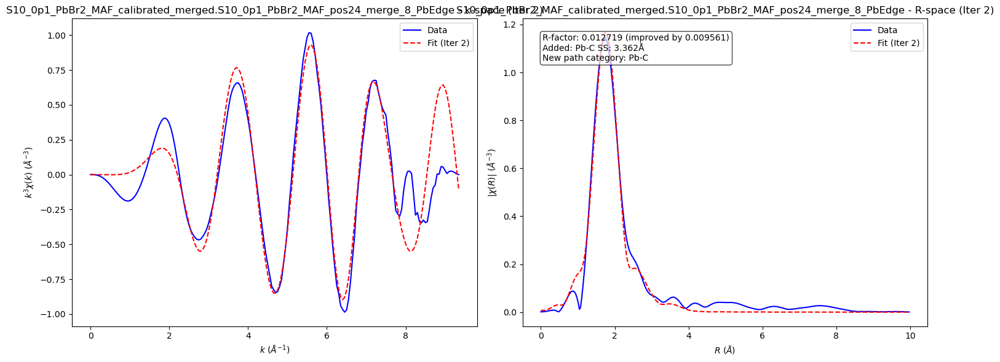

    Iteration 2 complete for S10_0p1_PbBr2_MAF_calibrated_merged.S10_0p1_PbBr2_MAF_pos24_merge_8_PbEdge.

Processing project: S11_0p1_PBBR2_MAAc_calibrated_PbL3

Processing group: S11_0p1_PBBR2_MAAc_calibrated_PbL3.S11_0p1_PbBr2_MAAc_pos24_merge_9_clean_PbL3
  Using amplitude value 0.7800 from iteration 1
  Available parameters from previous fit: ['amp', 'del_e0', 'n_PbO', 'pbo_delr', 'pbo_sig2', 'degen_dx6w2xh6_pcmc3p6bj', 's02_dx6w2xh6_pcmc3p6bj', 'e0_dx6w2xh6_pcmc3p6bj', 'ei_dx6w2xh6_pcmc3p6bj', 'deltar_dx6w2xh6_pcmc3p6bj', 'sigma2_dx6w2xh6_pcmc3p6bj', 'third_dx6w2xh6_pcmc3p6bj', 'fourth_dx6w2xh6_pcmc3p6bj']
  Found parameters for path types: ['Pb-O']
  Previous iteration R-factor: 0.117058
    Using 1 paths from previous iteration.
  Searching for candidate 'Pb-C' paths in C:\Users\kwill\.larch\feff\relaxed...
    Found 338 candidate paths for category 'Pb-C'.
    Filtered down to 15 candidate paths for testing.
  Found optimized kmin = 2.20 for kw=3
  Found optimized kmax = 8.65 f

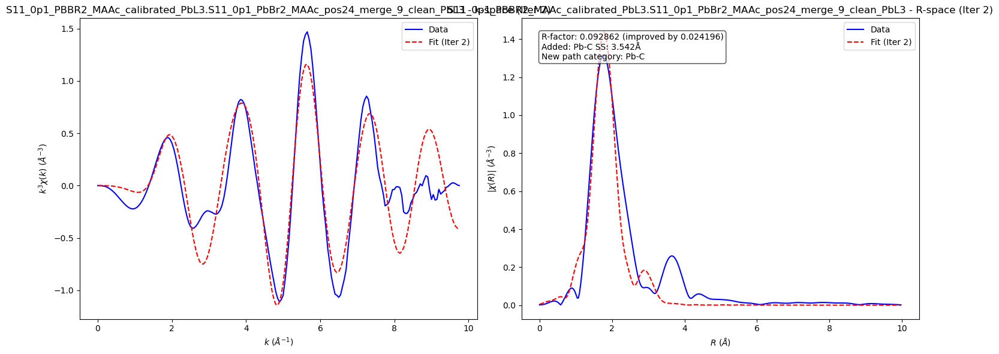

    Iteration 2 complete for S11_0p1_PBBR2_MAAc_calibrated_PbL3.S11_0p1_PbBr2_MAAc_pos24_merge_9_clean_PbL3.

Processing project: S14_0p3_PbBr2_MAAC_calibrated_PbL3

Processing group: S14_0p3_PbBr2_MAAC_calibrated_PbL3.S14_0p3_PbBr2_MAAc_pos24_merge_9_clean_PbL3
  Using amplitude value 0.7800 from iteration 1
  Available parameters from previous fit: ['amp', 'del_e0', 'n_PbO', 'pbo_delr', 'pbo_sig2', 'degen_dbv4powb_pcmc3p6bj', 's02_dbv4powb_pcmc3p6bj', 'e0_dbv4powb_pcmc3p6bj', 'ei_dbv4powb_pcmc3p6bj', 'deltar_dbv4powb_pcmc3p6bj', 'sigma2_dbv4powb_pcmc3p6bj', 'third_dbv4powb_pcmc3p6bj', 'fourth_dbv4powb_pcmc3p6bj']
  Found parameters for path types: ['Pb-O']
  Previous iteration R-factor: 0.145856
    Using 1 paths from previous iteration.
  Searching for candidate 'Pb-C' paths in C:\Users\kwill\.larch\feff\relaxed...
    Found 338 candidate paths for category 'Pb-C'.
    Filtered down to 15 candidate paths for testing.
  Found optimized kmin = 2.20 for kw=3
  Found optimized kmax = 9.

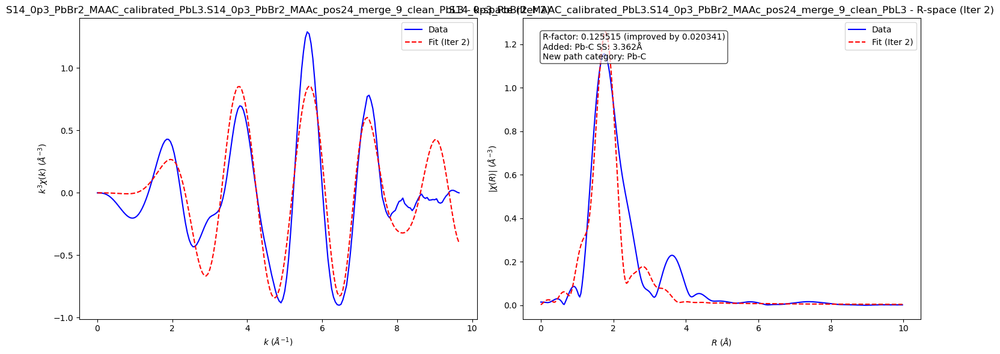

    Iteration 2 complete for S14_0p3_PbBr2_MAAC_calibrated_PbL3.S14_0p3_PbBr2_MAAc_pos24_merge_9_clean_PbL3.

Processing project: S15_0p3_PbBr2_MAP_calibrated_PbL3

Processing group: S15_0p3_PbBr2_MAP_calibrated_PbL3.S15_0p3_PbBr2_MAP_pos24_merge_9_clean_PbL3
  Using amplitude value 0.7800 from iteration 1
  Available parameters from previous fit: ['amp', 'del_e0', 'n_PbO', 'pbo_delr', 'pbo_sig2', 'degen_d7iolln4_pcmc3p6bj', 's02_d7iolln4_pcmc3p6bj', 'e0_d7iolln4_pcmc3p6bj', 'ei_d7iolln4_pcmc3p6bj', 'deltar_d7iolln4_pcmc3p6bj', 'sigma2_d7iolln4_pcmc3p6bj', 'third_d7iolln4_pcmc3p6bj', 'fourth_d7iolln4_pcmc3p6bj']
  Found parameters for path types: ['Pb-O']
  Previous iteration R-factor: 0.102542
    Using 1 paths from previous iteration.
  Searching for candidate 'Pb-C' paths in C:\Users\kwill\.larch\feff\relaxed...
    Found 338 candidate paths for category 'Pb-C'.
    Filtered down to 15 candidate paths for testing.
  Found optimized kmin = 2.20 for kw=3
  Found optimized kmax = 8.00 

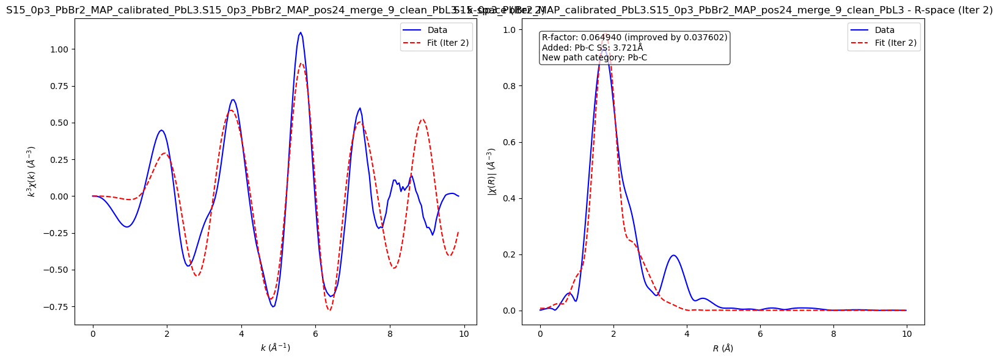

    Iteration 2 complete for S15_0p3_PbBr2_MAP_calibrated_PbL3.S15_0p3_PbBr2_MAP_pos24_merge_9_clean_PbL3.

Processing project: S17_0p5_PbBr2_MAAc_calibrated_PbL3

Processing group: S17_0p5_PbBr2_MAAc_calibrated_PbL3.S17_0p5_PbBr2_MAAc_pos24_merge_6_clean_PbL3
  Using amplitude value 0.7800 from iteration 1
  Available parameters from previous fit: ['amp', 'del_e0', 'n_PbO', 'pbo_delr', 'pbo_sig2', 'degen_dcaa2edb_pcmc3p6bj', 's02_dcaa2edb_pcmc3p6bj', 'e0_dcaa2edb_pcmc3p6bj', 'ei_dcaa2edb_pcmc3p6bj', 'deltar_dcaa2edb_pcmc3p6bj', 'sigma2_dcaa2edb_pcmc3p6bj', 'third_dcaa2edb_pcmc3p6bj', 'fourth_dcaa2edb_pcmc3p6bj']
  Found parameters for path types: ['Pb-O']
  Previous iteration R-factor: 0.092303
    Using 1 paths from previous iteration.
  Searching for candidate 'Pb-C' paths in C:\Users\kwill\.larch\feff\relaxed...
    Found 338 candidate paths for category 'Pb-C'.
    Filtered down to 15 candidate paths for testing.
  Found optimized kmin = 2.20 for kw=3
  Found optimized kmax = 7.85

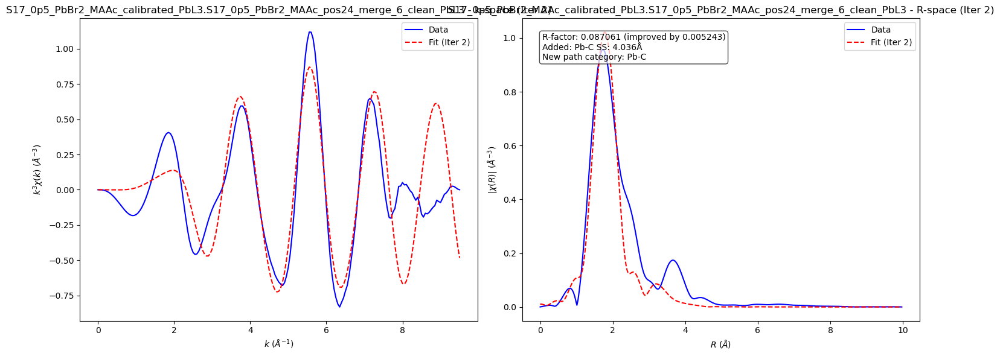

    Iteration 2 complete for S17_0p5_PbBr2_MAAc_calibrated_PbL3.S17_0p5_PbBr2_MAAc_pos24_merge_6_clean_PbL3.

Processing project: S18_0p5_PbBr2_MAP_calibrated_PbL3

Processing group: S18_0p5_PbBr2_MAP_calibrated_PbL3.S18_0p5_PbBr2_MAAc_pos_merge_6_clean_PbL3
  Using amplitude value 0.7800 from iteration 1
  Available parameters from previous fit: ['amp', 'del_e0', 'n_PbO', 'pbo_delr', 'pbo_sig2', 'degen_dgksed6q_pcmc3p6bj', 's02_dgksed6q_pcmc3p6bj', 'e0_dgksed6q_pcmc3p6bj', 'ei_dgksed6q_pcmc3p6bj', 'deltar_dgksed6q_pcmc3p6bj', 'sigma2_dgksed6q_pcmc3p6bj', 'third_dgksed6q_pcmc3p6bj', 'fourth_dgksed6q_pcmc3p6bj']
  Found parameters for path types: ['Pb-O']
  Previous iteration R-factor: 0.089712
    Using 1 paths from previous iteration.
  Searching for candidate 'Pb-C' paths in C:\Users\kwill\.larch\feff\relaxed...
    Found 338 candidate paths for category 'Pb-C'.
    Filtered down to 15 candidate paths for testing.
  Found optimized kmin = 2.20 for kw=3
  Found optimized kmax = 8.00 f

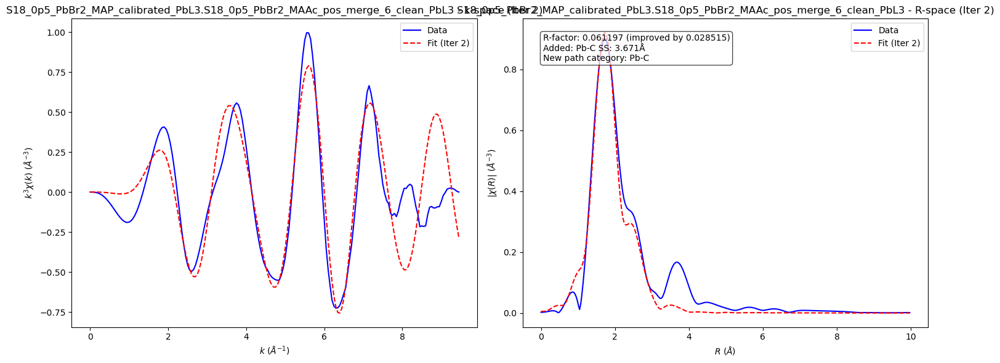

    Iteration 2 complete for S18_0p5_PbBr2_MAP_calibrated_PbL3.S18_0p5_PbBr2_MAAc_pos_merge_6_clean_PbL3.

Processing project: S1_0P1_PbI2_MAF_PbEdge

Processing group: S1_0P1_PbI2_MAF_PbEdge.S1_0p1_PbI2_MAF_pos_merge_17_clean_clean
  Using amplitude value 0.7800 from iteration 1
  Available parameters from previous fit: ['amp', 'del_e0', 'n_PbO', 'pbo_delr', 'pbo_sig2', 'degen_dtgzfgfq_pcmc3p6bj', 's02_dtgzfgfq_pcmc3p6bj', 'e0_dtgzfgfq_pcmc3p6bj', 'ei_dtgzfgfq_pcmc3p6bj', 'deltar_dtgzfgfq_pcmc3p6bj', 'sigma2_dtgzfgfq_pcmc3p6bj', 'third_dtgzfgfq_pcmc3p6bj', 'fourth_dtgzfgfq_pcmc3p6bj']
  Found parameters for path types: ['Pb-O']
  Previous iteration R-factor: 0.086599
    Using 1 paths from previous iteration.
  Searching for candidate 'Pb-C' paths in C:\Users\kwill\.larch\feff\relaxed...
    Found 338 candidate paths for category 'Pb-C'.
    Filtered down to 15 candidate paths for testing.
  Found optimized kmin = 2.20 for kw=3
  Found optimized kmax = 8.50 for kw=3
  Created transfor

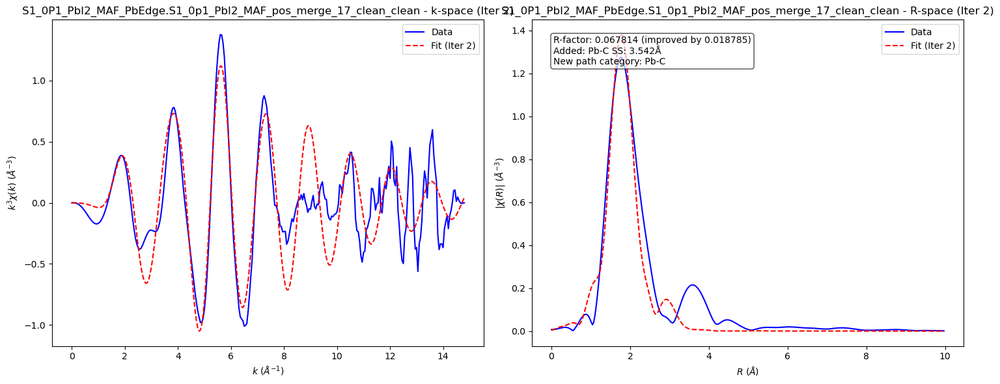

    Iteration 2 complete for S1_0P1_PbI2_MAF_PbEdge.S1_0p1_PbI2_MAF_pos_merge_17_clean_clean.

Processing project: S4_0p3_PbI2_MAF_calibrated

Processing group: S4_0p3_PbI2_MAF_calibrated.S4_0p3_PbI2_MAF_pos24_merge_6_clean
  Using amplitude value 0.7800 from iteration 1
  Available parameters from previous fit: ['amp', 'del_e0', 'n_PbO', 'pbo_delr', 'pbo_sig2', 'degen_dcrb7pmi_pcmc3p6bj', 's02_dcrb7pmi_pcmc3p6bj', 'e0_dcrb7pmi_pcmc3p6bj', 'ei_dcrb7pmi_pcmc3p6bj', 'deltar_dcrb7pmi_pcmc3p6bj', 'sigma2_dcrb7pmi_pcmc3p6bj', 'third_dcrb7pmi_pcmc3p6bj', 'fourth_dcrb7pmi_pcmc3p6bj']
  Found parameters for path types: ['Pb-O']
  Previous iteration R-factor: 0.058512
    Using 1 paths from previous iteration.
  Searching for candidate 'Pb-C' paths in C:\Users\kwill\.larch\feff\relaxed...
    Found 338 candidate paths for category 'Pb-C'.
    Filtered down to 15 candidate paths for testing.
  Found optimized kmin = 2.25 for kw=3
  Found optimized kmax = 7.65 for kw=3
  Created transform with k-

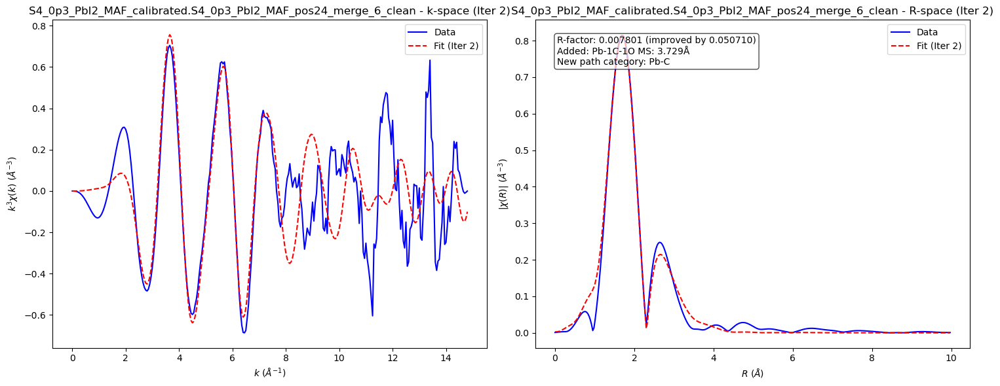

    Iteration 2 complete for S4_0p3_PbI2_MAF_calibrated.S4_0p3_PbI2_MAF_pos24_merge_6_clean.

Processing project: S6_PbI2_0p3_MAP_calibrated

Processing group: S6_PbI2_0p3_MAP_calibrated.S6_0p3_PbI2_MAP_pos16_merge_6_clean
  Using amplitude value 0.7800 from iteration 1
  Available parameters from previous fit: ['amp', 'del_e0', 'n_PbO', 'pbo_delr', 'pbo_sig2', 'degen_dkm54lbz_pcmc3p6bj', 's02_dkm54lbz_pcmc3p6bj', 'e0_dkm54lbz_pcmc3p6bj', 'ei_dkm54lbz_pcmc3p6bj', 'deltar_dkm54lbz_pcmc3p6bj', 'sigma2_dkm54lbz_pcmc3p6bj', 'third_dkm54lbz_pcmc3p6bj', 'fourth_dkm54lbz_pcmc3p6bj']
  Found parameters for path types: ['Pb-O']
  Previous iteration R-factor: 0.088315
    Using 1 paths from previous iteration.
  Searching for candidate 'Pb-C' paths in C:\Users\kwill\.larch\feff\relaxed...
    Found 338 candidate paths for category 'Pb-C'.
    Filtered down to 15 candidate paths for testing.
  Found optimized kmin = 2.20 for kw=3
  Found optimized kmax = 8.00 for kw=3
  Created transform with k-r

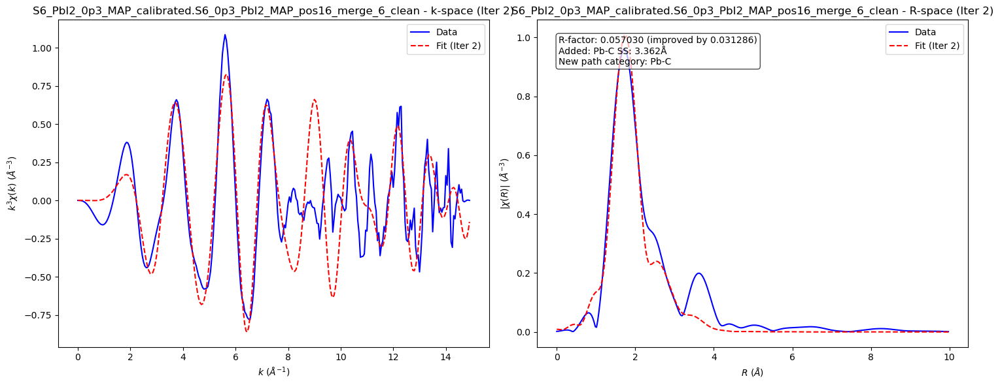

    Iteration 2 complete for S6_PbI2_0p3_MAP_calibrated.S6_0p3_PbI2_MAP_pos16_merge_6_clean.

ITERATION 2 SUMMARY - Enhanced Analysis
Successfully processed 9 groups
Target category for this iteration: Pb-C

------------------------------------------------------------------------------------------------------------------------
DETAILED FITTING RESULTS BY GROUP
------------------------------------------------------------------------------------------------------------------------

📊 GROUP: S10_0p1_PbBr2_MAF_calibrated_merged.S10_0p1_PbBr2_MAF_pos24_merge_8_PbEdge
   Current Iteration: 2
   R-factor: 0.012719
   📋 REFINED PARAMETERS:
      amp          = 0.7800 ± 0.0000 (amplitude reduction factor)
      degen_d25zzrtu_pcmc3p6bj = 1.0 ± N/A
      degen_d25zzrtu_plgfrkx77 = 1.0 ± N/A
      del_e0       =   -8.90 ± 1.6795 eV (energy shift)
      deltar_d25zzrtu_pcmc3p6bj = -0.05356514583408495 ± 0.0136
      deltar_d25zzrtu_plgfrkx77 = 0.029502267794295434 ± 0.0457
      e0_d25zzrtu_pcmc3p

In [9]:
# Specify parameters
feff_category = "Pb-C"
iteration = 2
feff_base_dir = r'C:/Users/kwill/.larch/feff/relaxed'

# Run the iterative fit
iteration2_params = iterative_fit_all(
    projects, 
    feff_category=feff_category, 
    iteration=iteration, 
    feff_base_dir=feff_base_dir
)



Processing project: S10_0p1_PbBr2_MAF_calibrated_merged

Processing group: S10_0p1_PbBr2_MAF_calibrated_merged.S10_0p1_PbBr2_MAF_pos24_merge_8_PbEdge
  Using amplitude value 0.7800 from iteration 1
  Available parameters from previous fit: ['amp', 'del_e0', 'n_PbC', 'n_PbO', 'pbc_delr', 'pbc_sig2', 'pbo_delr', 'pbo_sig2', 'degen_d25zzrtu_pcmc3p6bj', 's02_d25zzrtu_pcmc3p6bj', 'e0_d25zzrtu_pcmc3p6bj', 'ei_d25zzrtu_pcmc3p6bj', 'deltar_d25zzrtu_pcmc3p6bj', 'sigma2_d25zzrtu_pcmc3p6bj', 'third_d25zzrtu_pcmc3p6bj', 'fourth_d25zzrtu_pcmc3p6bj', 'degen_d25zzrtu_plgfrkx77', 's02_d25zzrtu_plgfrkx77', 'e0_d25zzrtu_plgfrkx77', 'ei_d25zzrtu_plgfrkx77', 'deltar_d25zzrtu_plgfrkx77', 'sigma2_d25zzrtu_plgfrkx77', 'third_d25zzrtu_plgfrkx77', 'fourth_d25zzrtu_plgfrkx77']
  Found parameters for path types: ['Pb-O', 'Pb-C']
  Previous iteration R-factor: 0.012719
    Using 2 paths from previous iteration.
  Searching for candidate 'Pb-C' paths in C:\Users\kwill\.larch\feff\relaxed...
    Found 338 candidat

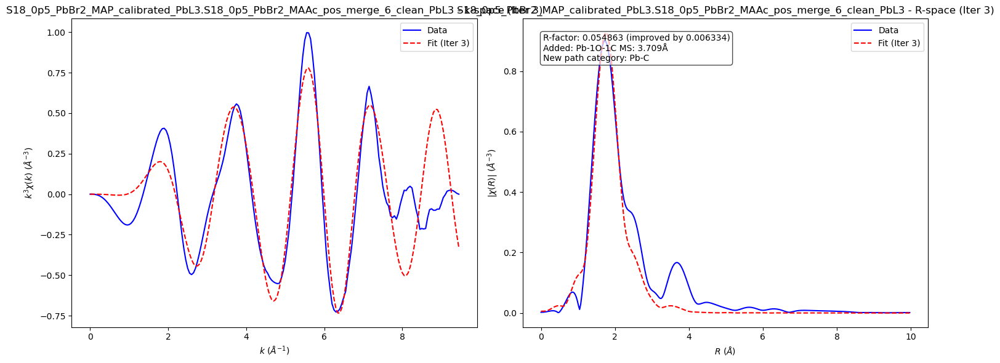

    Iteration 3 complete for S18_0p5_PbBr2_MAP_calibrated_PbL3.S18_0p5_PbBr2_MAAc_pos_merge_6_clean_PbL3.

Processing project: S1_0P1_PbI2_MAF_PbEdge

Processing group: S1_0P1_PbI2_MAF_PbEdge.S1_0p1_PbI2_MAF_pos_merge_17_clean_clean
  Using amplitude value 0.7800 from iteration 1
  Available parameters from previous fit: ['amp', 'del_e0', 'n_PbC', 'n_PbO', 'pbc_delr', 'pbc_sig2', 'pbo_delr', 'pbo_sig2', 'degen_dtgzfgfq_pcmc3p6bj', 's02_dtgzfgfq_pcmc3p6bj', 'e0_dtgzfgfq_pcmc3p6bj', 'ei_dtgzfgfq_pcmc3p6bj', 'deltar_dtgzfgfq_pcmc3p6bj', 'sigma2_dtgzfgfq_pcmc3p6bj', 'third_dtgzfgfq_pcmc3p6bj', 'fourth_dtgzfgfq_pcmc3p6bj', 'degen_dtgzfgfq_pokl2jxpo', 's02_dtgzfgfq_pokl2jxpo', 'e0_dtgzfgfq_pokl2jxpo', 'ei_dtgzfgfq_pokl2jxpo', 'deltar_dtgzfgfq_pokl2jxpo', 'sigma2_dtgzfgfq_pokl2jxpo', 'third_dtgzfgfq_pokl2jxpo', 'fourth_dtgzfgfq_pokl2jxpo']
  Found parameters for path types: ['Pb-O', 'Pb-C']
  Previous iteration R-factor: 0.067814
    Using 2 paths from previous iteration.
  Searching for cand

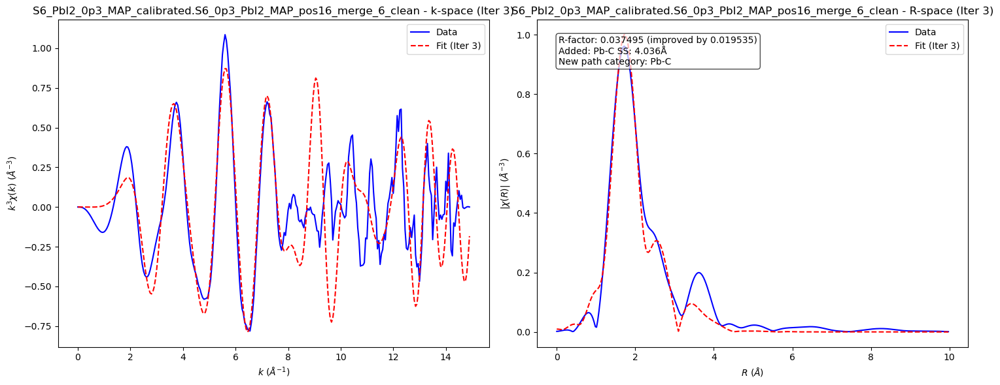

    Iteration 3 complete for S6_PbI2_0p3_MAP_calibrated.S6_0p3_PbI2_MAP_pos16_merge_6_clean.

ITERATION 3 SUMMARY - Enhanced Analysis
Successfully processed 2 groups
Target category for this iteration: Pb-C

------------------------------------------------------------------------------------------------------------------------
DETAILED FITTING RESULTS BY GROUP
------------------------------------------------------------------------------------------------------------------------

📊 GROUP: S10_0p1_PbBr2_MAF_calibrated_merged.S10_0p1_PbBr2_MAF_pos24_merge_8_PbEdge
   Current Iteration: 2
   R-factor: 0.012719
   📋 REFINED PARAMETERS:
      amp          = 0.7800 ± N/A (amplitude reduction factor)
      del_e0       =   -8.90 ± N/A eV (energy shift)
      n_PbC        =    0.57 ± N/A (coordination number for PbC)
      n_PbO        =    2.10 ± N/A (coordination number for PbO)
      pbc_delr     = +0.0295 ± N/A Å (bond length change for Pb-C)
      pbc_sig2     = 0.000000 ± N/A Å² (Debye-W

In [10]:
# Use the same function for a third iteration with Pb-C paths
iteration3_params = iterative_fit_all(
    projects, 
    feff_category="Pb-C", 
    iteration=3, 
    feff_base_dir=feff_base_dir,
    previous_params=iteration2_params
)